In [ ]:
import itertools
import os
import matplotlib.pylab as plt
import numpy as np

import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
!pip install split_folders

In [ ]:
import splitfolders

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
input_folder = "/content/drive/MyDrive/Resnet input"
output = "/content/drive/MyDrive/Manual resnet output"
splitfolders.ratio(input_folder, output, seed=42, ratio=(.6, .2, .2))

Copying files: 7683 files [31:49,  4.02 files/s]


In [ ]:
from tensorflow.keras.layers import Conv2D,Flatten,Dense,MaxPool2D,BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

In [ ]:
img_height, img_width = (224,224)
batch_size = 32

train_data_dir = r"/content/drive/MyDrive/Manual resnet output/train"
valid_data_dir = r"/content/drive/MyDrive/Manual resnet output/val"
test_data_dir = r"/content/drive/MyDrive/Manual resnet output/test"

In [ ]:
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True,
                                   validation_split=0.4)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training')

valid_generator = train_datagen.flow_from_directory(
    valid_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation')

Found 2769 images belonging to 15 classes.
Found 610 images belonging to 15 classes.


In [ ]:
test_generator = train_datagen.flow_from_directory(
    test_data_dir,
    target_size=(img_height, img_width),
    batch_size=1,
    class_mode='categorical',
    subset='validation')

Found 611 images belonging to 15 classes.


In [ ]:
x,y = test_generator.next()
x.shape

(1, 224, 224, 3)

In [ ]:
base_model = ResNet50(include_top=False, weights='imagenet')
np.random.seed(7)
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(train_generator.num_classes, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)
for layer in base_model.layers:
  layer.trainable = False

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics = ['accuracy'])

model_history = model.fit(train_generator, epochs=20)

94781440/94765736 [==============================] - 1s 0us/step
Epoch 1/20
87/87 [==============================] - 481s 5s/step - loss: 0.1693 - accuracy: 0.9549
Epoch 2/20
87/87 [==============================] - 474s 5s/step - loss: 0.0162 - accuracy: 0.9949
Epoch 3/20
87/87 [==============================] - 466s 5s/step - loss: 0.0212 - accuracy: 0.9939
Epoch 4/20
87/87 [==============================] - 468s 5s/step - loss: 0.0297 - accuracy: 0.9949
Epoch 5/20
87/87 [==============================] - 474s 5s/step - loss: 0.0085 - accuracy: 0.9989
Epoch 6/20
87/87 [==============================] - 471s 5s/step - loss: 9.6898e-04 - accuracy: 0.9993
Epoch 7/20
87/87 [==============================] - 465s 5s/step - loss: 1.5128e-04 - accuracy: 1.0000
Epoch 8/20
87/87 [==============================] - 467s 5s/step - loss: 5.4299e-05 - accuracy: 1.0000
Epoch 9/20
87/87 [==============================] - 465s 5s/step - loss: 8.5830e-05 - accuracy: 1.0000
Epoch 10/20
87/87 [=========

In [ ]:
model.save('/content/drive/MyDrive/Manual resnet h5/base_model.h5')

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


In [ ]:
test_loss, test_acc = model.evaluate(test_generator, verbose=2)
print('\ntest accuracy:',test_acc)

611/611 - 126s - loss: 0.0392 - accuracy: 0.9935

test accuracy: 0.9934533834457397


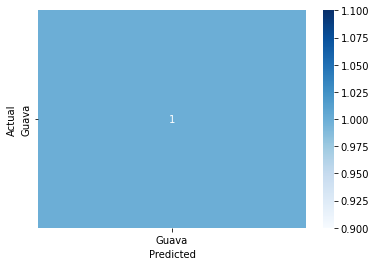

test accuracy : 100.0


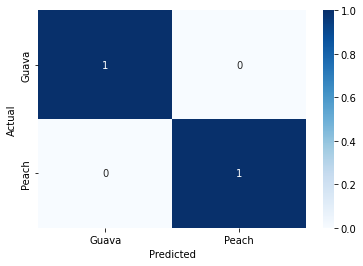

test accuracy : 100.0


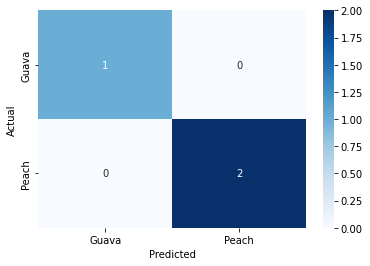

test accuracy : 100.0


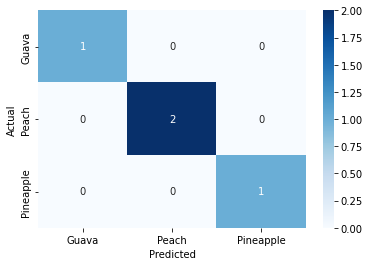

test accuracy : 100.0


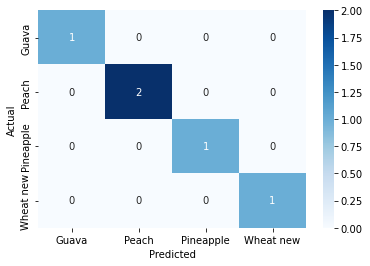

test accuracy : 100.0


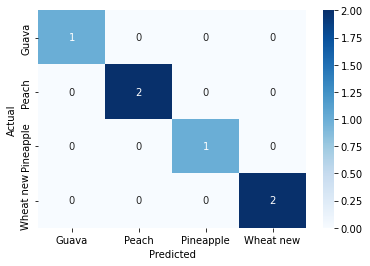

test accuracy : 100.0


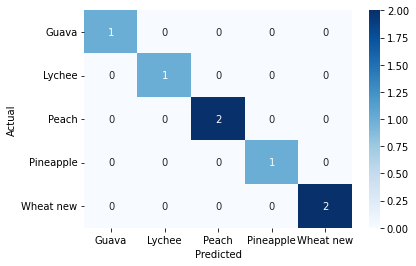

test accuracy : 100.0


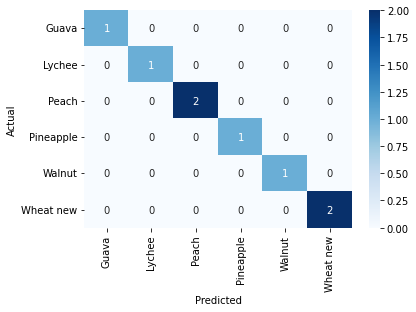

test accuracy : 100.0


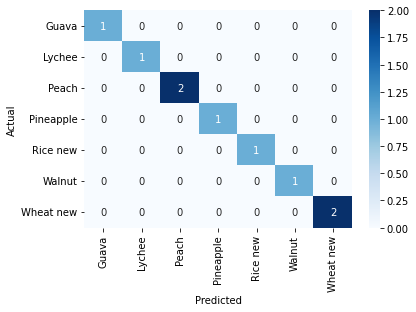

test accuracy : 100.0


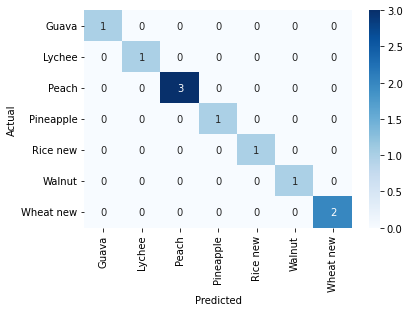

test accuracy : 100.0


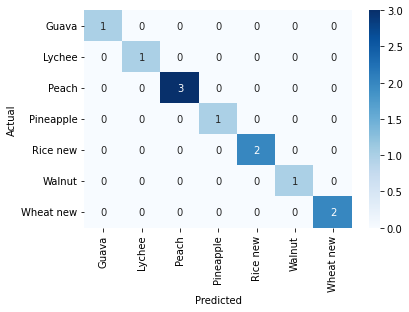

test accuracy : 100.0


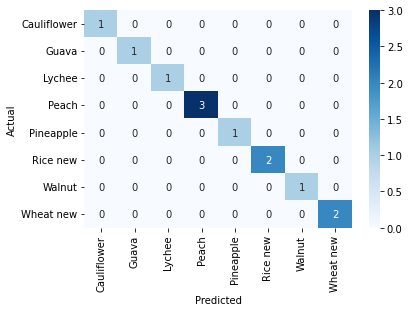

test accuracy : 100.0


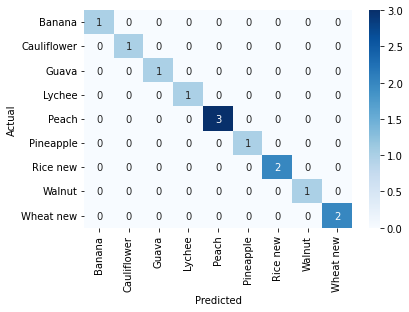

test accuracy : 100.0


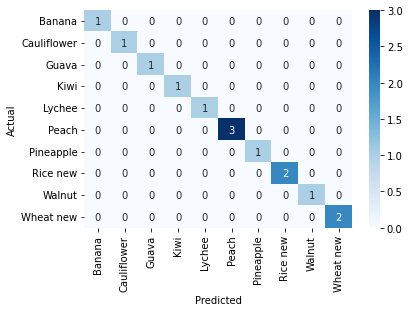

test accuracy : 100.0


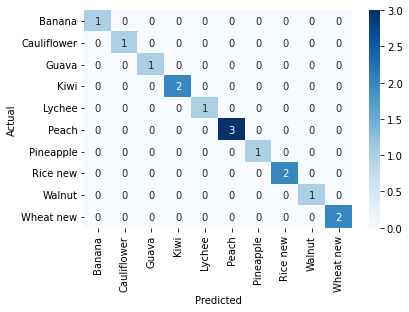

test accuracy : 100.0


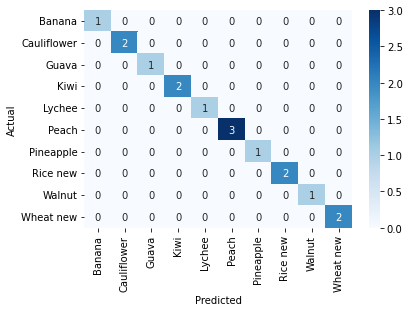

test accuracy : 100.0


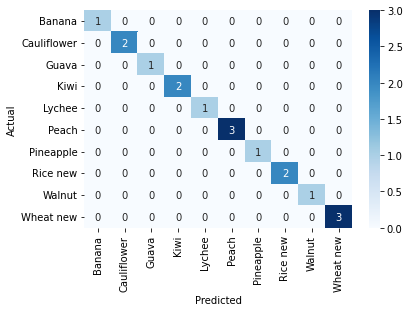

test accuracy : 100.0


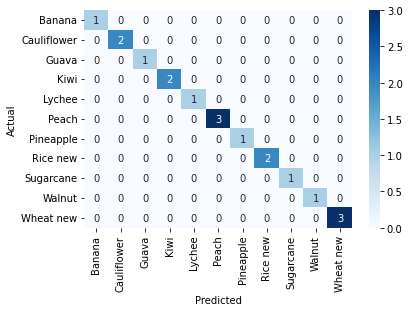

test accuracy : 100.0


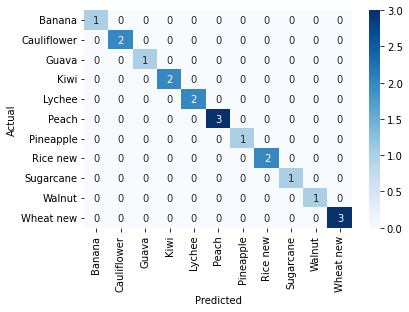

test accuracy : 100.0


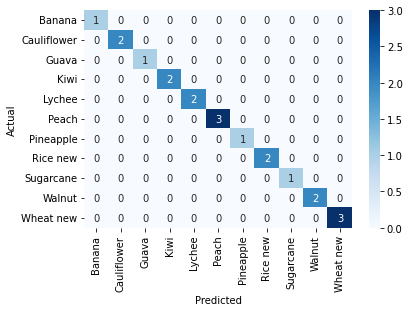

test accuracy : 100.0


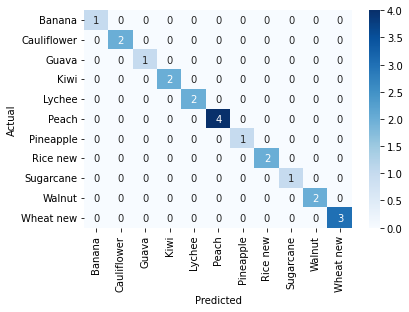

test accuracy : 100.0


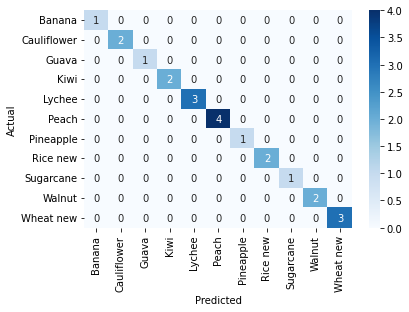

test accuracy : 100.0


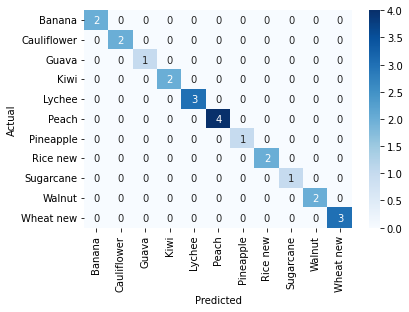

test accuracy : 100.0


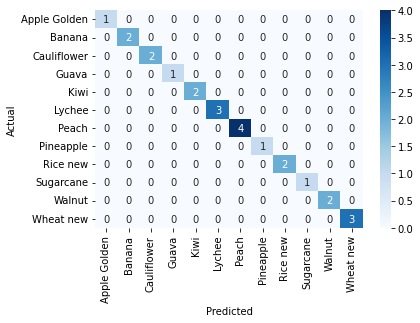

test accuracy : 100.0


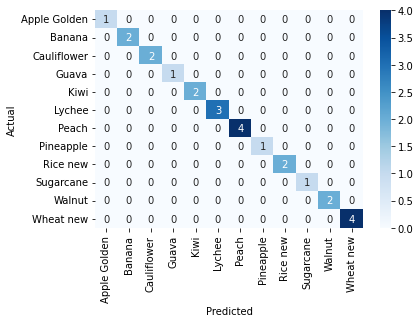

test accuracy : 100.0


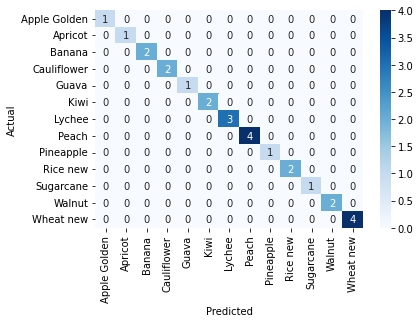

test accuracy : 100.0


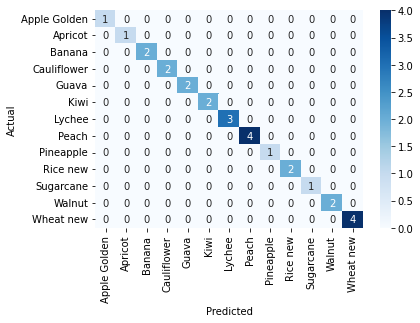

test accuracy : 100.0


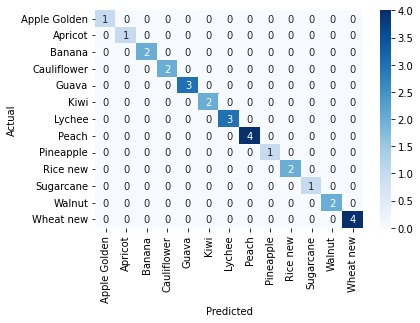

test accuracy : 100.0


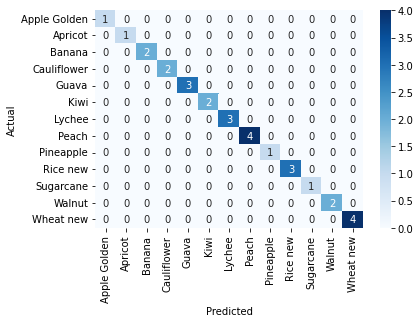

test accuracy : 100.0


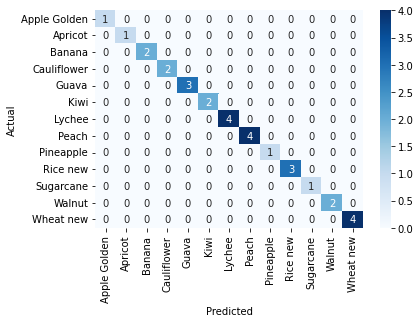

test accuracy : 100.0


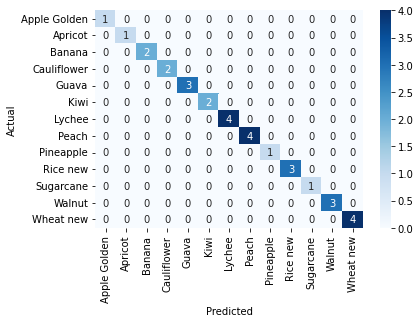

test accuracy : 100.0


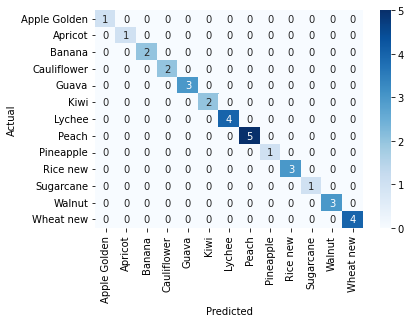

test accuracy : 100.0


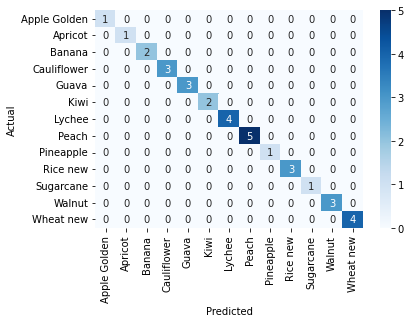

test accuracy : 100.0


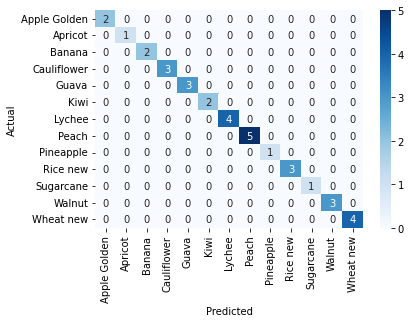

test accuracy : 100.0


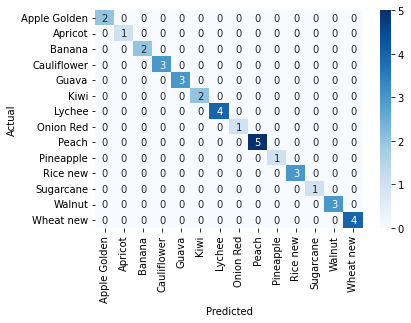

test accuracy : 100.0


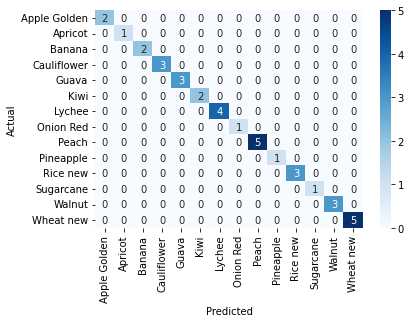

test accuracy : 100.0


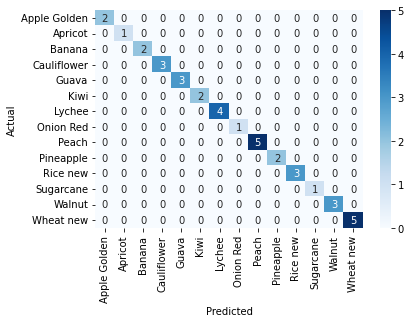

test accuracy : 100.0


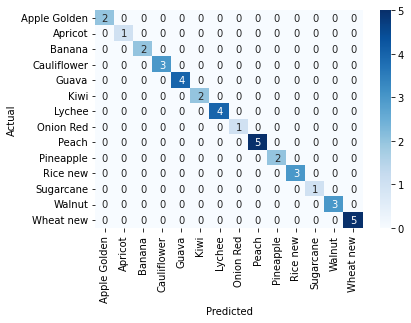

test accuracy : 100.0


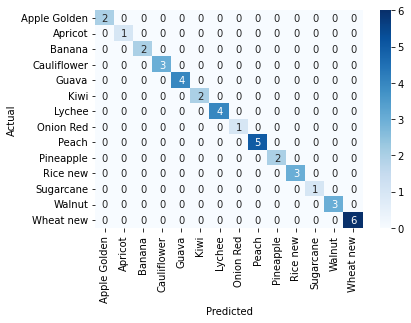

test accuracy : 100.0


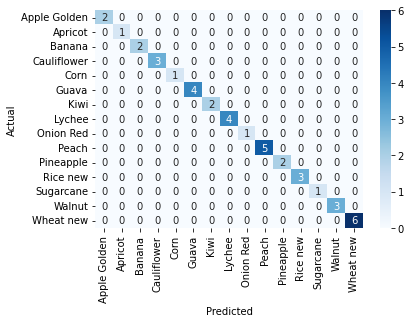

test accuracy : 100.0


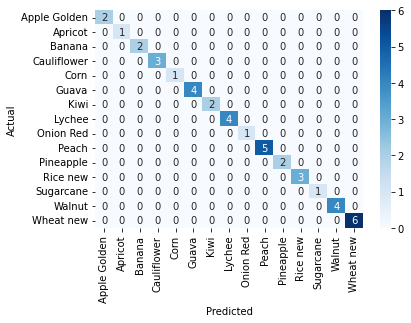

test accuracy : 100.0


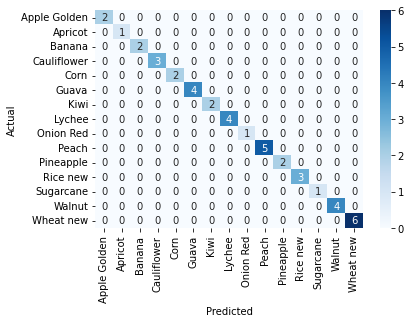

test accuracy : 100.0


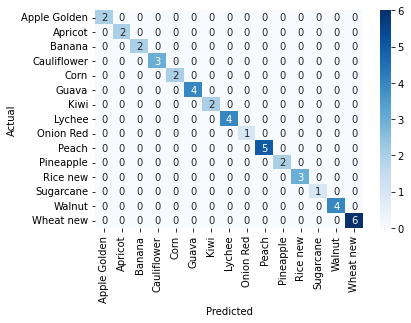

test accuracy : 100.0


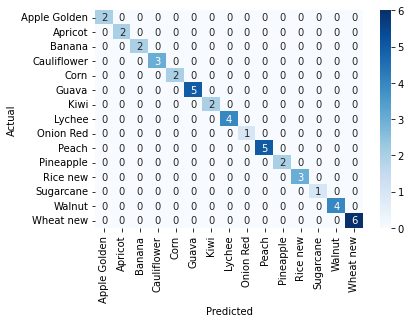

test accuracy : 100.0


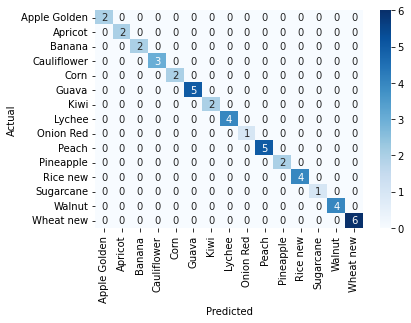

test accuracy : 100.0


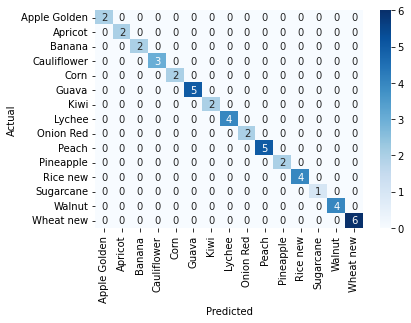

test accuracy : 100.0


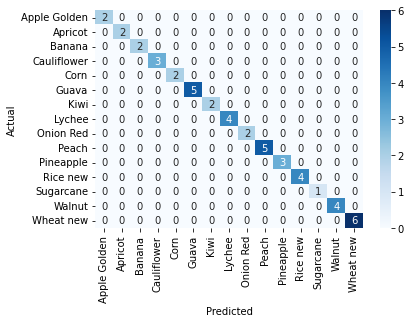

test accuracy : 100.0


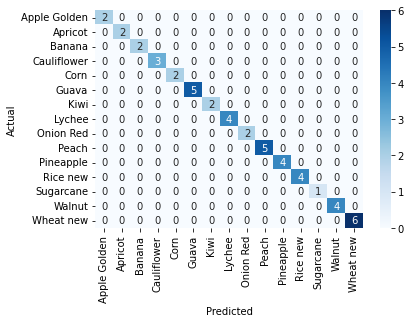

test accuracy : 100.0


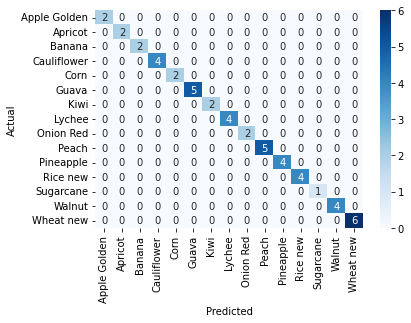

test accuracy : 100.0


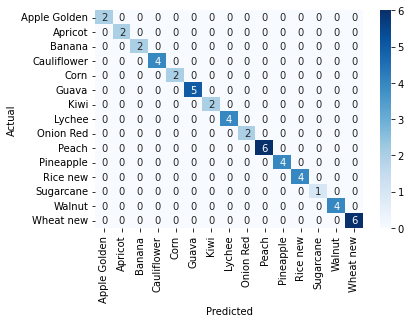

test accuracy : 100.0


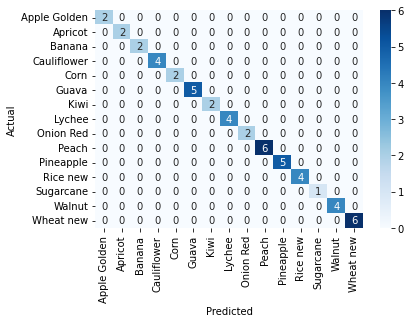

test accuracy : 100.0


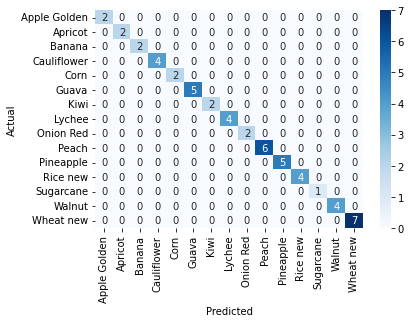

test accuracy : 100.0


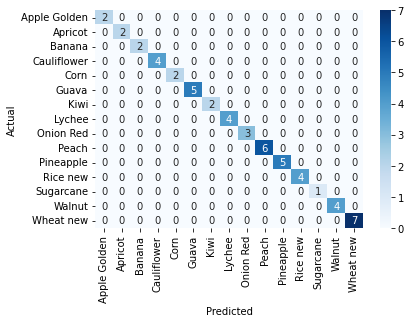

test accuracy : 100.0


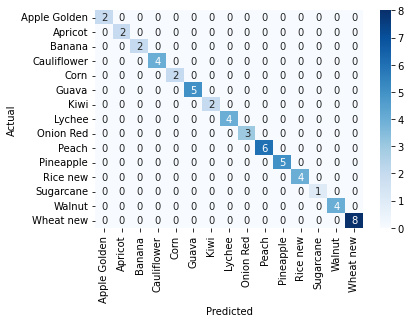

test accuracy : 100.0


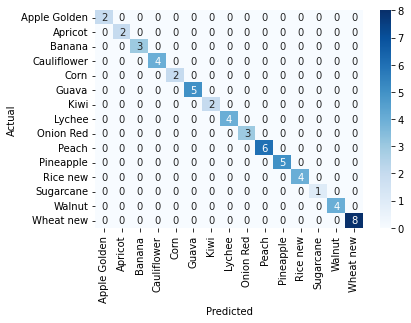

test accuracy : 100.0


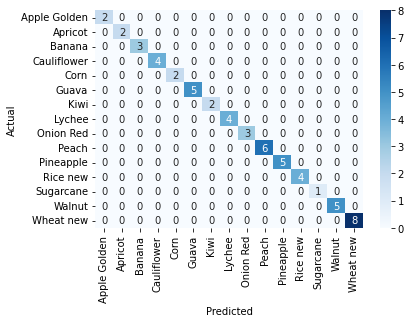

test accuracy : 100.0


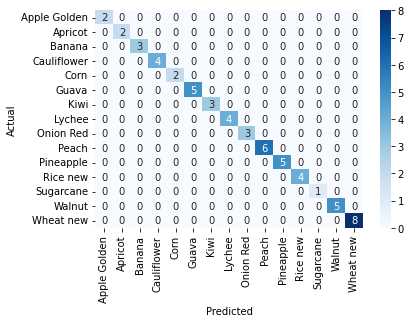

test accuracy : 100.0


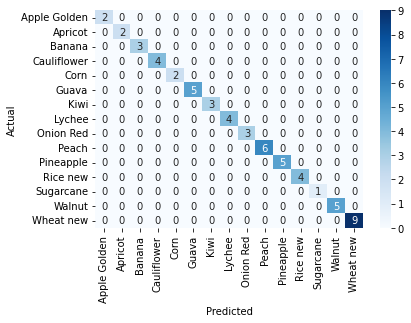

test accuracy : 100.0


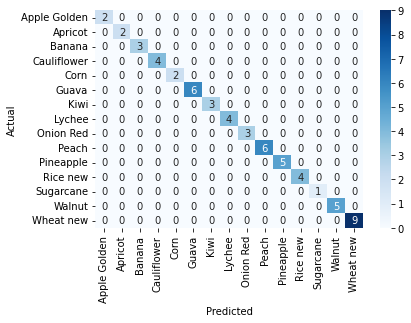

test accuracy : 100.0


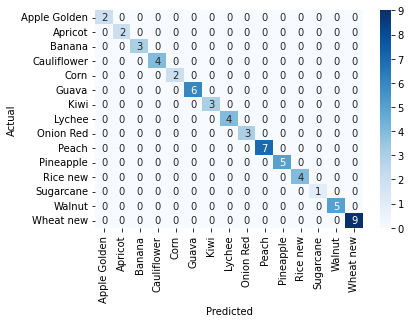

test accuracy : 100.0


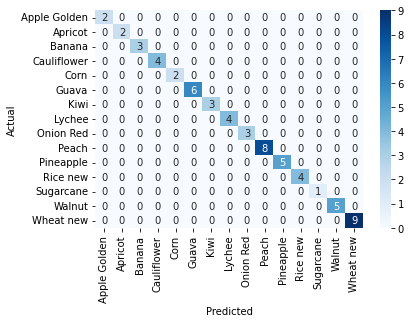

test accuracy : 100.0


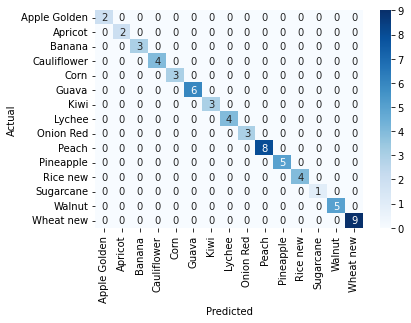

test accuracy : 100.0


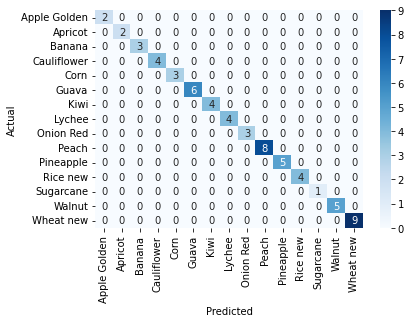

test accuracy : 100.0


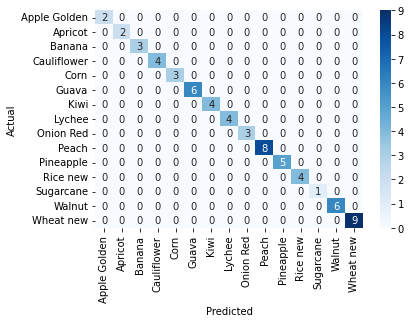

test accuracy : 100.0


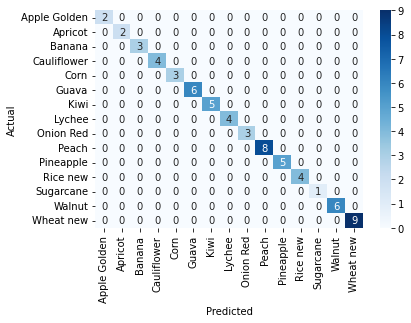

test accuracy : 100.0


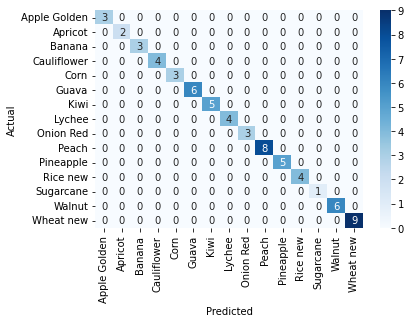

test accuracy : 100.0


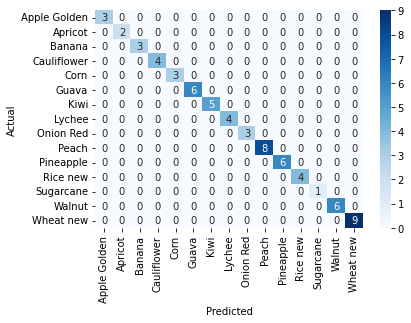

test accuracy : 100.0


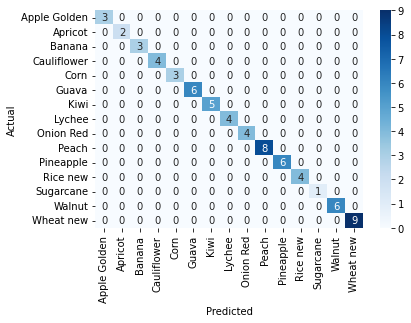

test accuracy : 100.0


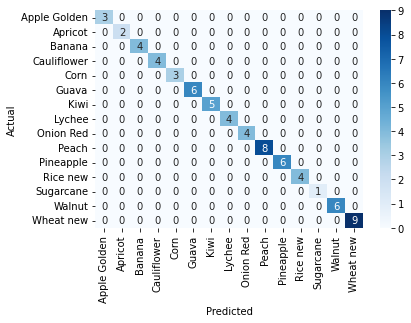

test accuracy : 100.0


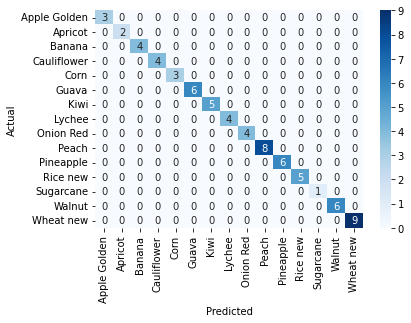

test accuracy : 100.0


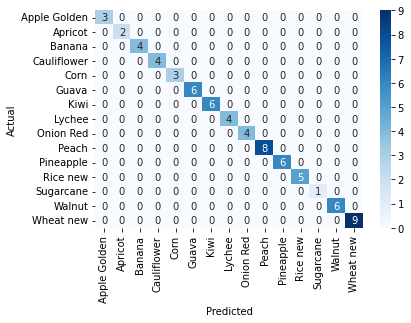

test accuracy : 100.0


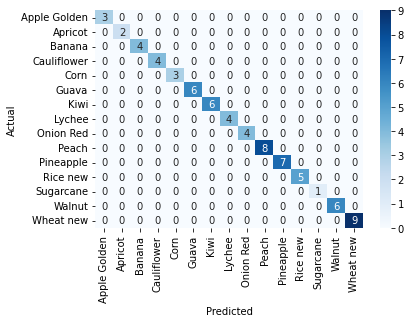

test accuracy : 100.0


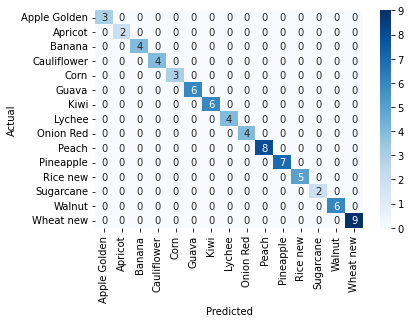

test accuracy : 100.0


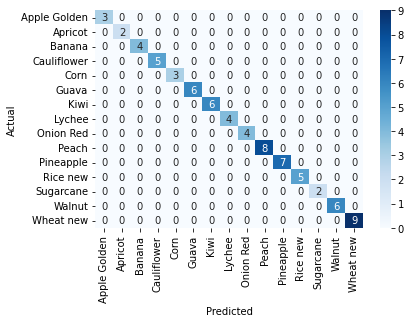

test accuracy : 100.0


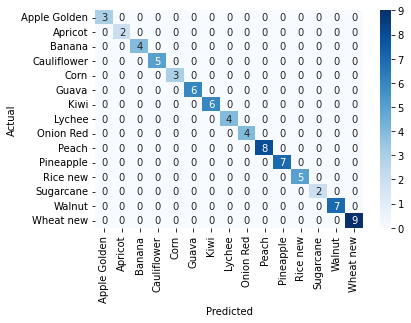

test accuracy : 100.0


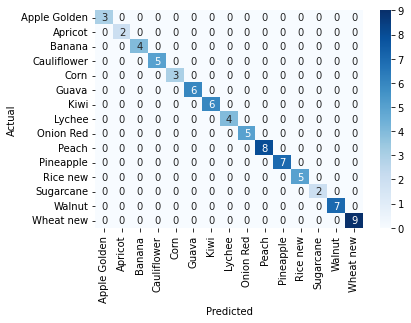

test accuracy : 100.0


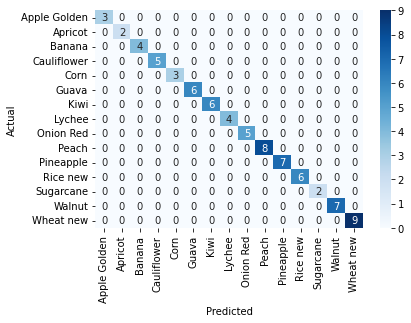

test accuracy : 100.0


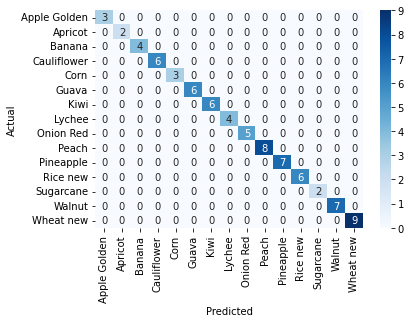

test accuracy : 100.0


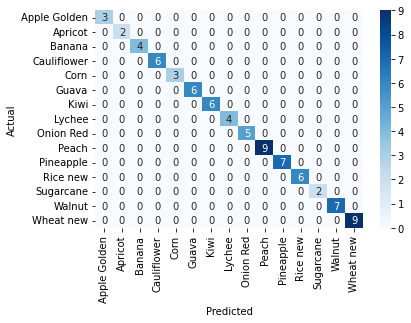

test accuracy : 100.0


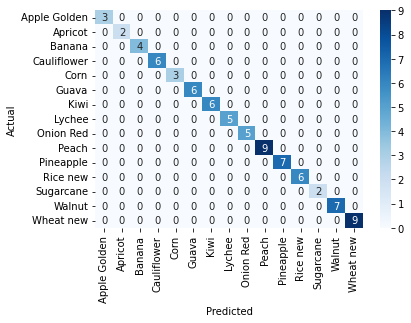

test accuracy : 100.0


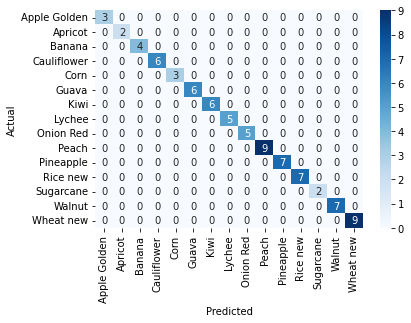

test accuracy : 100.0


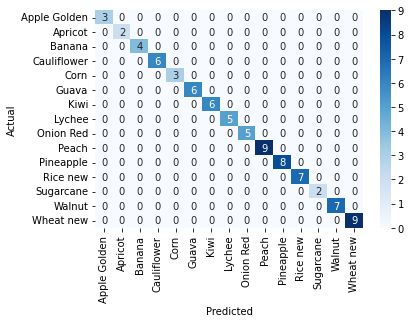

test accuracy : 100.0


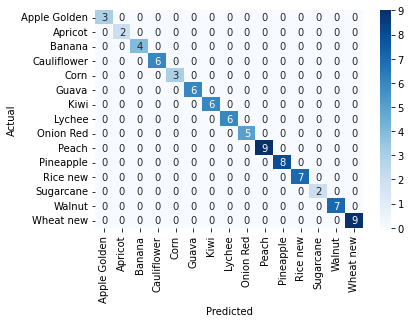

test accuracy : 100.0


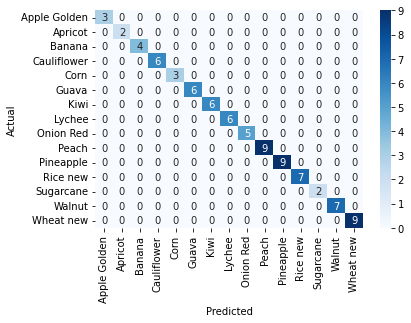

test accuracy : 100.0


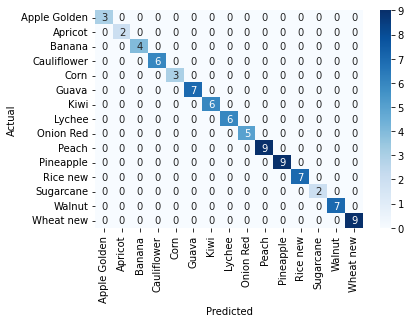

test accuracy : 100.0


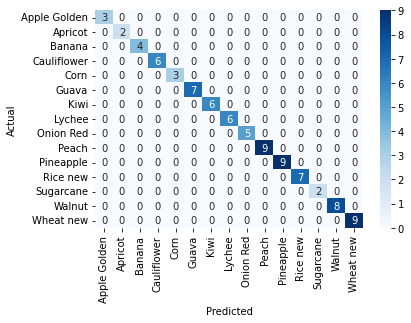

test accuracy : 100.0


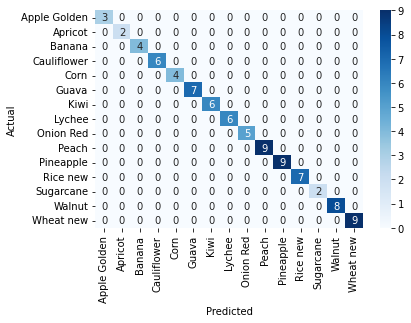

test accuracy : 100.0


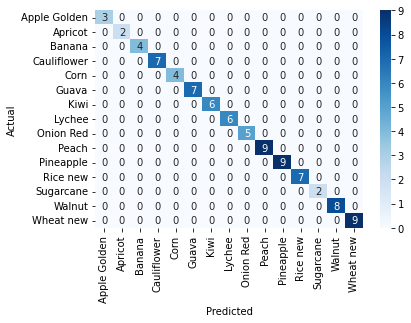

test accuracy : 100.0


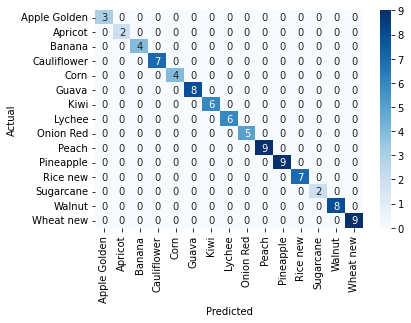

test accuracy : 100.0


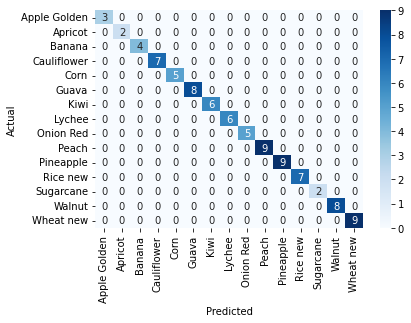

test accuracy : 100.0


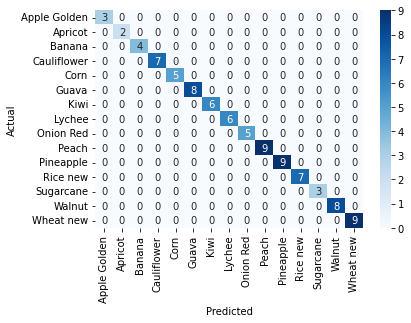

test accuracy : 100.0


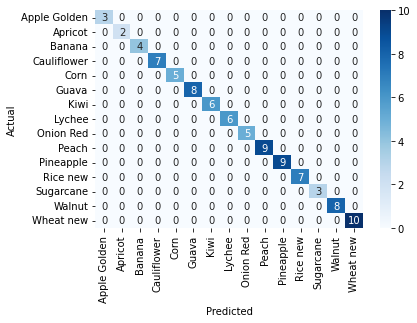

test accuracy : 100.0


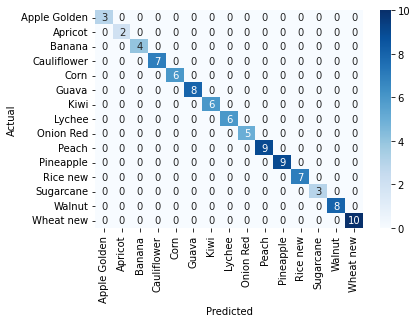

test accuracy : 100.0


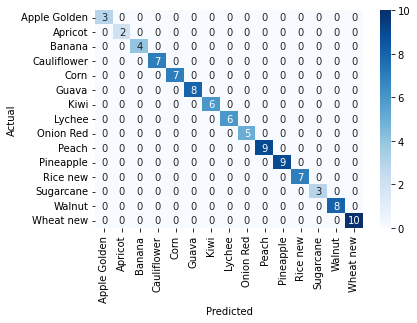

test accuracy : 100.0


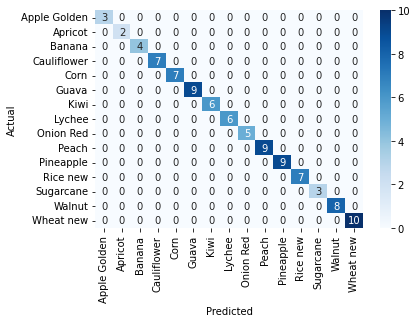

test accuracy : 100.0


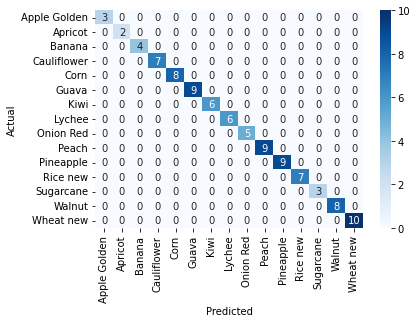

test accuracy : 100.0


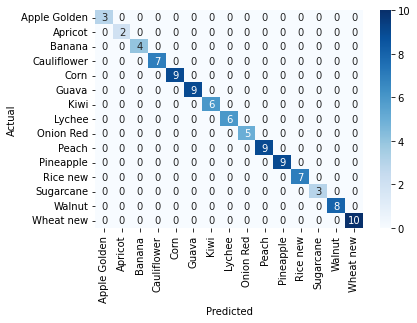

test accuracy : 100.0


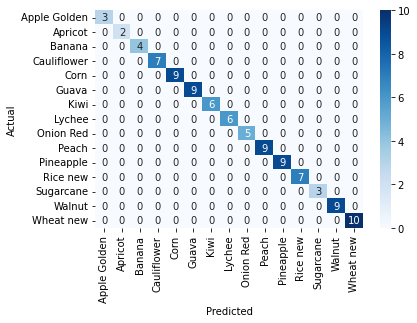

test accuracy : 100.0


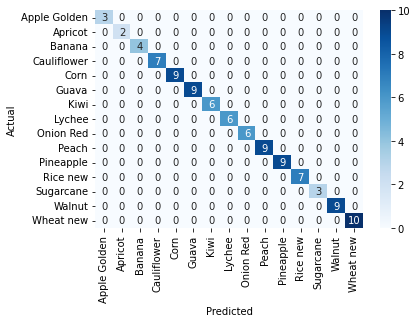

test accuracy : 100.0


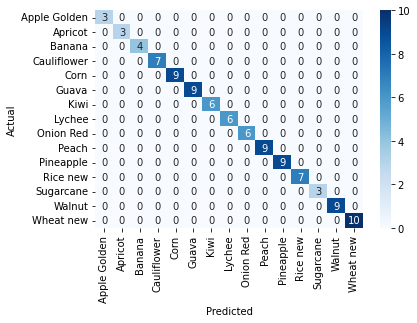

test accuracy : 100.0


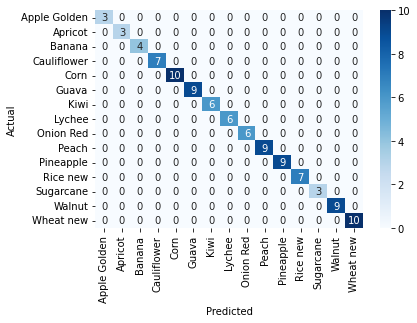

test accuracy : 100.0


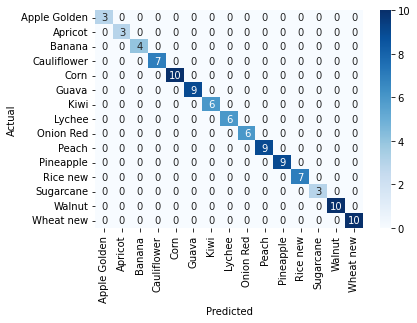

test accuracy : 100.0


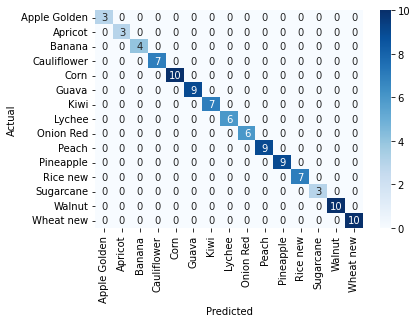

test accuracy : 100.0


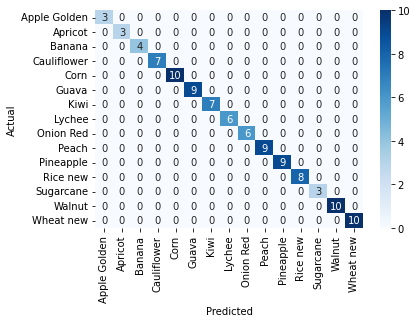

test accuracy : 100.0


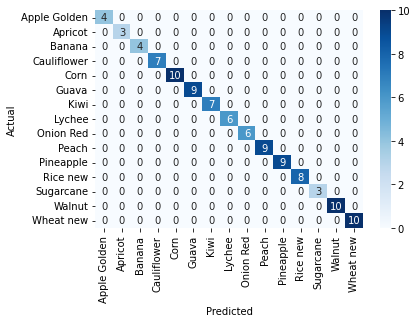

test accuracy : 100.0


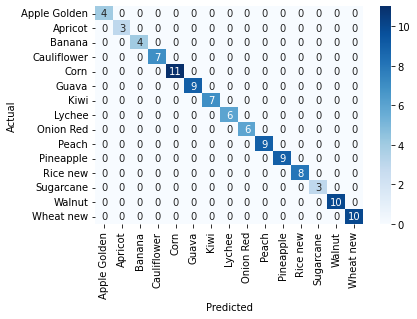

test accuracy : 100.0


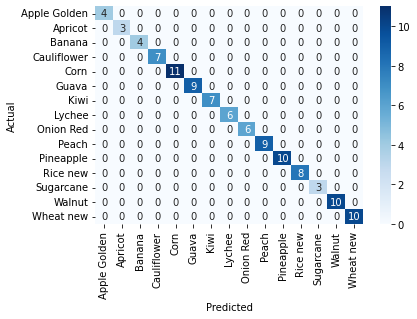

test accuracy : 100.0


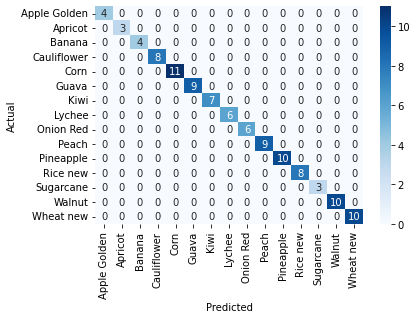

test accuracy : 100.0


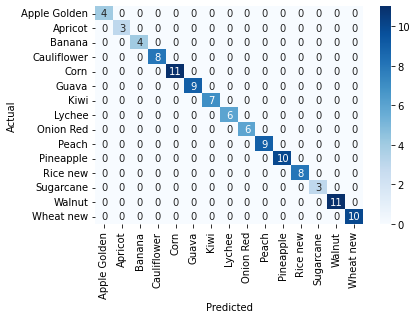

test accuracy : 100.0


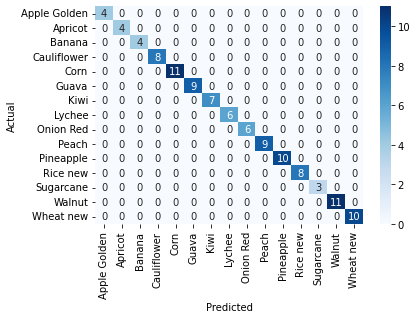

test accuracy : 100.0


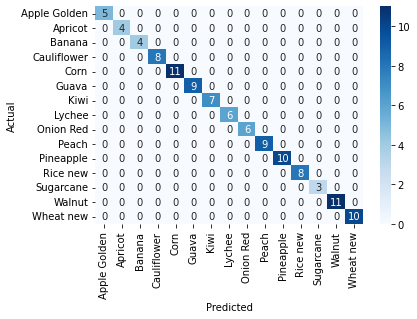

test accuracy : 100.0


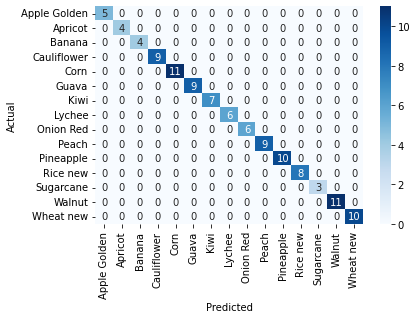

test accuracy : 100.0


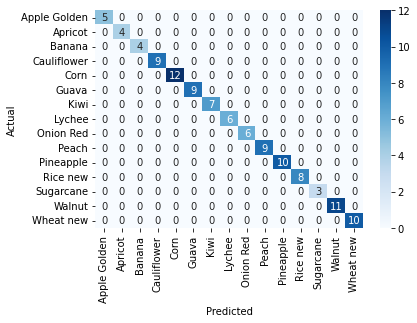

test accuracy : 100.0


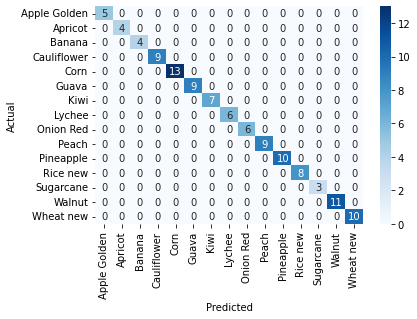

test accuracy : 100.0


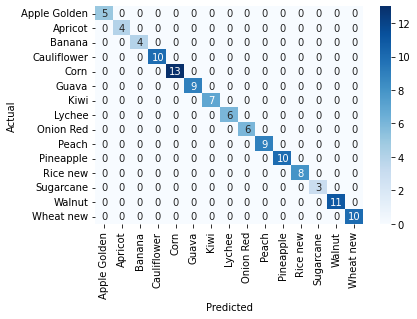

test accuracy : 100.0


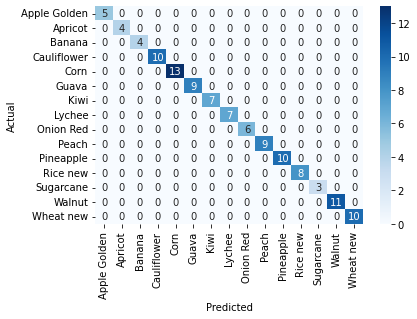

test accuracy : 100.0


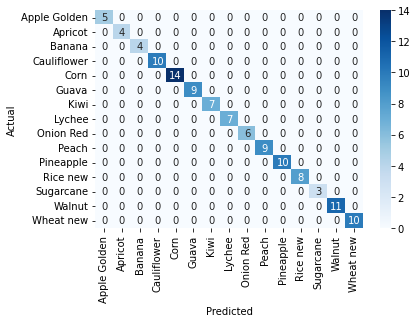

test accuracy : 100.0


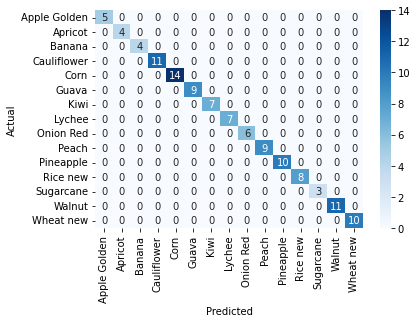

test accuracy : 100.0


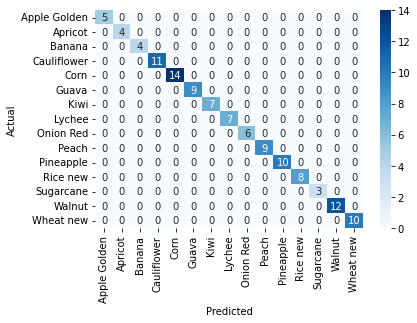

test accuracy : 100.0


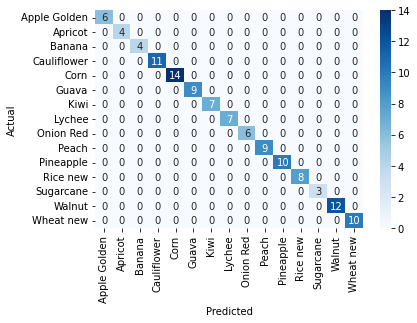

test accuracy : 100.0


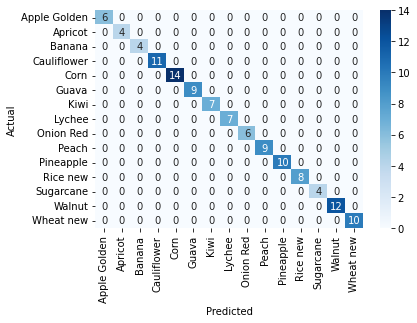

test accuracy : 100.0


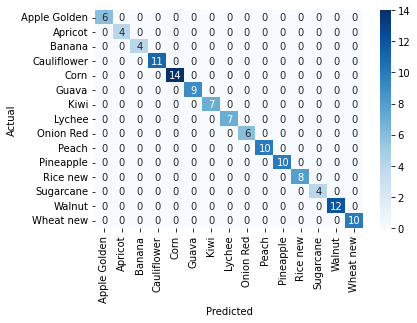

test accuracy : 100.0


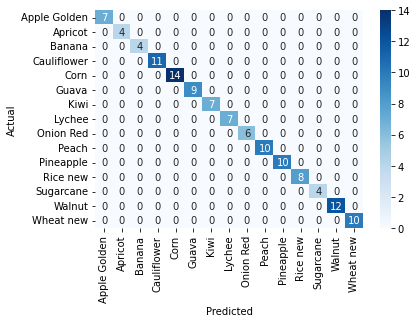

test accuracy : 100.0


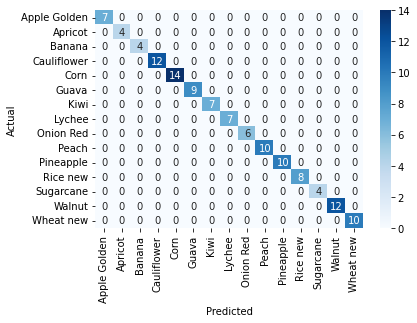

test accuracy : 100.0


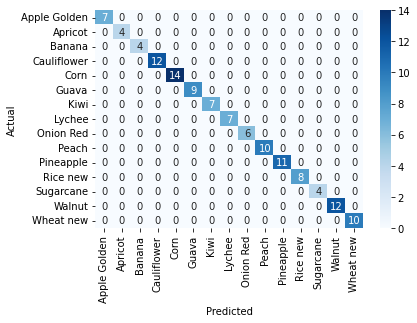

test accuracy : 100.0


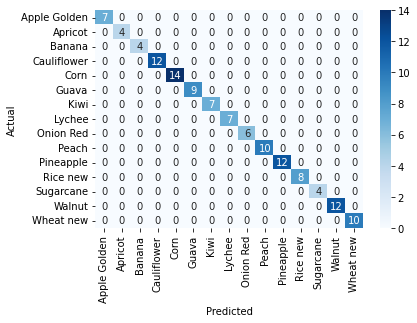

test accuracy : 100.0


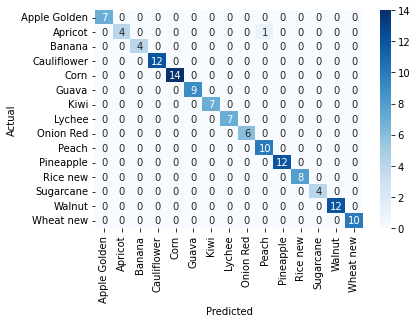

test accuracy : 99.21259842519686


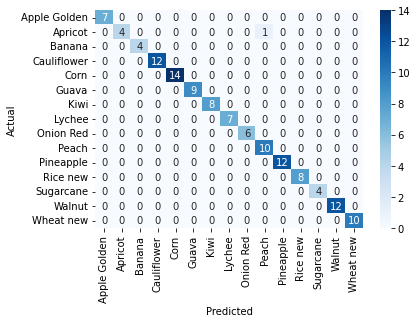

test accuracy : 99.21875


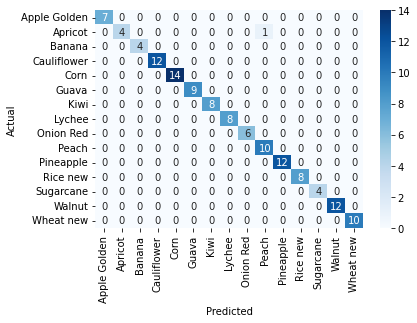

test accuracy : 99.2248062015504


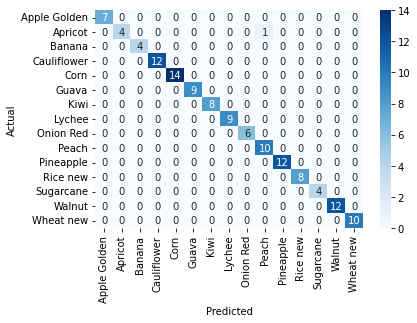

test accuracy : 99.23076923076923


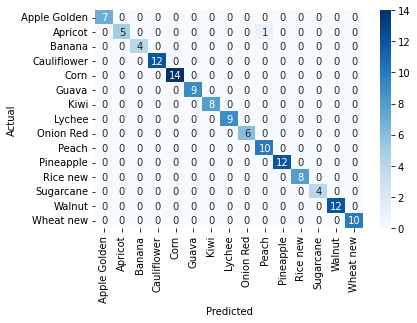

test accuracy : 99.23664122137404


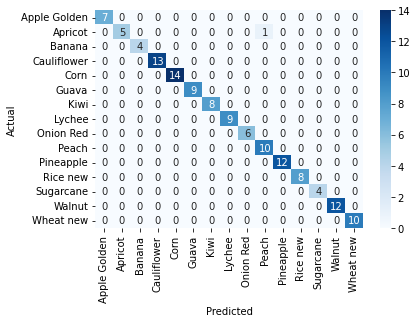

test accuracy : 99.24242424242425


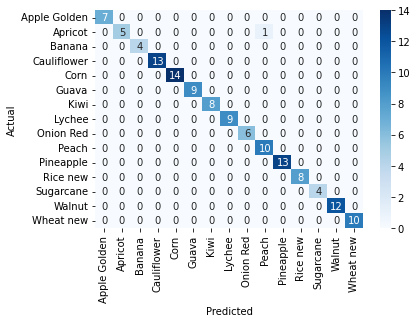

test accuracy : 99.24812030075188


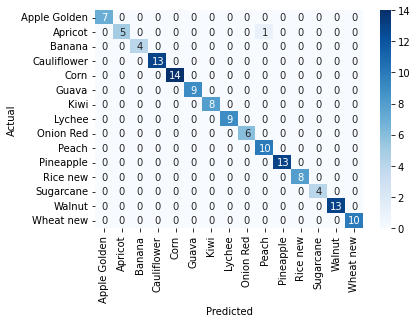

test accuracy : 99.25373134328358


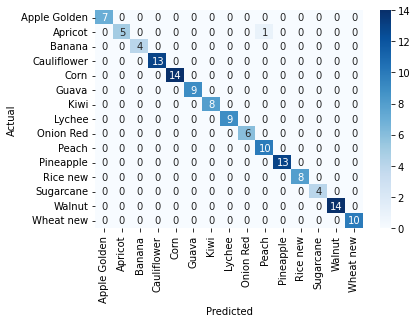

test accuracy : 99.25925925925925


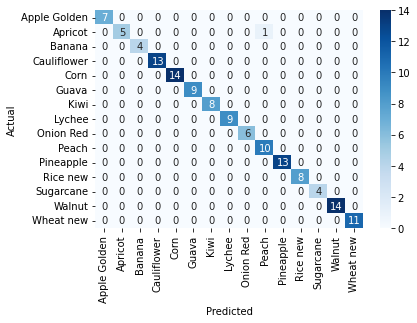

test accuracy : 99.26470588235294


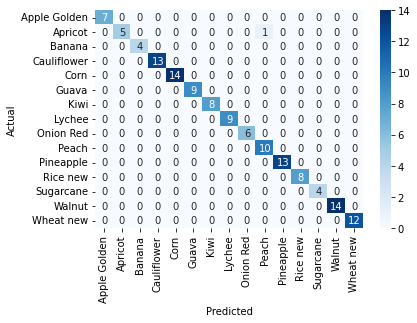

test accuracy : 99.27007299270073


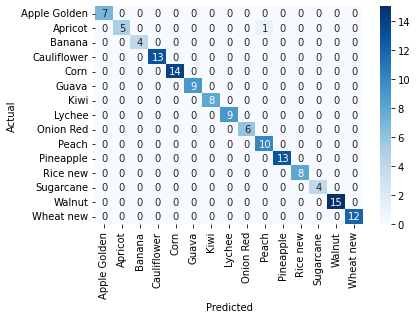

test accuracy : 99.27536231884058


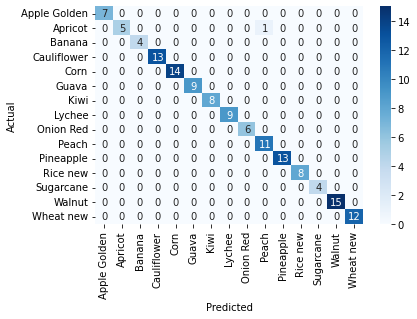

test accuracy : 99.28057553956835


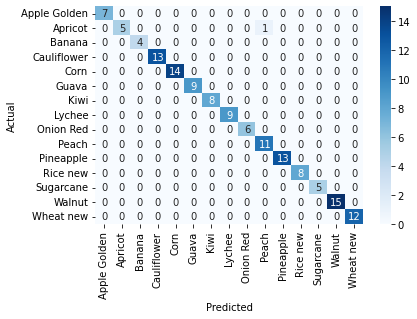

test accuracy : 99.28571428571429


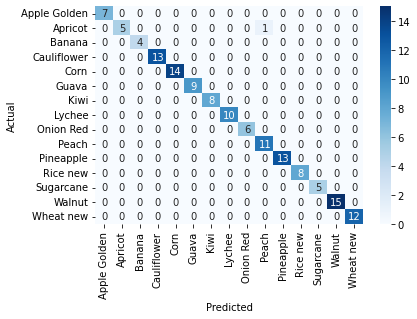

test accuracy : 99.29078014184397


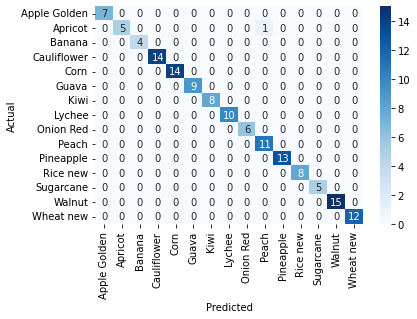

test accuracy : 99.29577464788733


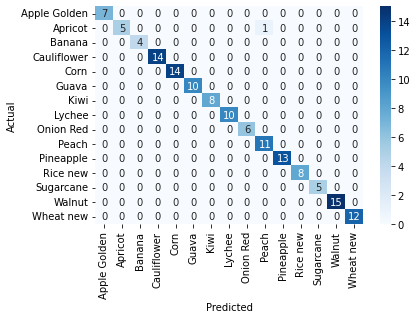

test accuracy : 99.3006993006993


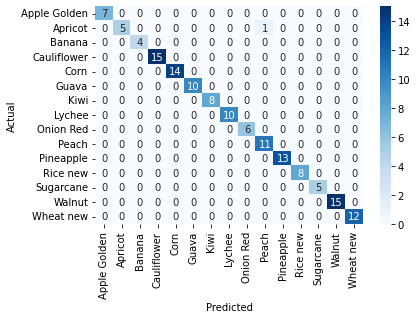

test accuracy : 99.30555555555556


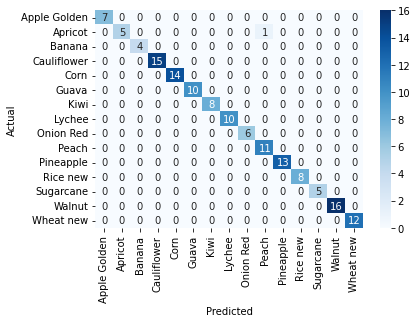

test accuracy : 99.3103448275862


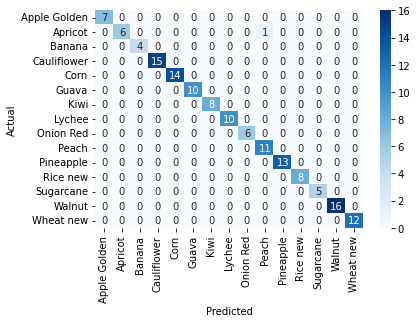

test accuracy : 99.31506849315068


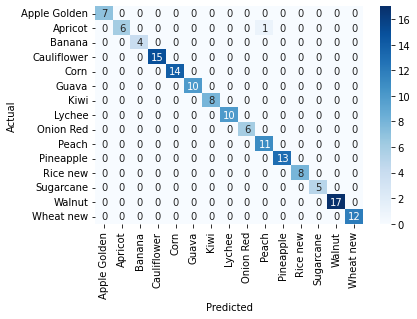

test accuracy : 99.31972789115646


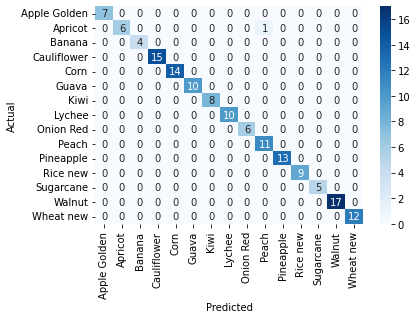

test accuracy : 99.32432432432432


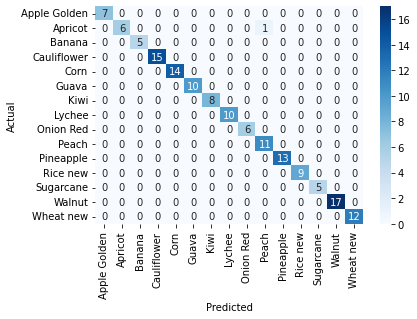

test accuracy : 99.32885906040269


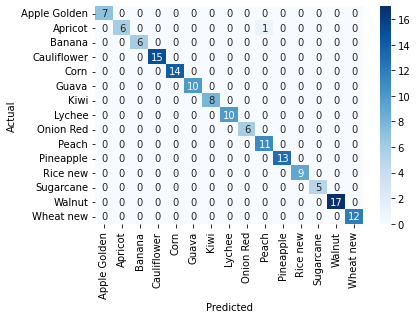

test accuracy : 99.33333333333333


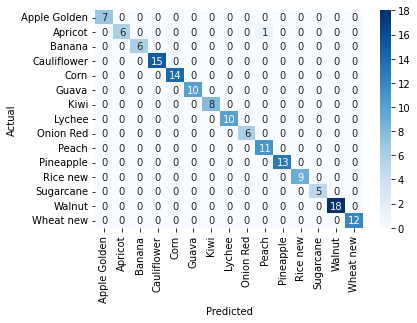

test accuracy : 99.33774834437085


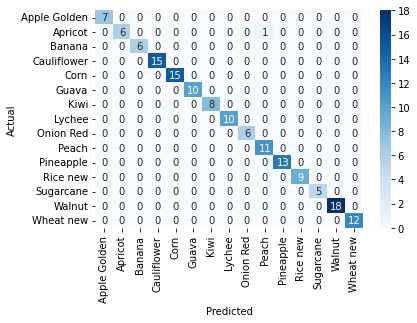

test accuracy : 99.3421052631579


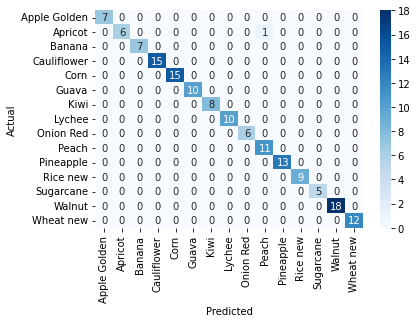

test accuracy : 99.34640522875817


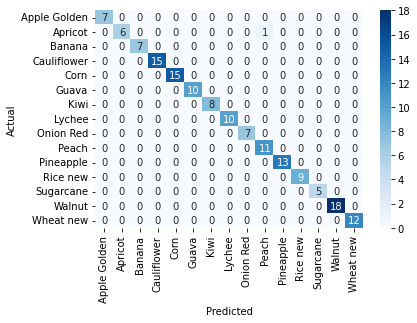

test accuracy : 99.35064935064936


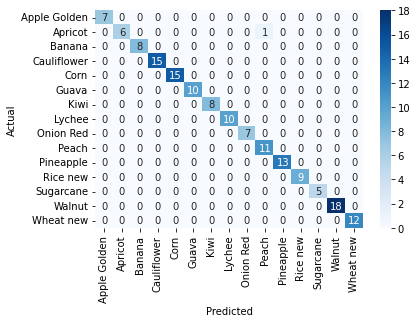

test accuracy : 99.35483870967742


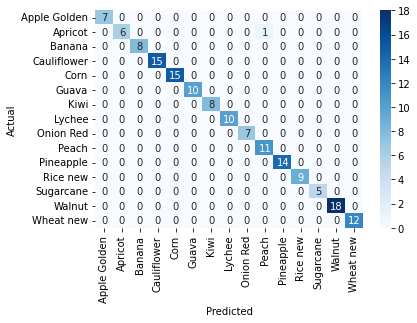

test accuracy : 99.35897435897436


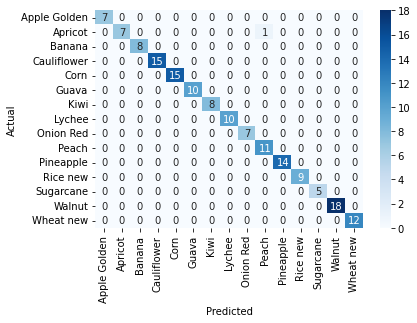

test accuracy : 99.36305732484077


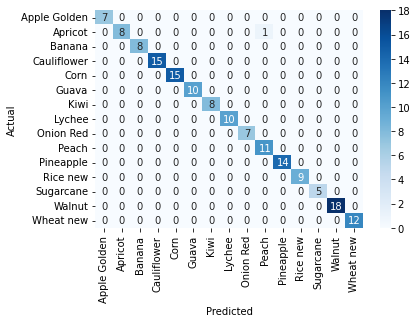

test accuracy : 99.36708860759494


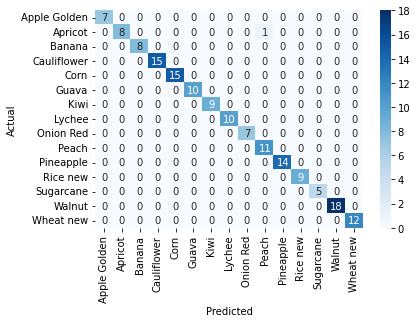

test accuracy : 99.37106918238993


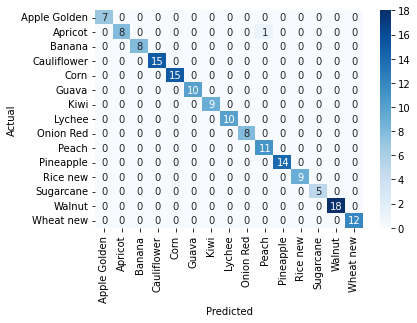

test accuracy : 99.375


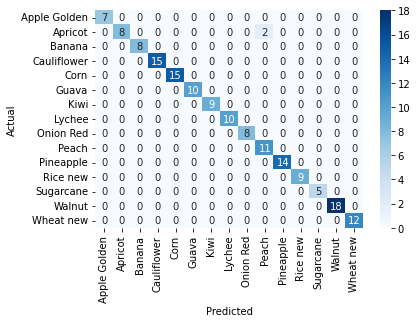

test accuracy : 98.75776397515527


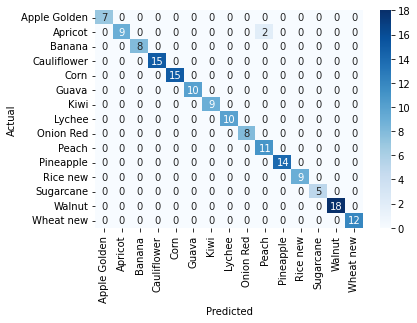

test accuracy : 98.76543209876543


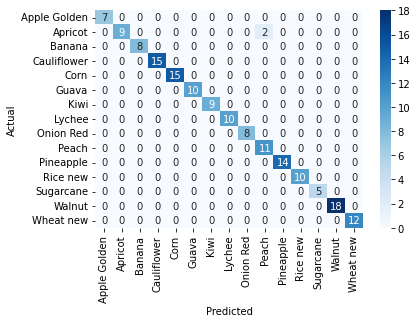

test accuracy : 98.77300613496932


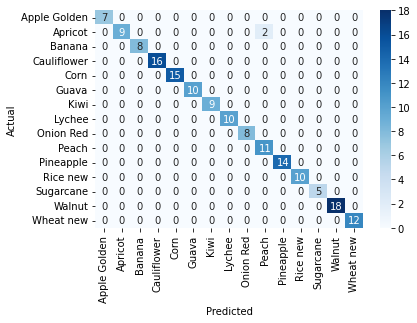

test accuracy : 98.78048780487805


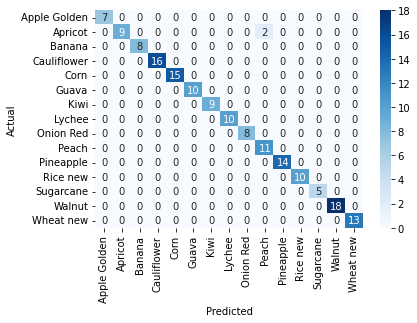

test accuracy : 98.7878787878788


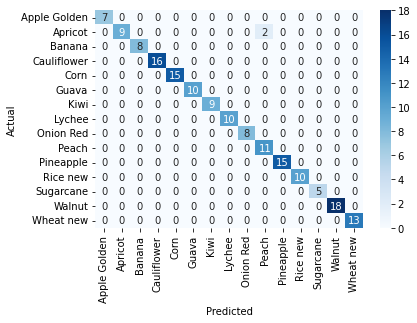

test accuracy : 98.79518072289156


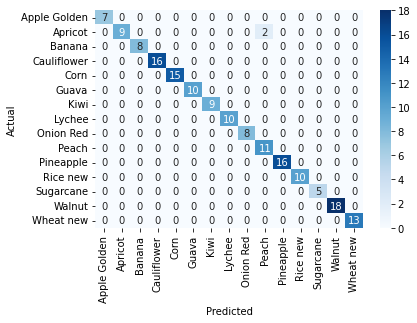

test accuracy : 98.80239520958084


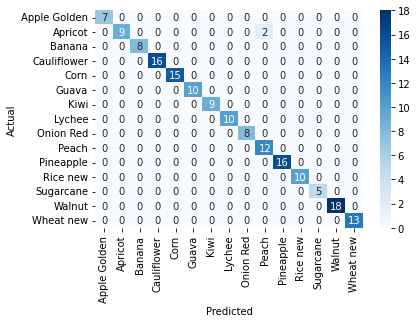

test accuracy : 98.80952380952381


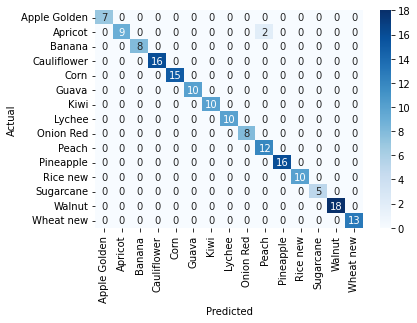

test accuracy : 98.81656804733728


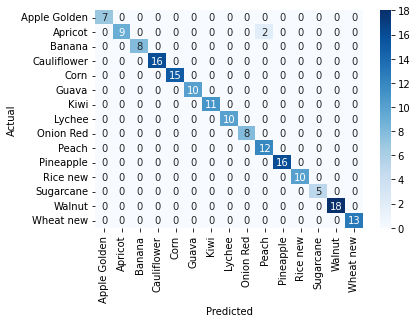

test accuracy : 98.82352941176471


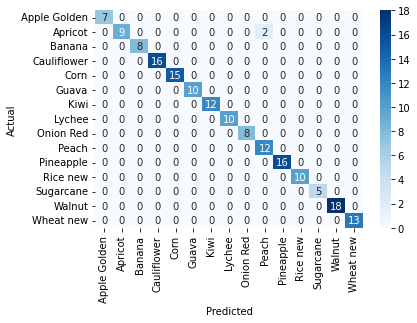

test accuracy : 98.83040935672514


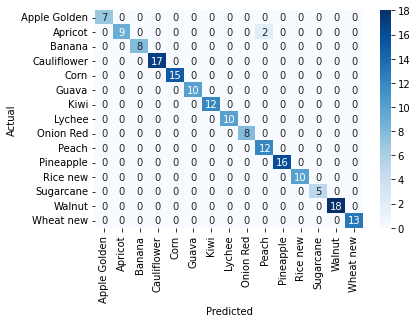

test accuracy : 98.83720930232558


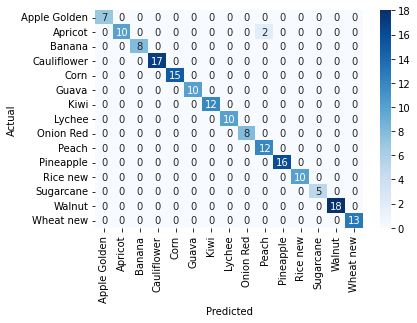

test accuracy : 98.84393063583815


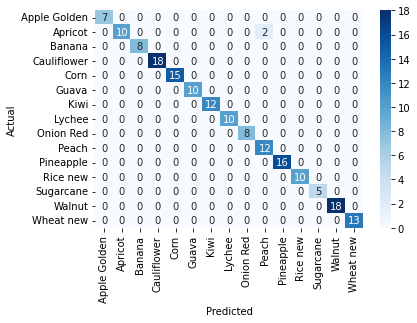

test accuracy : 98.85057471264368


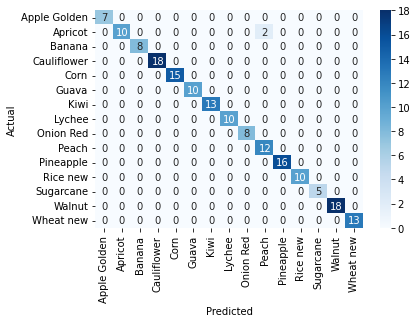

test accuracy : 98.85714285714286


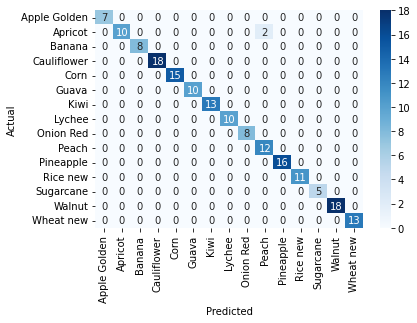

test accuracy : 98.86363636363636


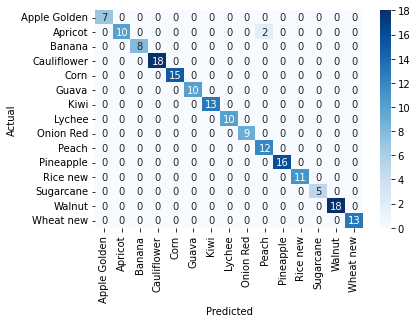

test accuracy : 98.87005649717514


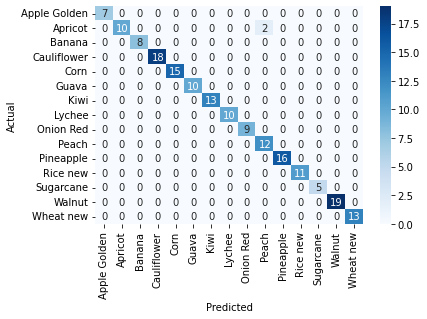

test accuracy : 98.87640449438202


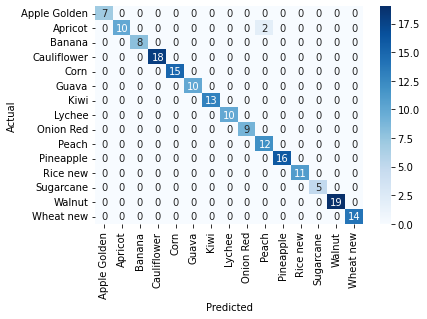

test accuracy : 98.88268156424581


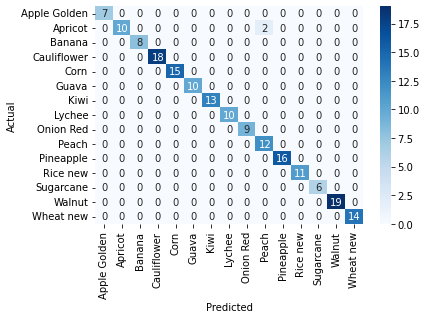

test accuracy : 98.88888888888889


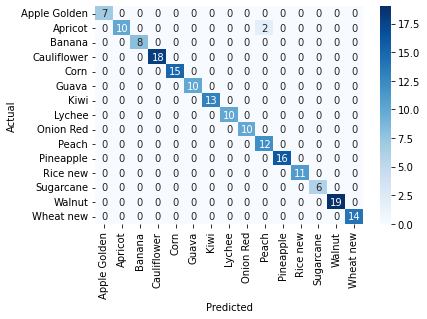

test accuracy : 98.89502762430939


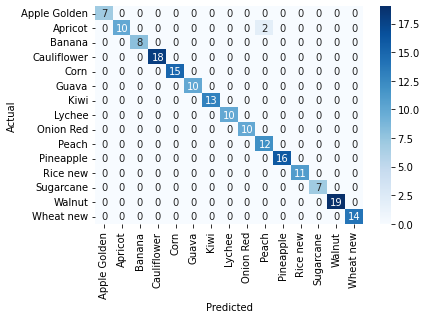

test accuracy : 98.9010989010989


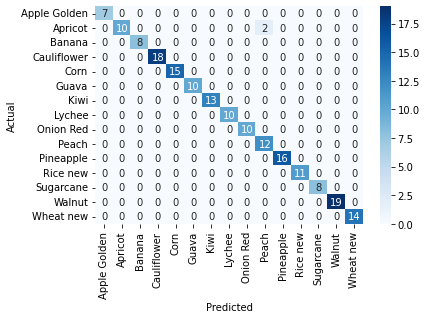

test accuracy : 98.90710382513662


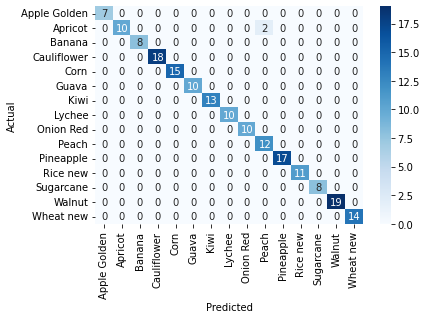

test accuracy : 98.91304347826086


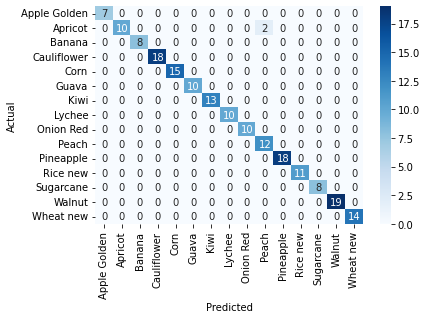

test accuracy : 98.91891891891892


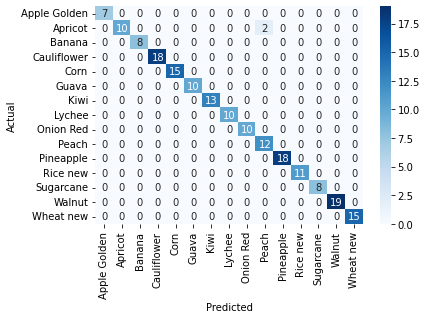

test accuracy : 98.9247311827957


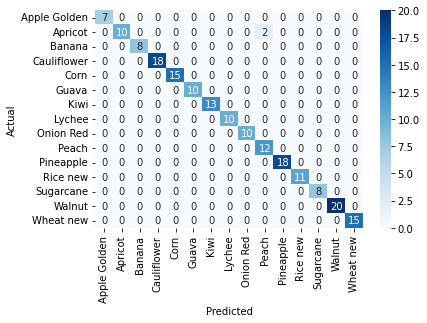

test accuracy : 98.93048128342245


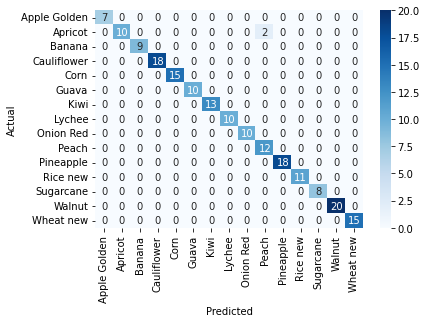

test accuracy : 98.93617021276596


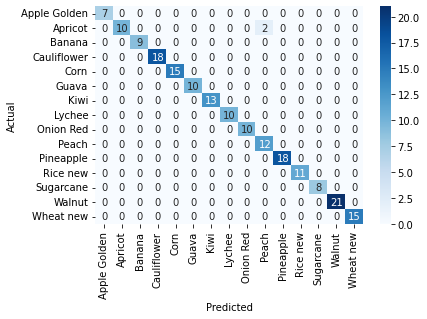

test accuracy : 98.94179894179894


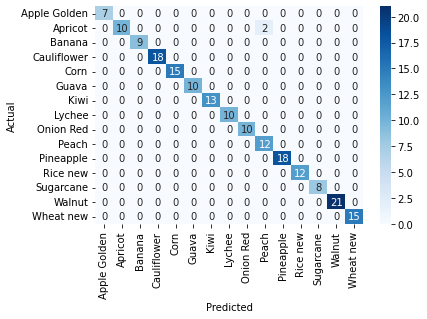

test accuracy : 98.94736842105263


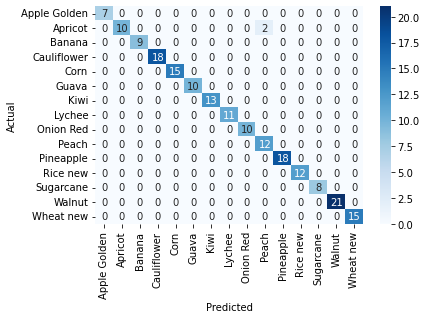

test accuracy : 98.95287958115183


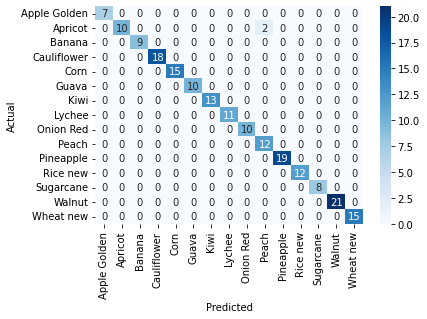

test accuracy : 98.95833333333334


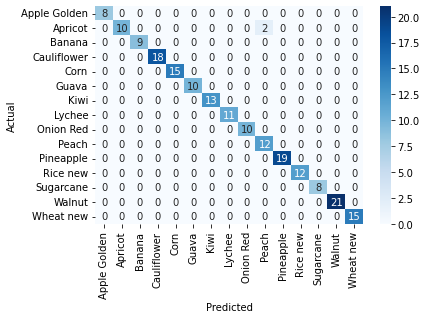

test accuracy : 98.96373056994818


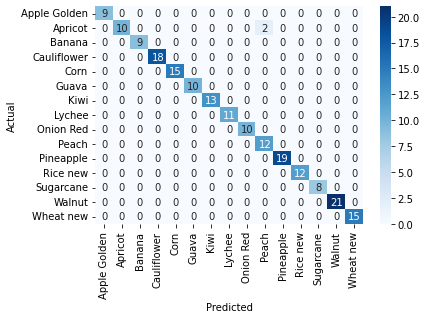

test accuracy : 98.96907216494846


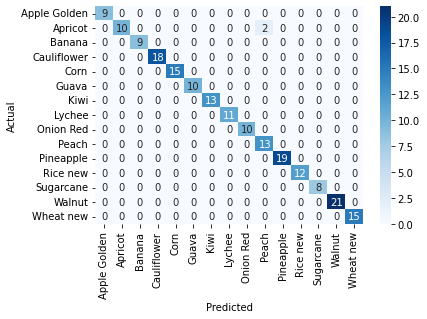

test accuracy : 98.97435897435898


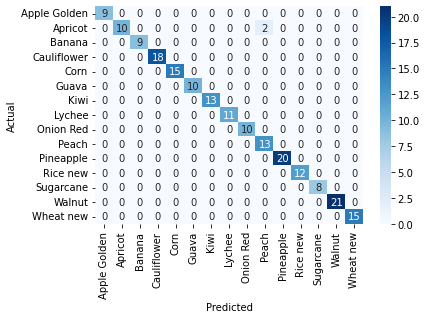

test accuracy : 98.9795918367347


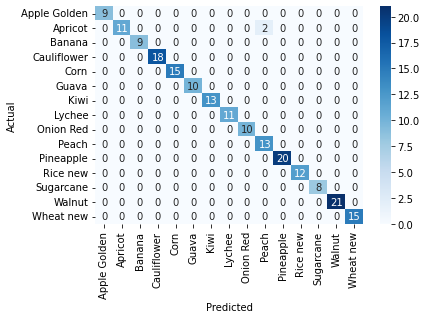

test accuracy : 98.98477157360406


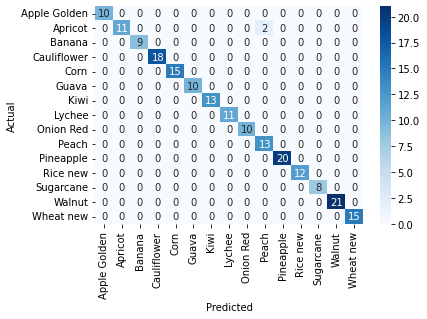

test accuracy : 98.98989898989899


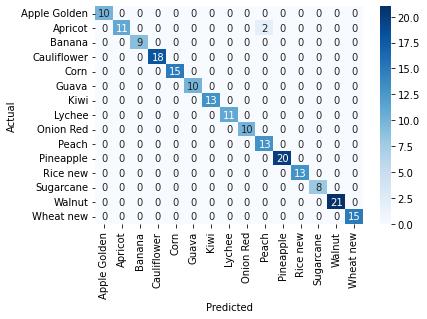

test accuracy : 98.99497487437185


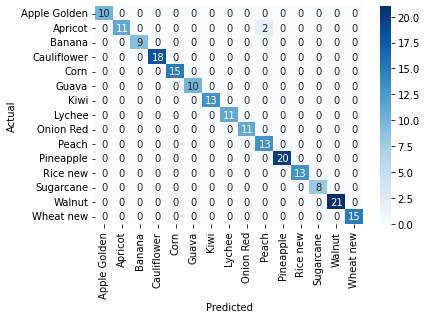

test accuracy : 99.0


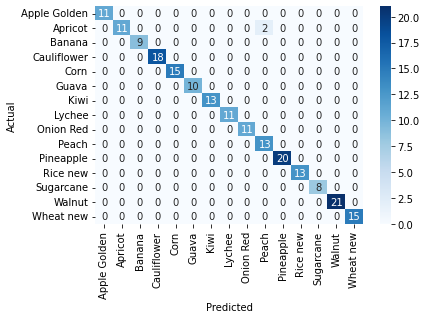

test accuracy : 99.00497512437812


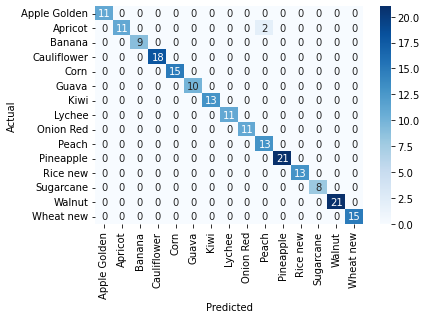

test accuracy : 99.00990099009901


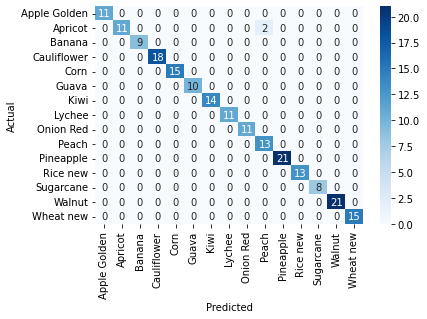

test accuracy : 99.01477832512316


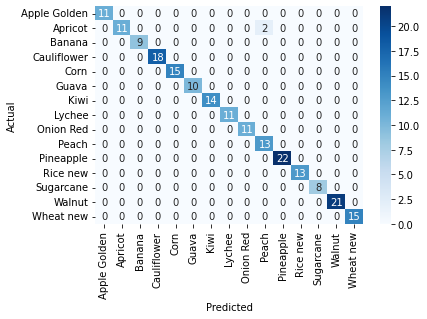

test accuracy : 99.01960784313727


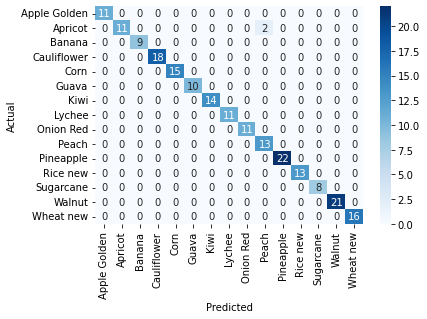

test accuracy : 99.02439024390245


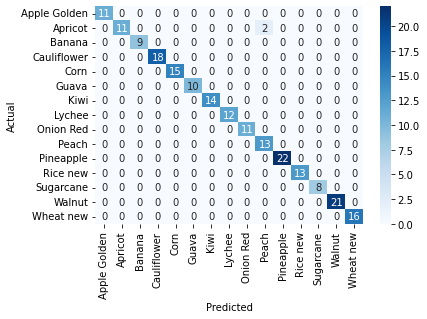

test accuracy : 99.02912621359224


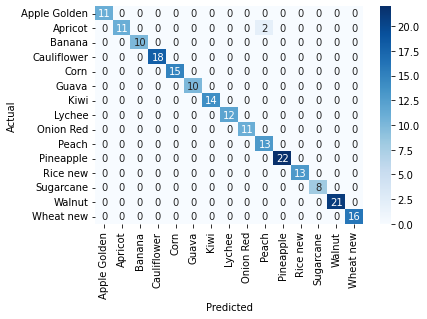

test accuracy : 99.03381642512076


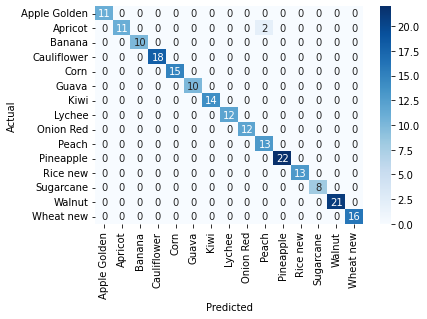

test accuracy : 99.03846153846155


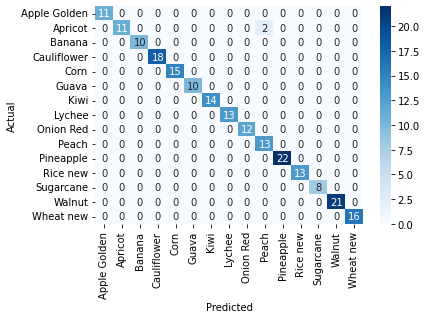

test accuracy : 99.04306220095694


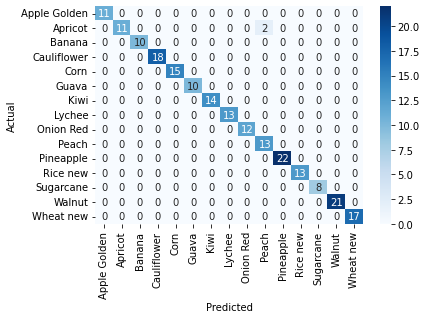

test accuracy : 99.04761904761905


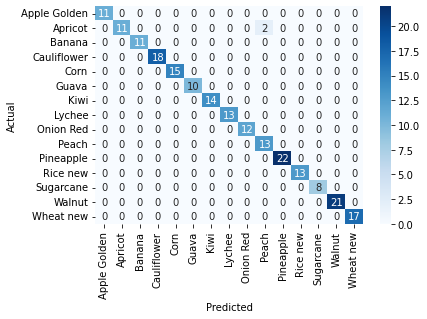

test accuracy : 99.0521327014218


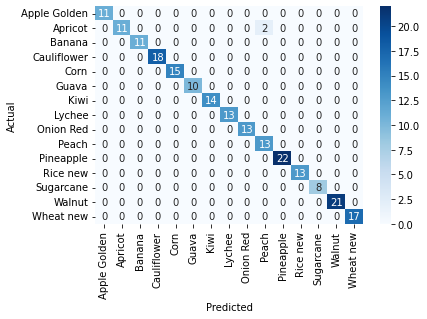

test accuracy : 99.05660377358491


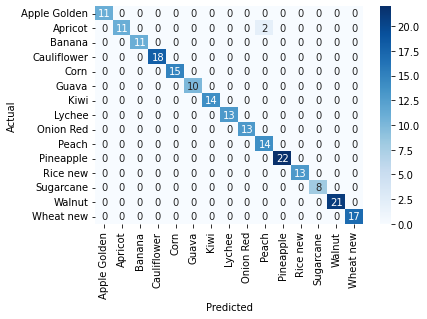

test accuracy : 99.06103286384976


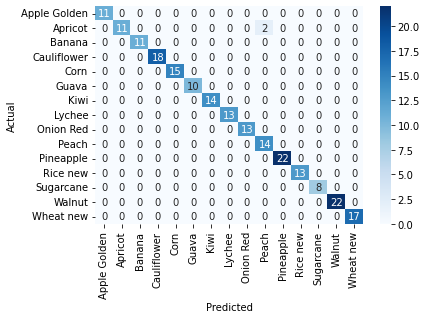

test accuracy : 99.06542056074767


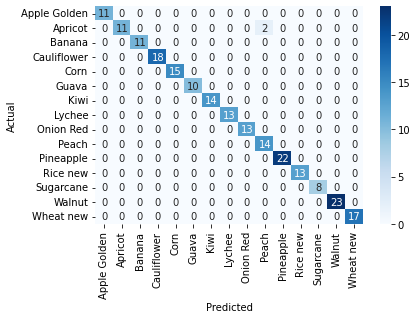

test accuracy : 99.06976744186046


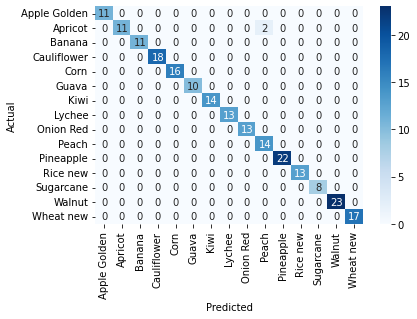

test accuracy : 99.07407407407408


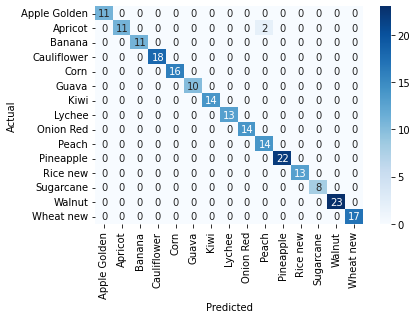

test accuracy : 99.07834101382488


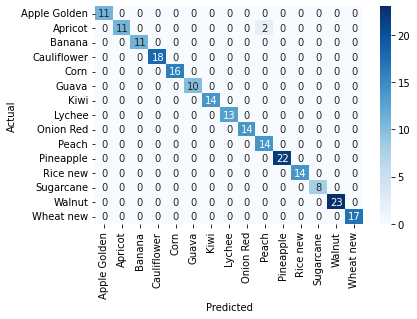

test accuracy : 99.08256880733946


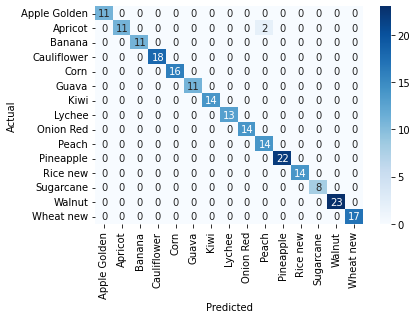

test accuracy : 99.08675799086758


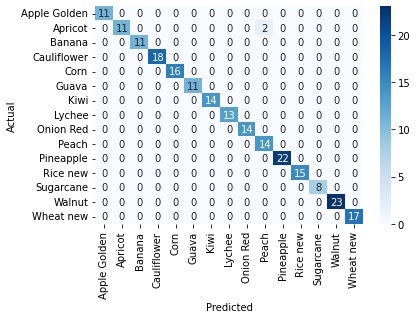

test accuracy : 99.0909090909091


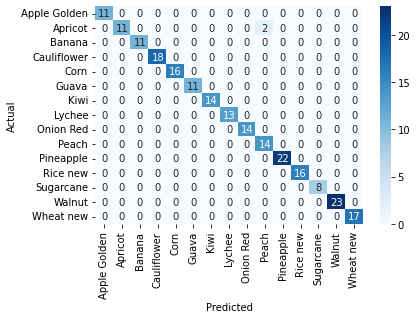

test accuracy : 99.09502262443439


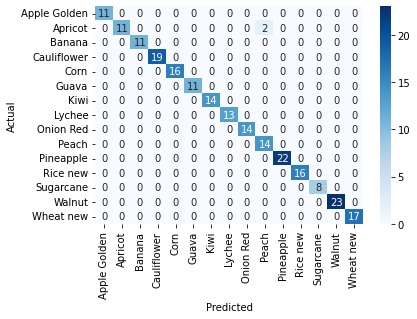

test accuracy : 99.09909909909909


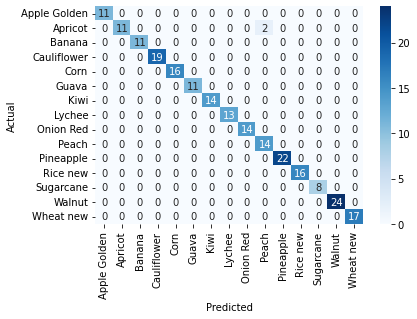

test accuracy : 99.10313901345292


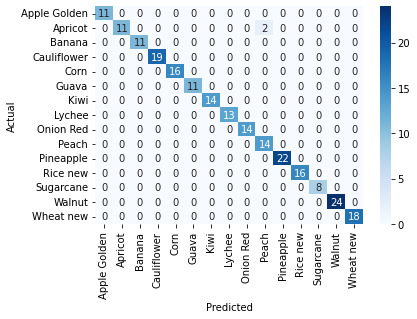

test accuracy : 99.10714285714286


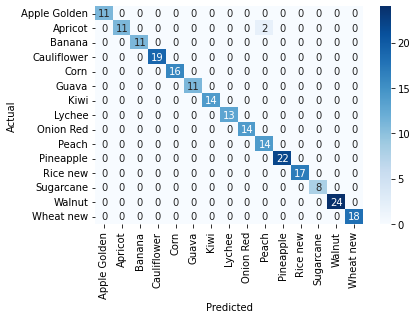

test accuracy : 99.11111111111111


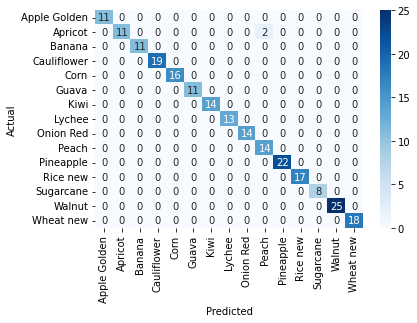

test accuracy : 99.11504424778761


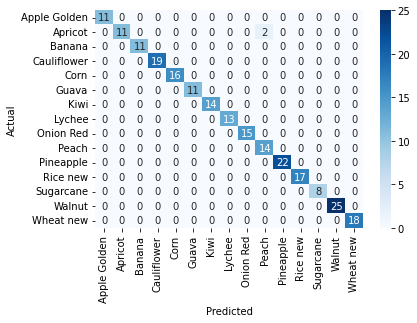

test accuracy : 99.11894273127754


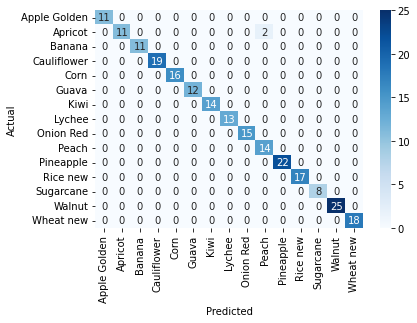

test accuracy : 99.12280701754386


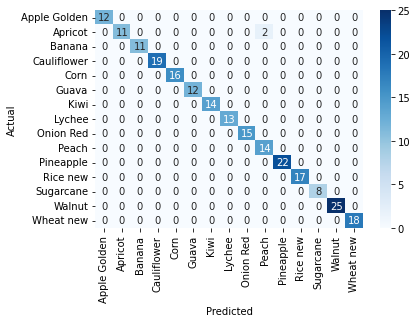

test accuracy : 99.12663755458514


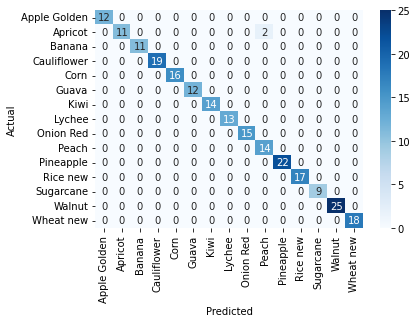

test accuracy : 99.1304347826087


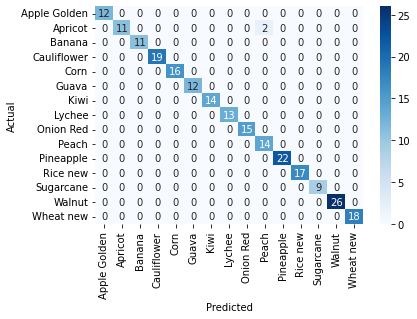

test accuracy : 99.13419913419914


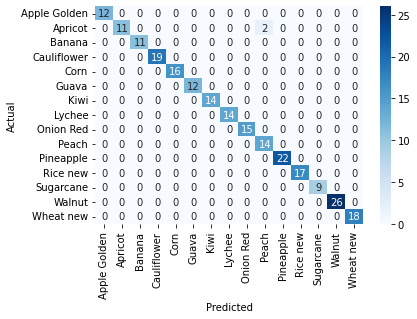

test accuracy : 99.13793103448276


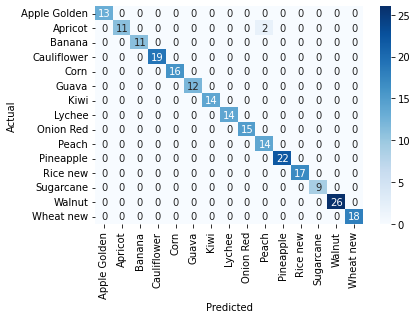

test accuracy : 99.14163090128756


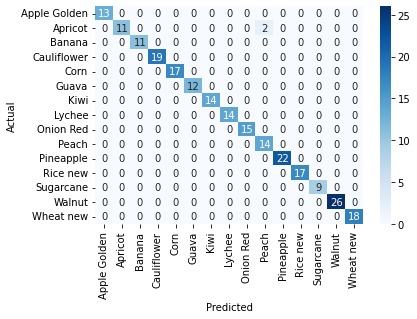

test accuracy : 99.14529914529915


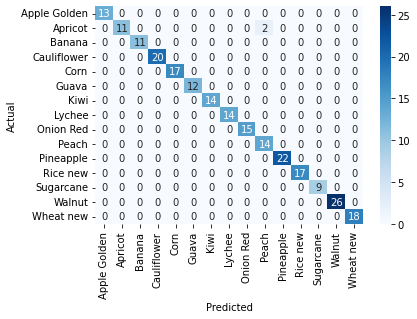

test accuracy : 99.14893617021276


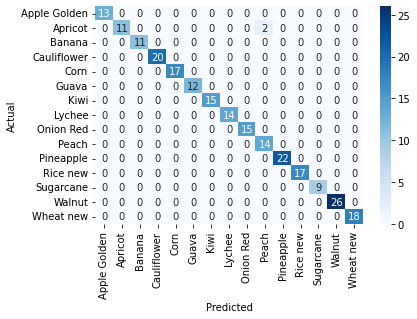

test accuracy : 99.15254237288136


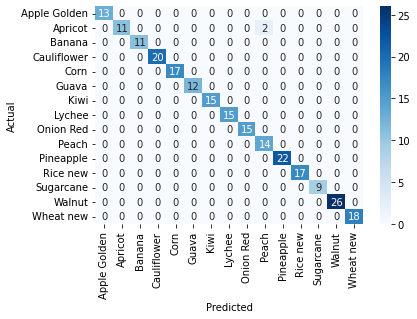

test accuracy : 99.15611814345992


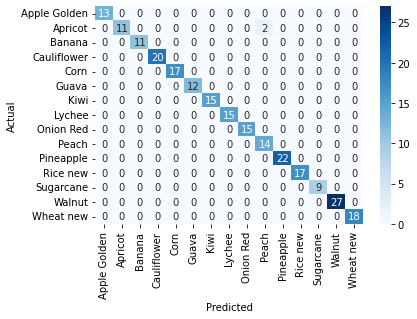

test accuracy : 99.15966386554622


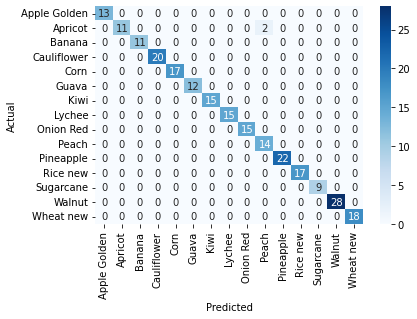

test accuracy : 99.16317991631799


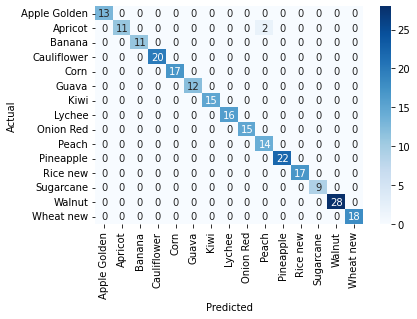

test accuracy : 99.16666666666667


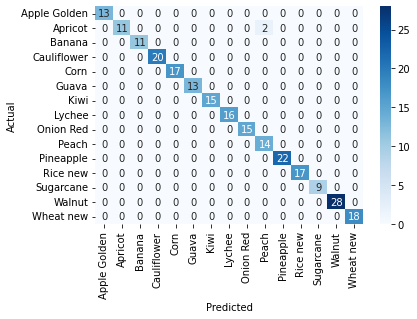

test accuracy : 99.1701244813278


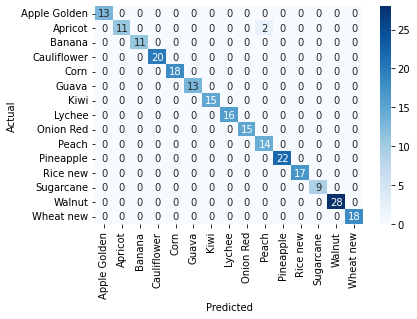

test accuracy : 99.17355371900827


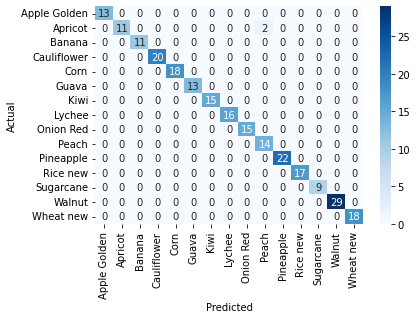

test accuracy : 99.1769547325103


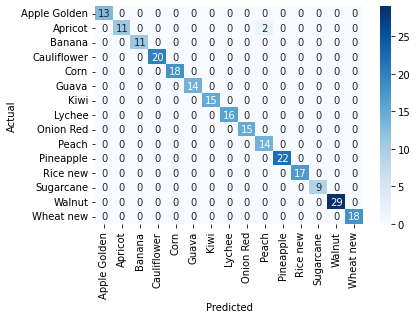

test accuracy : 99.18032786885246


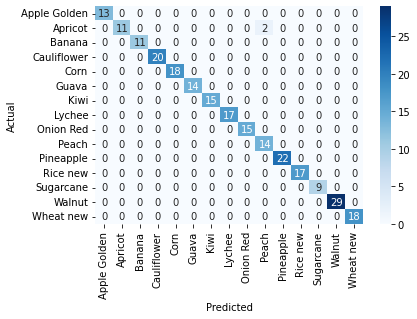

test accuracy : 99.18367346938776


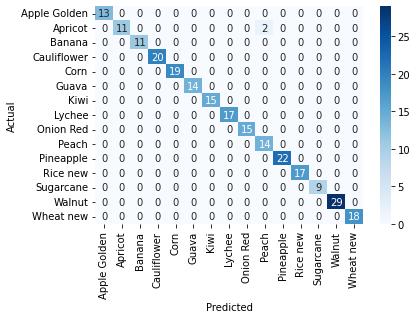

test accuracy : 99.1869918699187


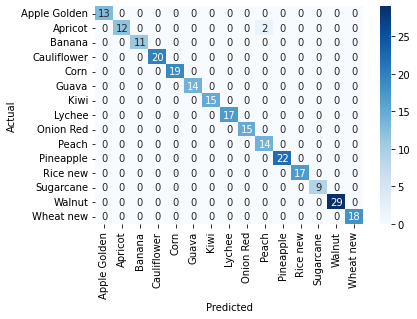

test accuracy : 99.19028340080972


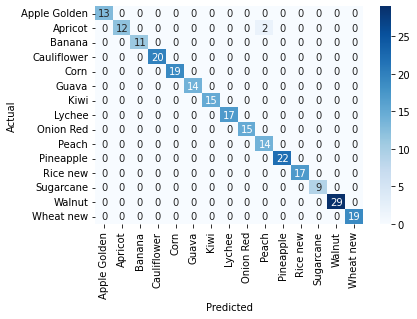

test accuracy : 99.19354838709677


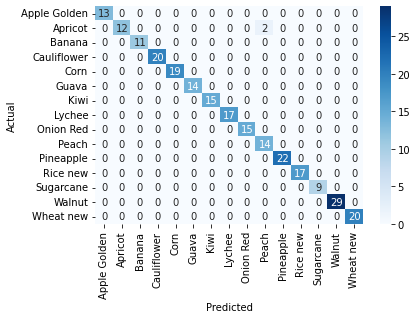

test accuracy : 99.19678714859438


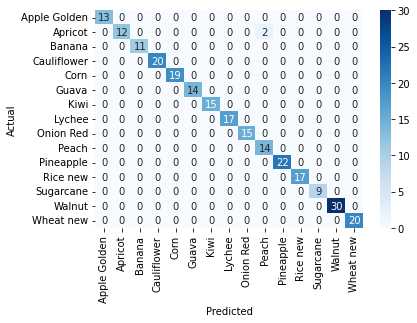

test accuracy : 99.2


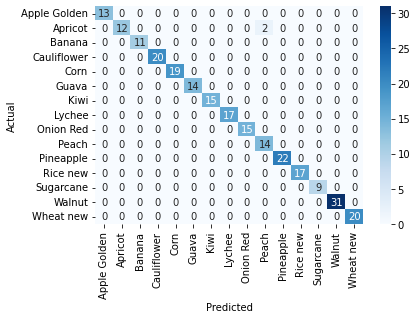

test accuracy : 99.20318725099602


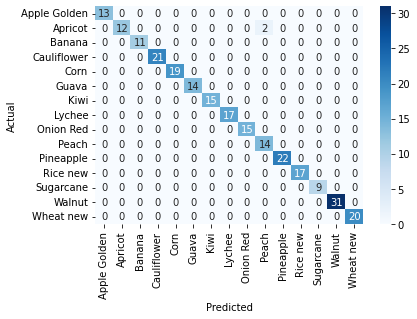

test accuracy : 99.20634920634922


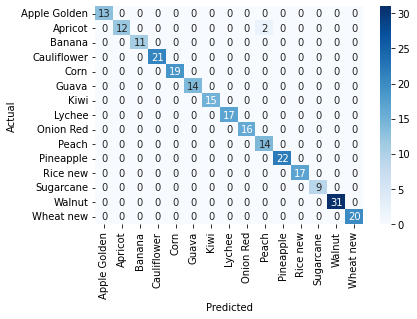

test accuracy : 99.2094861660079


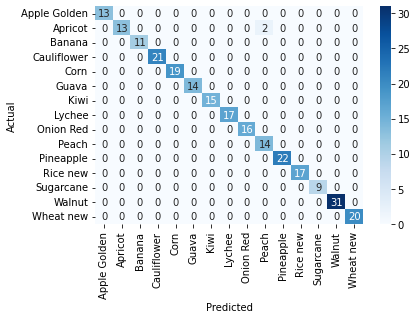

test accuracy : 99.21259842519686


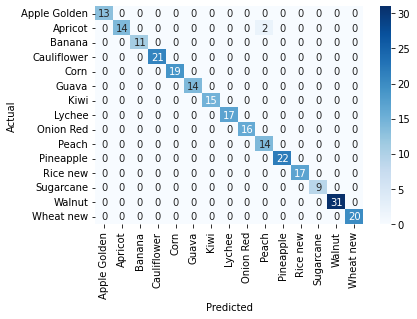

test accuracy : 99.2156862745098


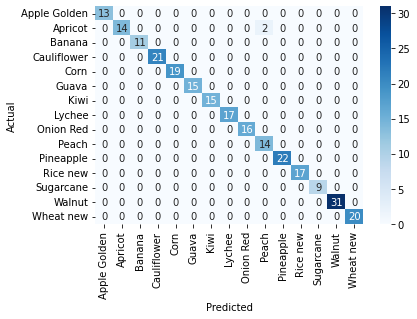

test accuracy : 99.21875


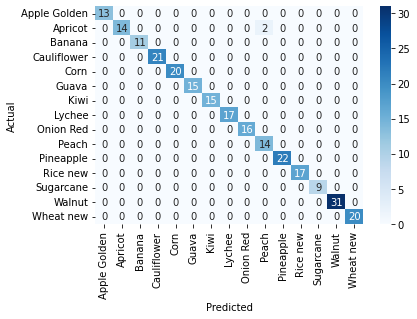

test accuracy : 99.22178988326849


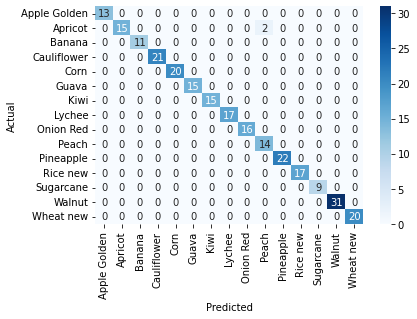

test accuracy : 99.2248062015504


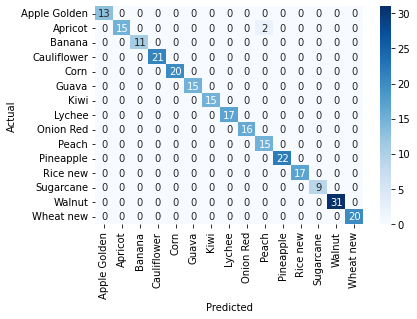

test accuracy : 99.22779922779922


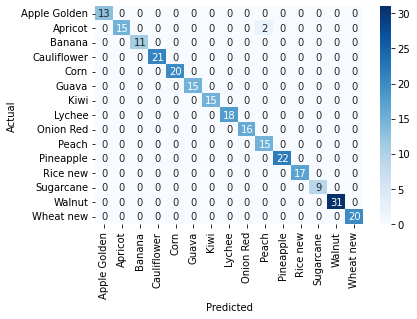

test accuracy : 99.23076923076923


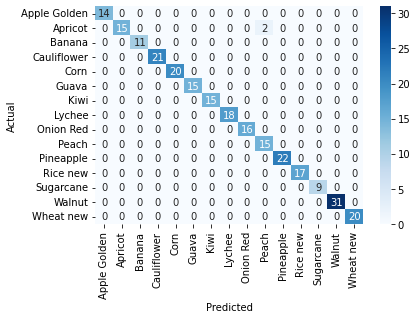

test accuracy : 99.23371647509579


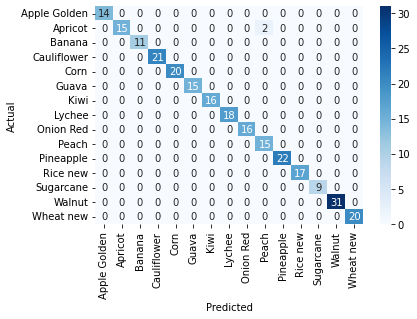

test accuracy : 99.23664122137404


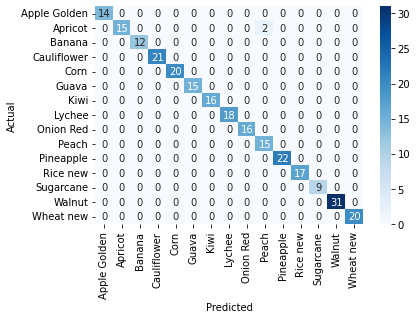

test accuracy : 99.23954372623575


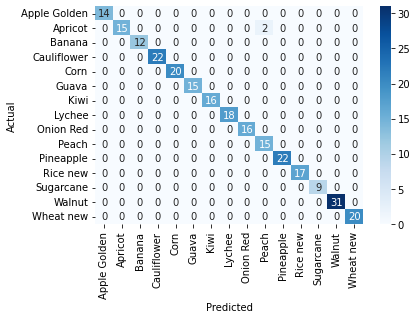

test accuracy : 99.24242424242425


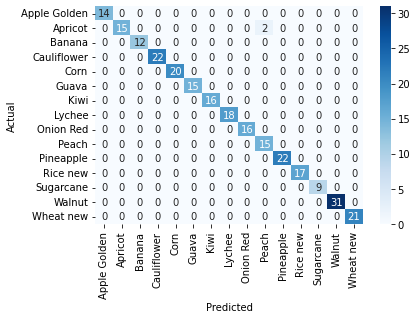

test accuracy : 99.24528301886792


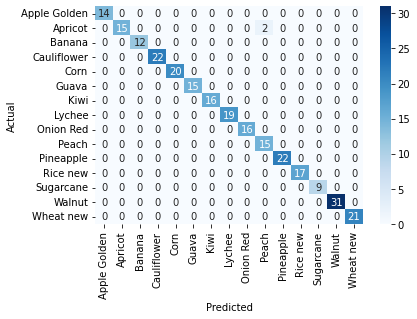

test accuracy : 99.24812030075188


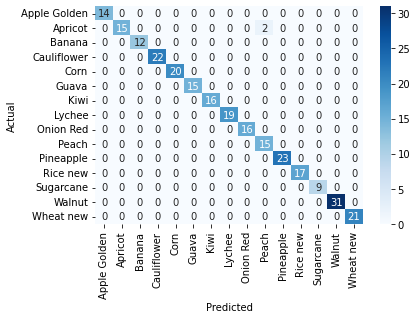

test accuracy : 99.25093632958801


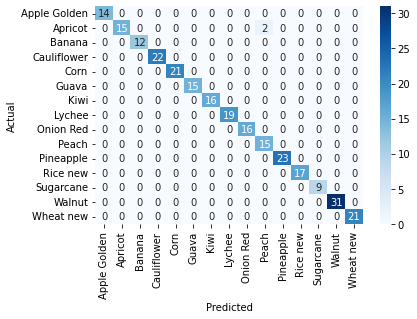

test accuracy : 99.25373134328358


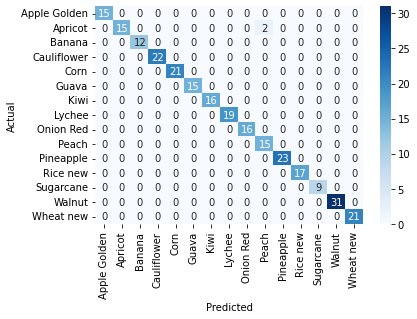

test accuracy : 99.25650557620817


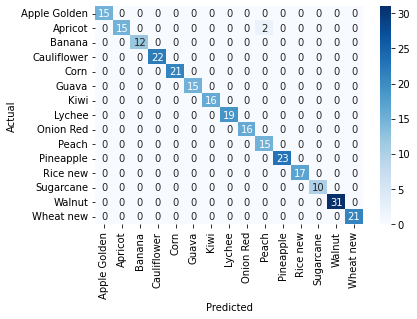

test accuracy : 99.25925925925925


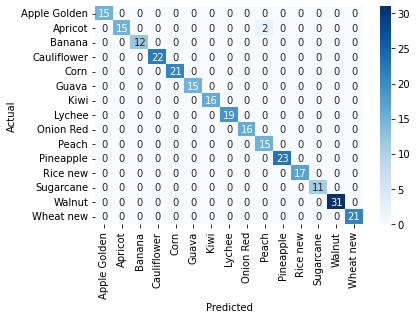

test accuracy : 99.2619926199262


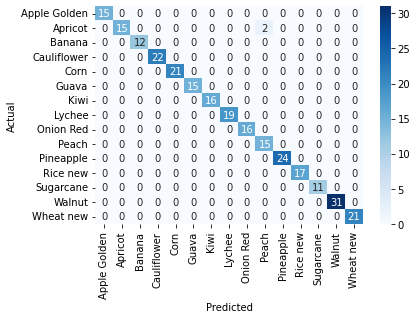

test accuracy : 99.26470588235294


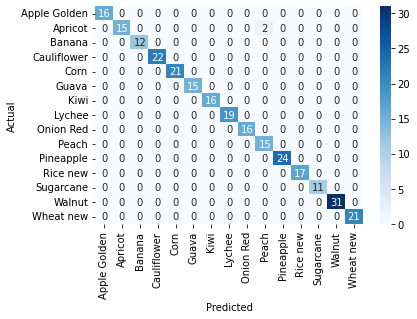

test accuracy : 99.26739926739927


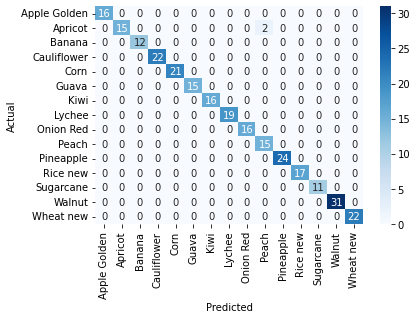

test accuracy : 99.27007299270073


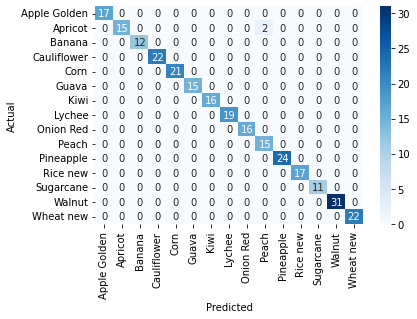

test accuracy : 99.27272727272727


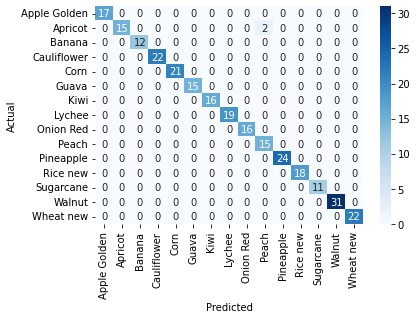

test accuracy : 99.27536231884058


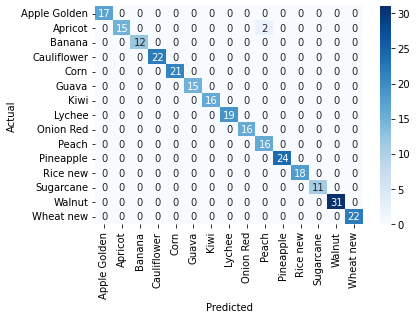

test accuracy : 99.27797833935018


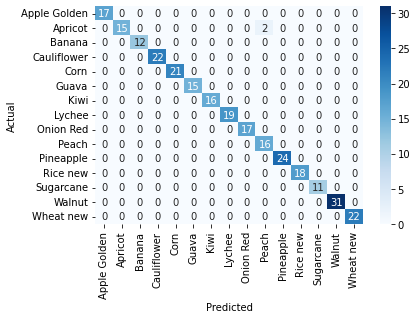

test accuracy : 99.28057553956835


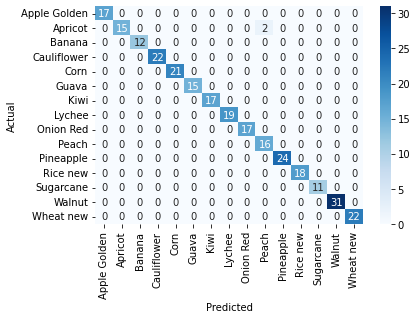

test accuracy : 99.2831541218638


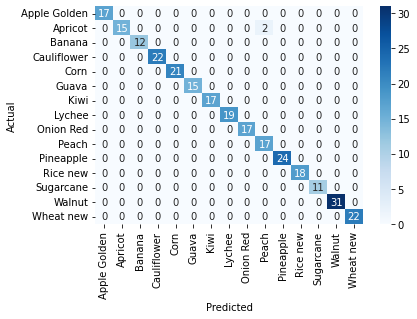

test accuracy : 99.28571428571429


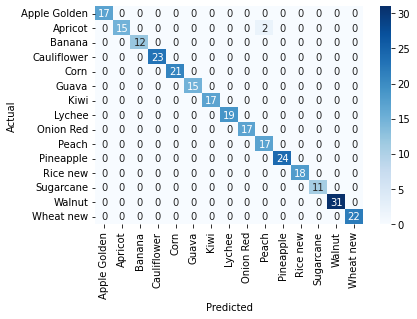

test accuracy : 99.28825622775801


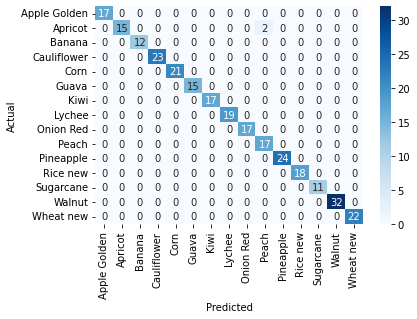

test accuracy : 99.29078014184397


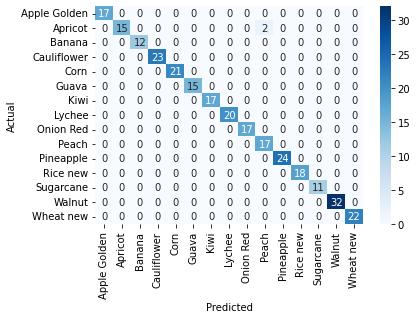

test accuracy : 99.29328621908127


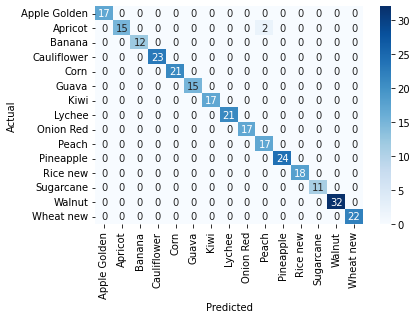

test accuracy : 99.29577464788733


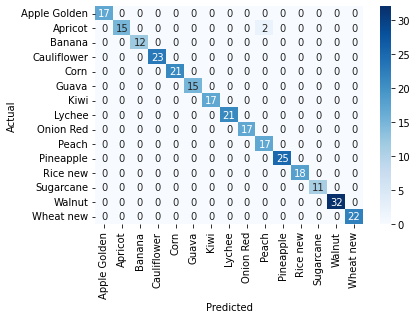

test accuracy : 99.29824561403508


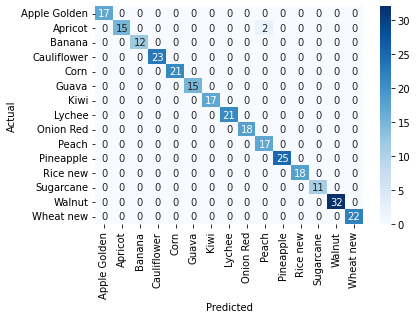

test accuracy : 99.3006993006993


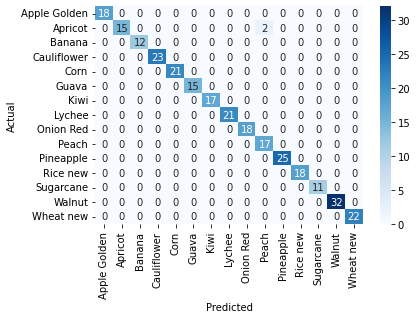

test accuracy : 99.30313588850174


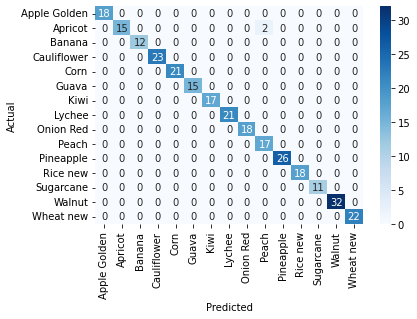

test accuracy : 99.30555555555556


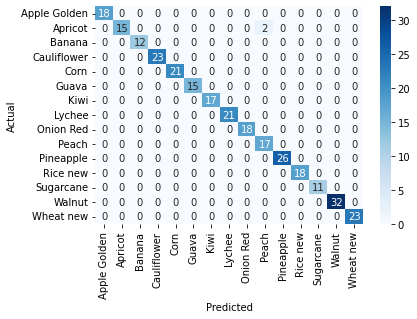

test accuracy : 99.30795847750865


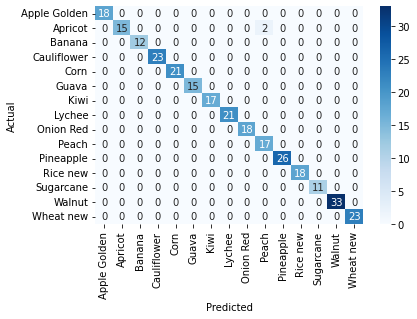

test accuracy : 99.3103448275862


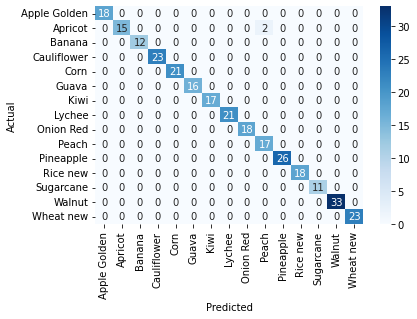

test accuracy : 99.3127147766323


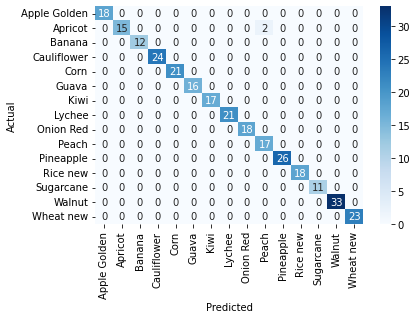

test accuracy : 99.31506849315068


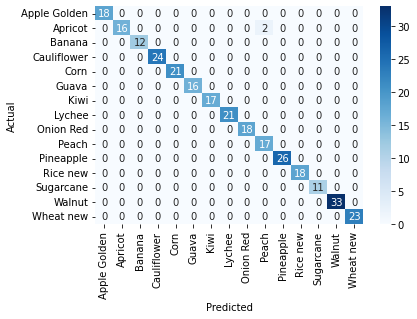

test accuracy : 99.31740614334471


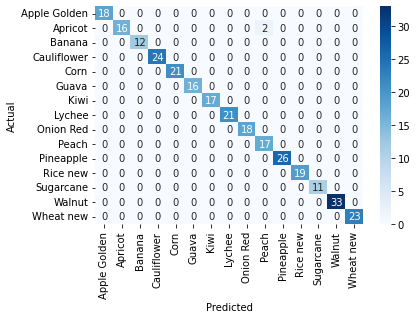

test accuracy : 99.31972789115646


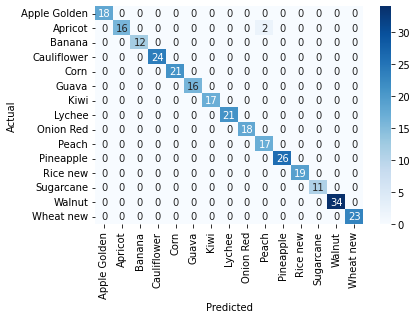

test accuracy : 99.32203389830508


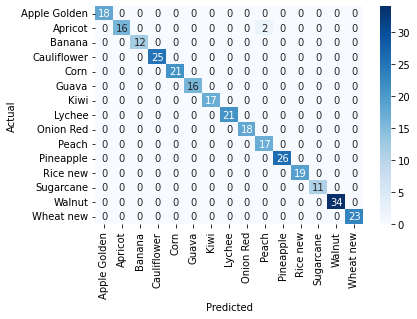

test accuracy : 99.32432432432432


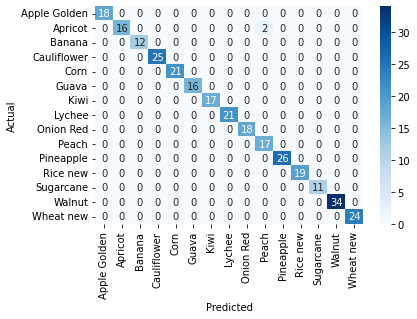

test accuracy : 99.32659932659934


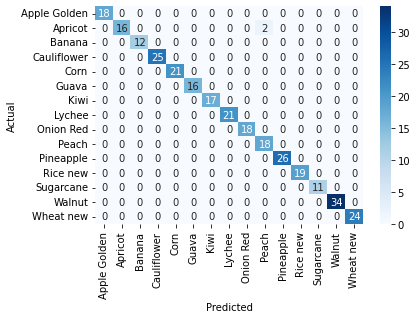

test accuracy : 99.32885906040269


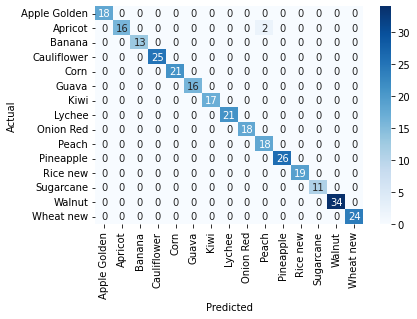

test accuracy : 99.33110367892976


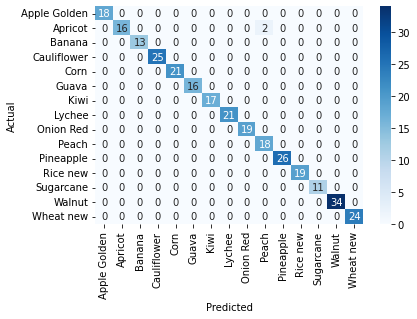

test accuracy : 99.33333333333333


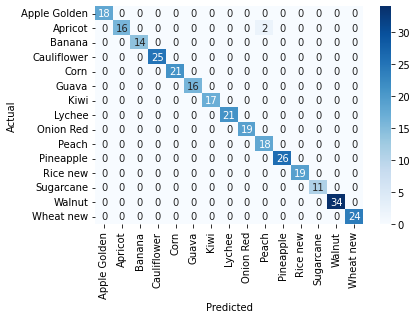

test accuracy : 99.33554817275747


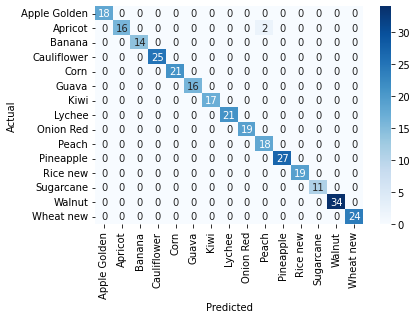

test accuracy : 99.33774834437085


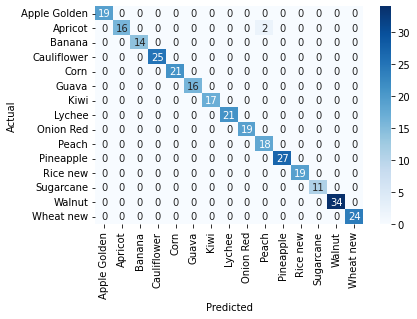

test accuracy : 99.33993399339934


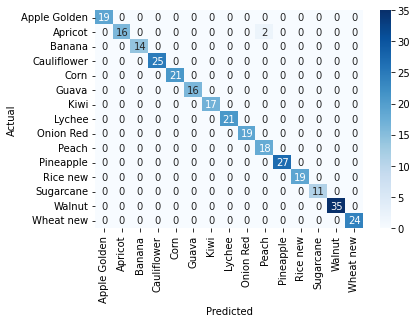

test accuracy : 99.3421052631579


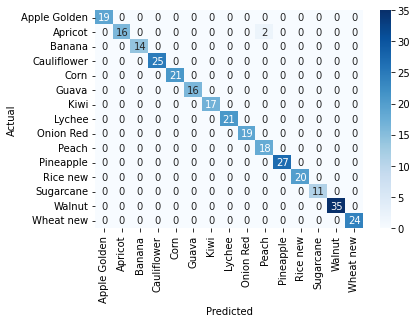

test accuracy : 99.34426229508196


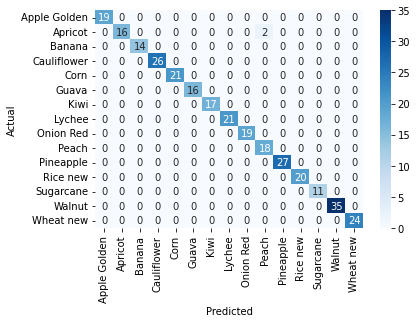

test accuracy : 99.34640522875817


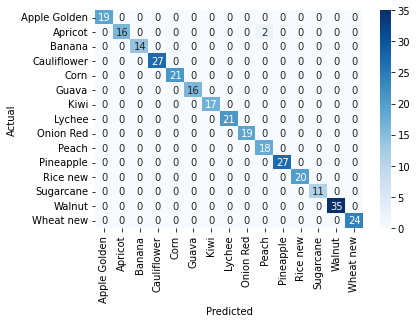

test accuracy : 99.3485342019544


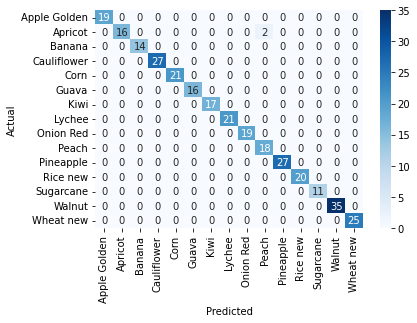

test accuracy : 99.35064935064936


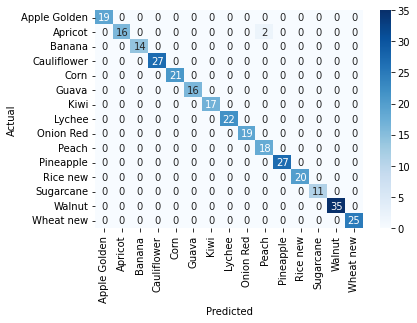

test accuracy : 99.35275080906149


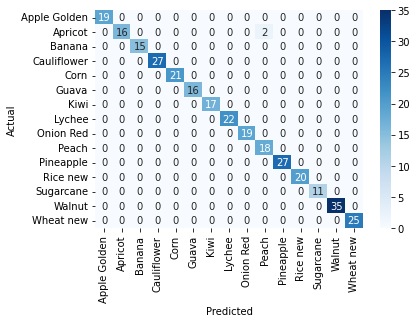

test accuracy : 99.35483870967742


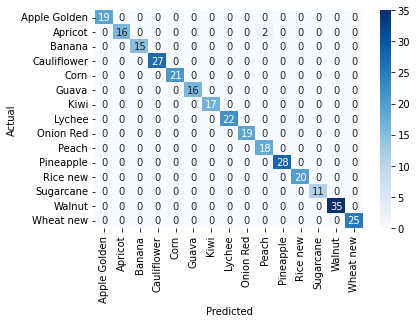

test accuracy : 99.35691318327974


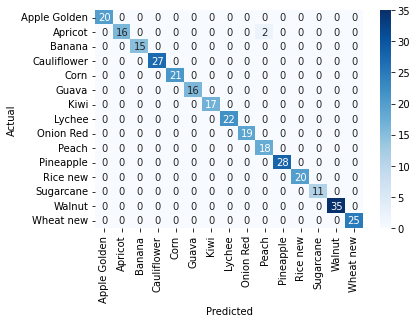

test accuracy : 99.35897435897436


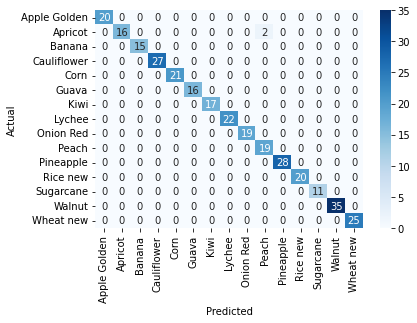

test accuracy : 99.36102236421725


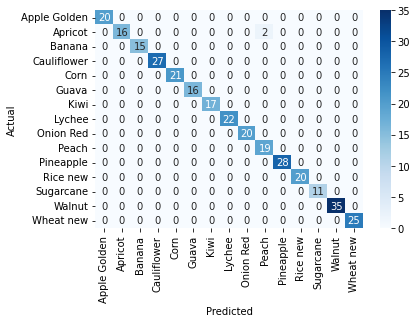

test accuracy : 99.36305732484077


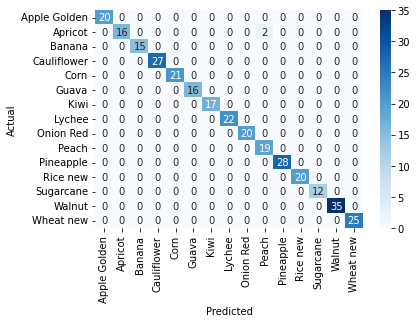

test accuracy : 99.36507936507937


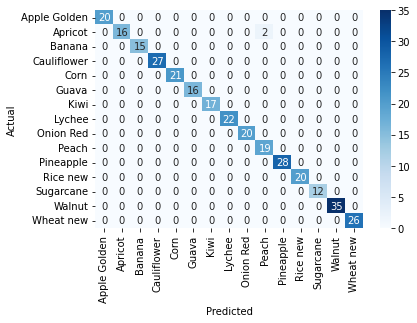

test accuracy : 99.36708860759494


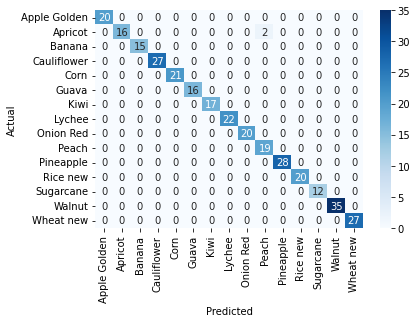

test accuracy : 99.36908517350159


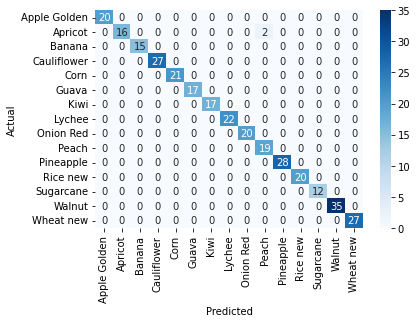

test accuracy : 99.37106918238993


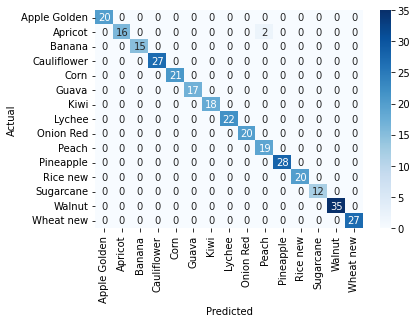

test accuracy : 99.37304075235109


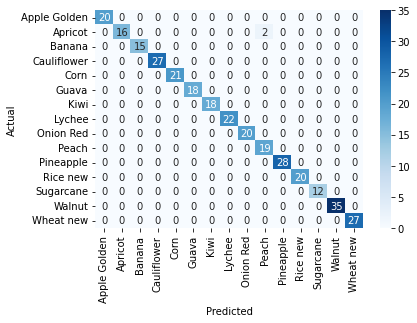

test accuracy : 99.375


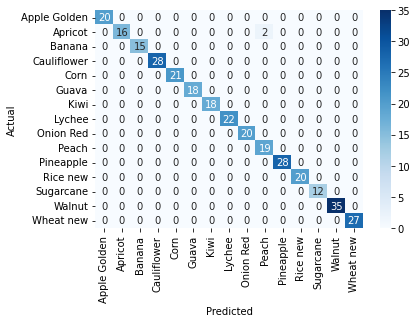

test accuracy : 99.37694704049844


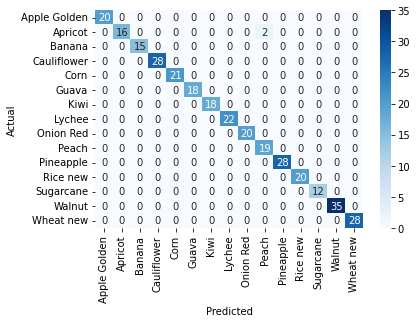

test accuracy : 99.37888198757764


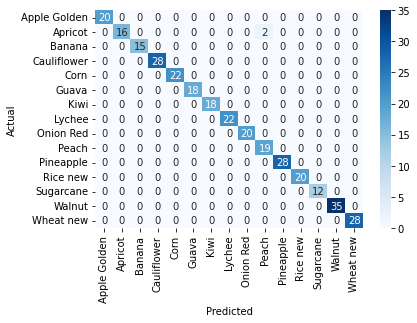

test accuracy : 99.38080495356037


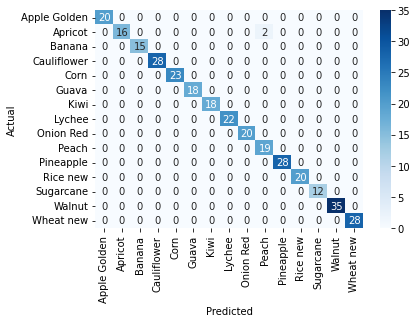

test accuracy : 99.38271604938271


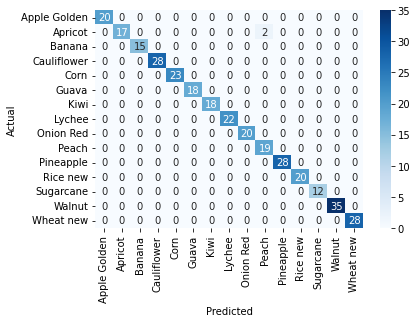

test accuracy : 99.38461538461539


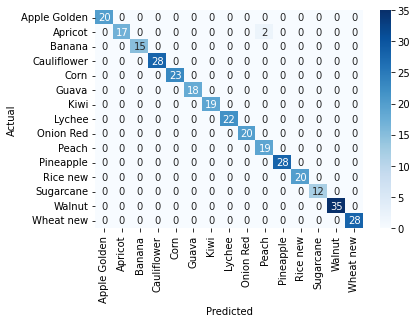

test accuracy : 99.38650306748467


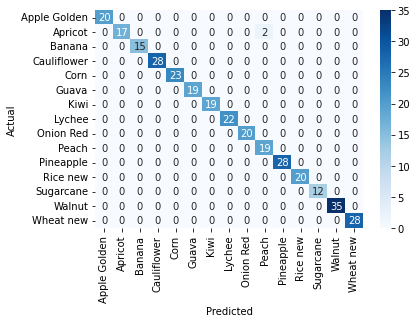

test accuracy : 99.38837920489296


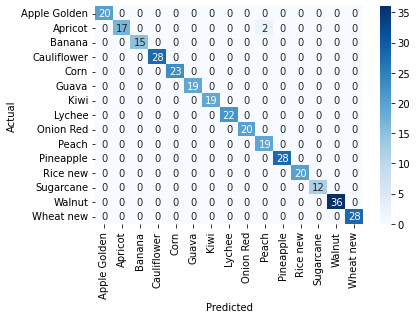

test accuracy : 99.39024390243902


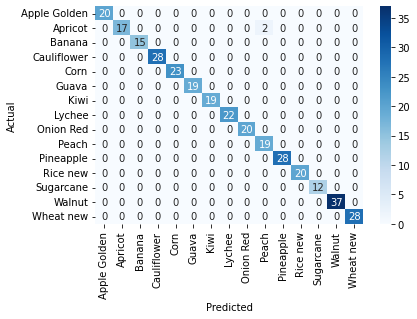

test accuracy : 99.3920972644377


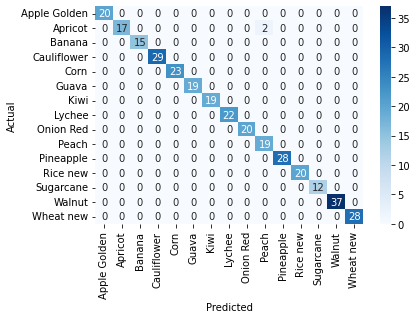

test accuracy : 99.39393939393939


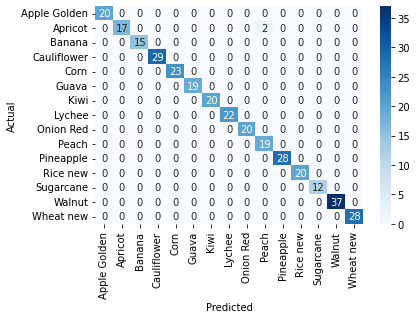

test accuracy : 99.39577039274926


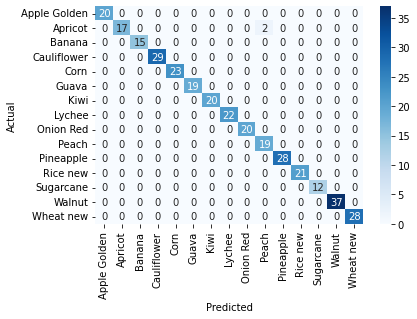

test accuracy : 99.3975903614458


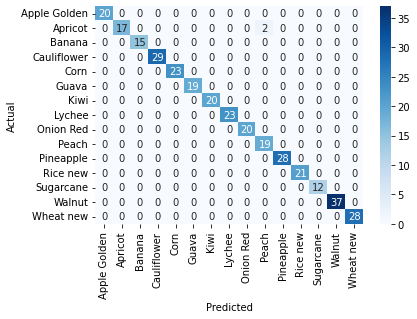

test accuracy : 99.3993993993994


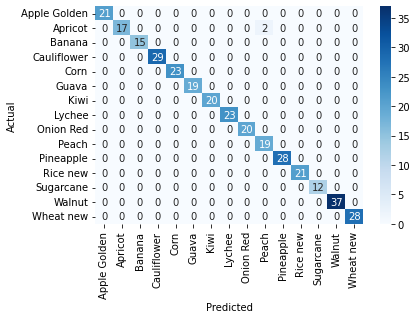

test accuracy : 99.40119760479041


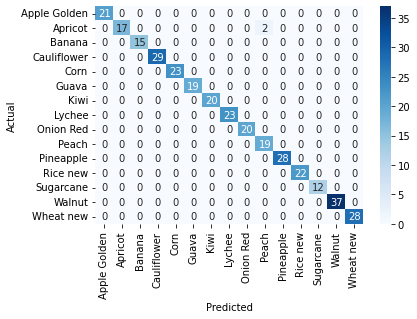

test accuracy : 99.40298507462687


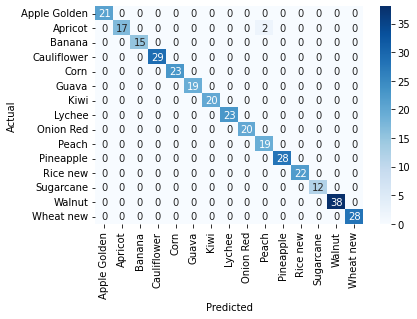

test accuracy : 99.40476190476191


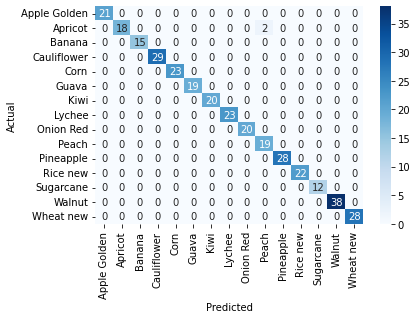

test accuracy : 99.40652818991099


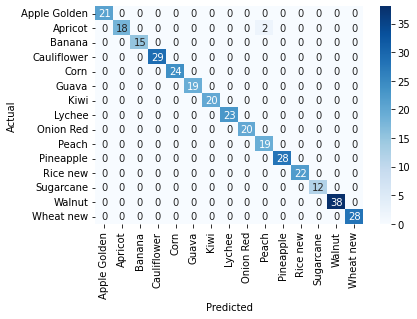

test accuracy : 99.40828402366864


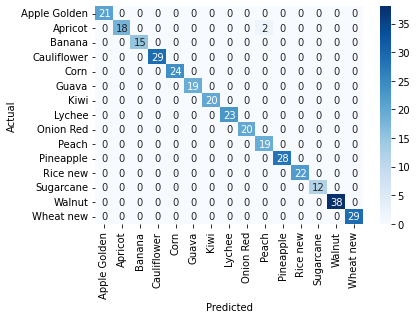

test accuracy : 99.41002949852508


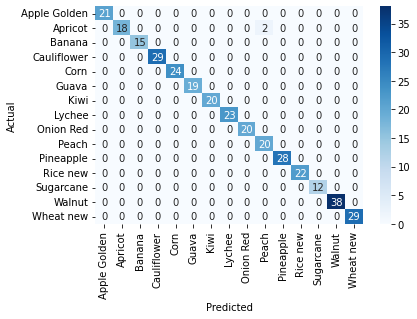

test accuracy : 99.41176470588235


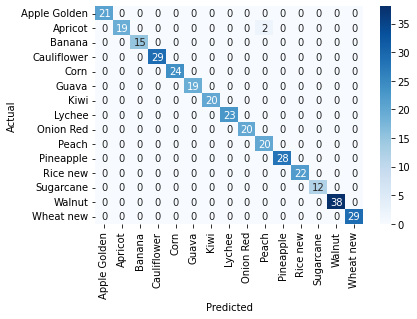

test accuracy : 99.41348973607037


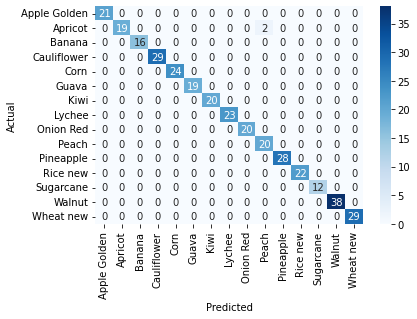

test accuracy : 99.41520467836257


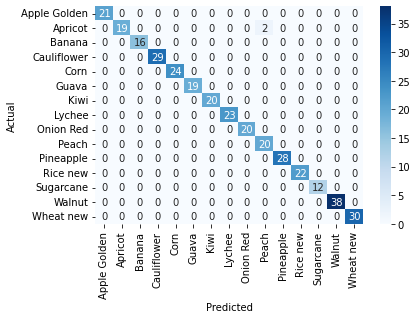

test accuracy : 99.41690962099126


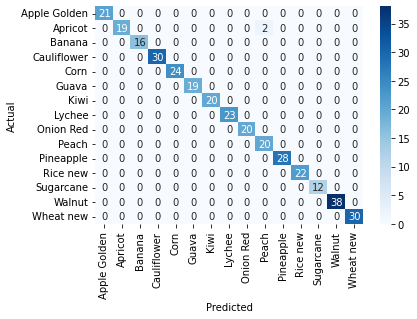

test accuracy : 99.4186046511628


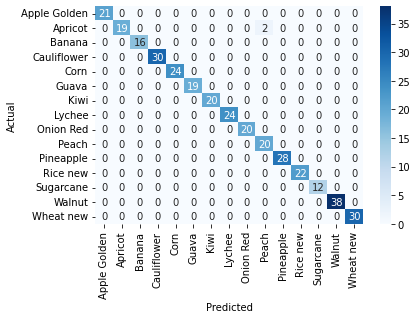

test accuracy : 99.42028985507247


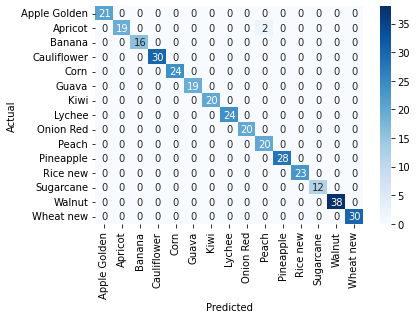

test accuracy : 99.42196531791907


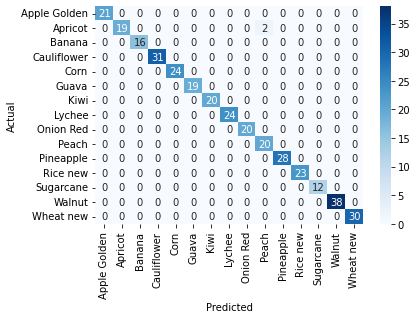

test accuracy : 99.42363112391931


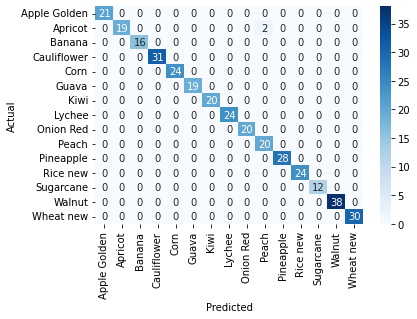

test accuracy : 99.42528735632183


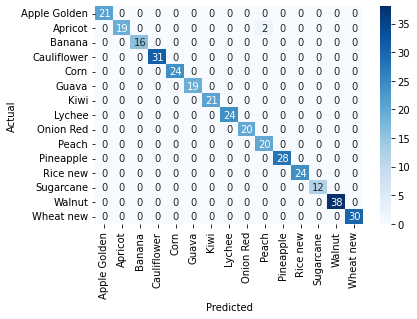

test accuracy : 99.42693409742121


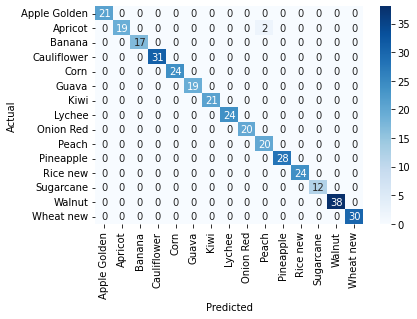

test accuracy : 99.42857142857143


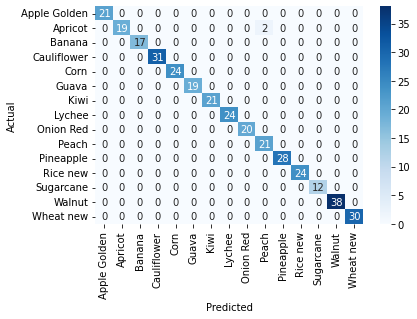

test accuracy : 99.43019943019942


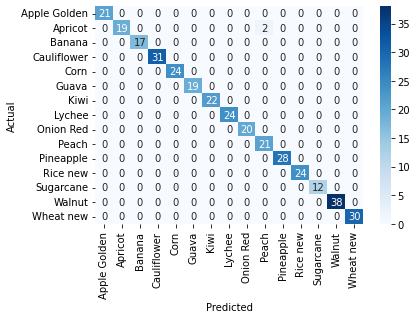

test accuracy : 99.43181818181817


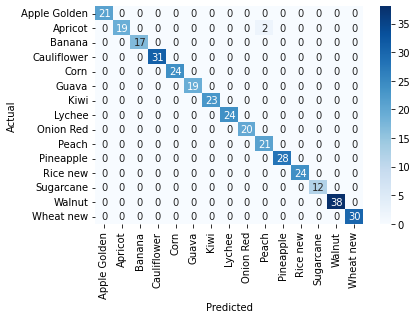

test accuracy : 99.43342776203966


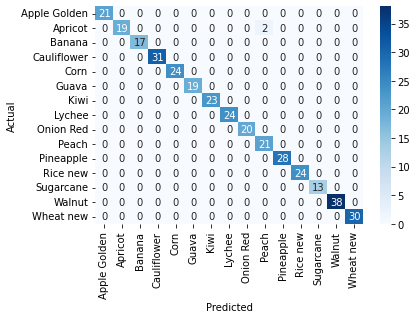

test accuracy : 99.43502824858757


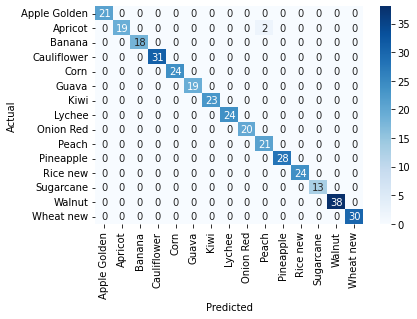

test accuracy : 99.43661971830986


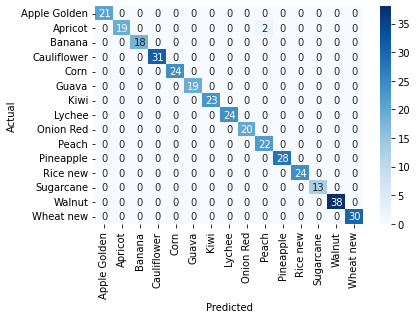

test accuracy : 99.43820224719101


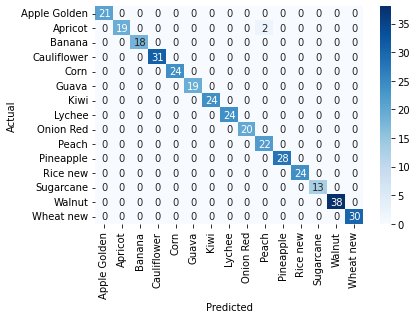

test accuracy : 99.43977591036415


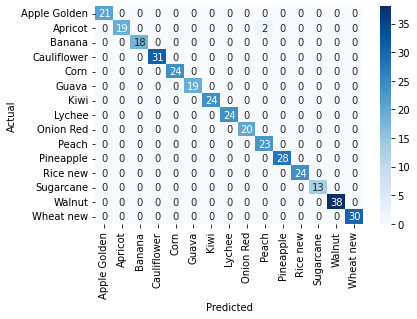

test accuracy : 99.4413407821229


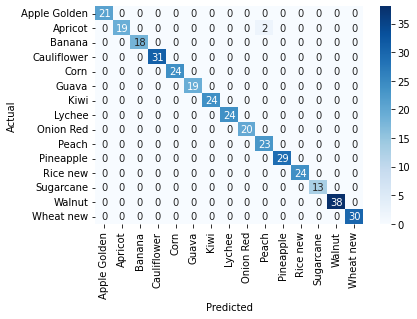

test accuracy : 99.44289693593315


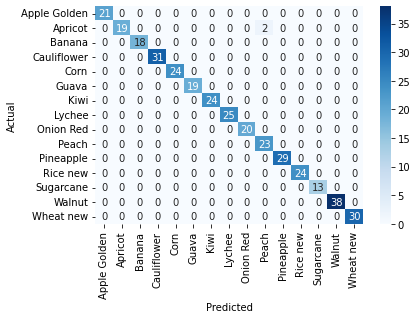

test accuracy : 99.44444444444444


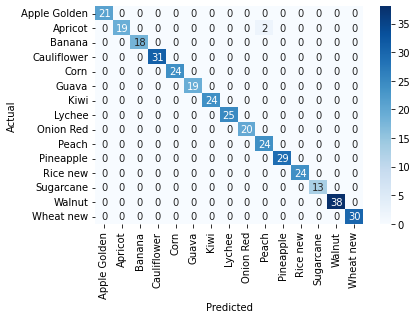

test accuracy : 99.44598337950139


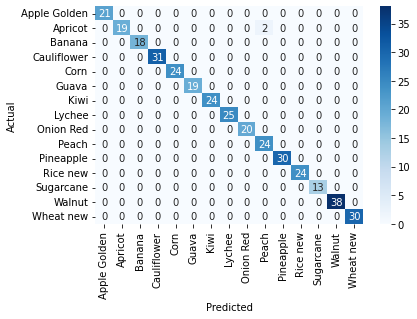

test accuracy : 99.4475138121547


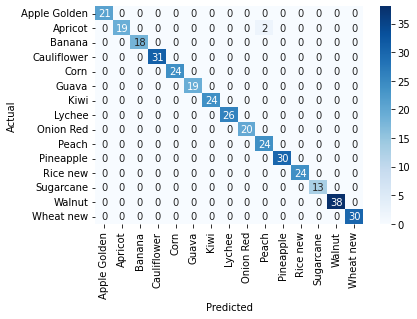

test accuracy : 99.44903581267218


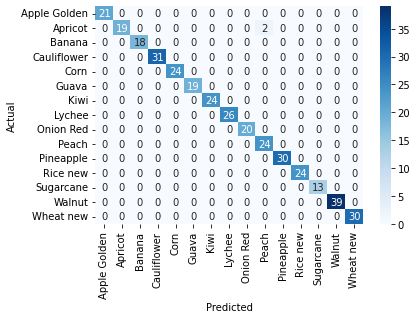

test accuracy : 99.45054945054946


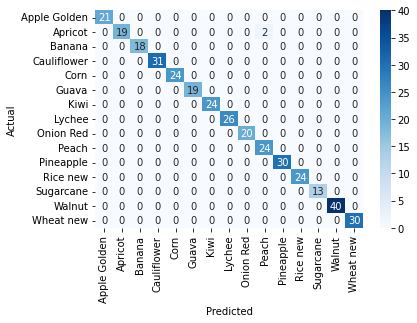

test accuracy : 99.45205479452055


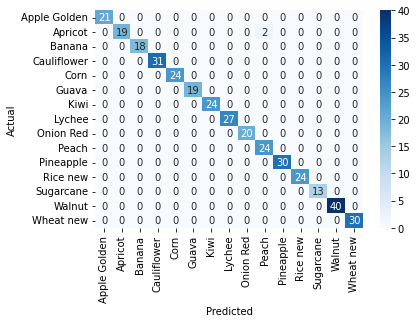

test accuracy : 99.4535519125683


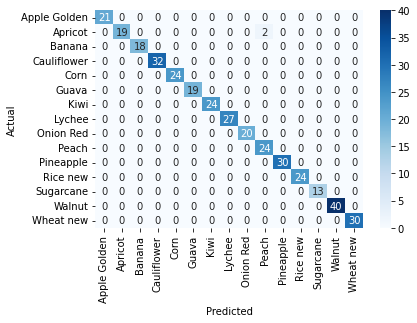

test accuracy : 99.45504087193461


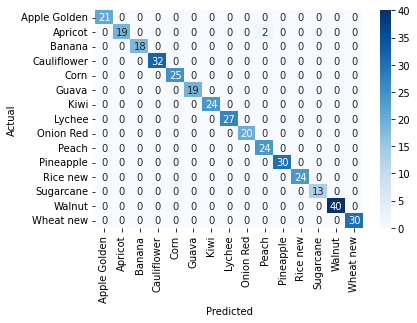

test accuracy : 99.45652173913044


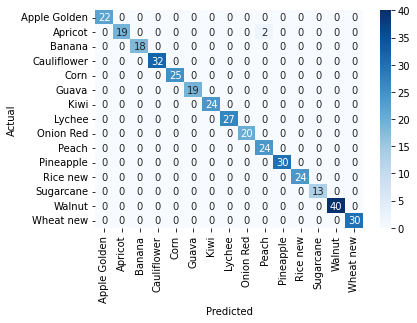

test accuracy : 99.45799457994579


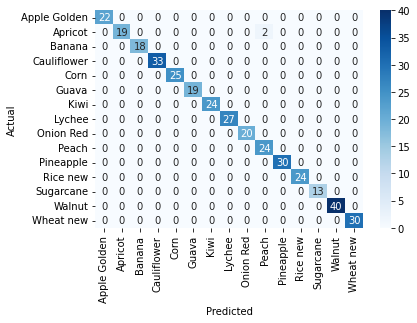

test accuracy : 99.45945945945947


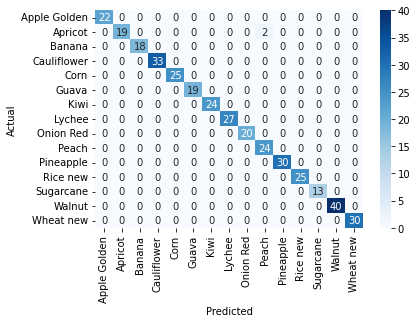

test accuracy : 99.46091644204851


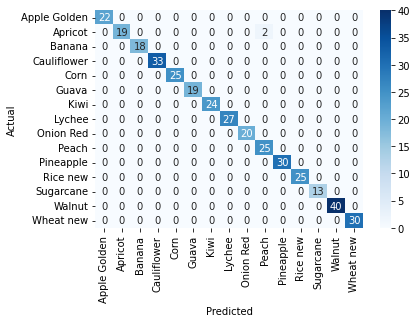

test accuracy : 99.46236559139786


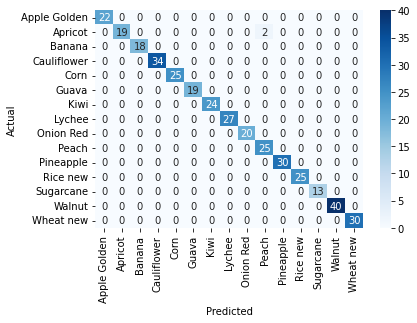

test accuracy : 99.46380697050938


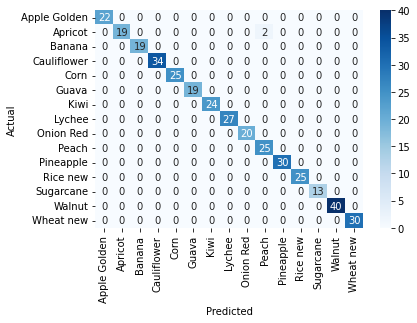

test accuracy : 99.46524064171123


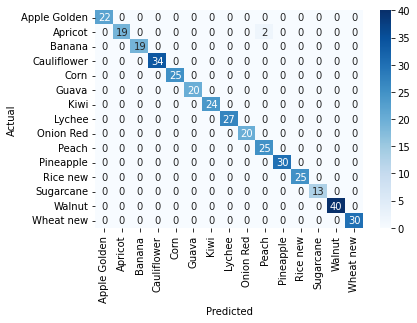

test accuracy : 99.46666666666667


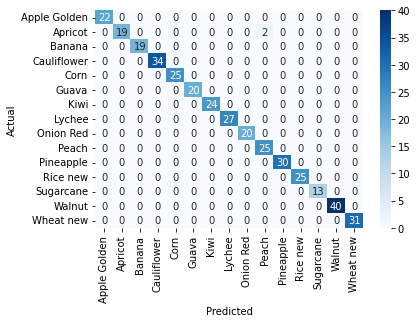

test accuracy : 99.46808510638297


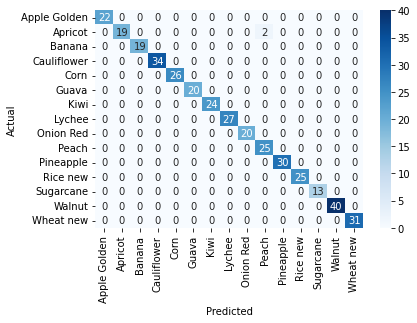

test accuracy : 99.46949602122017


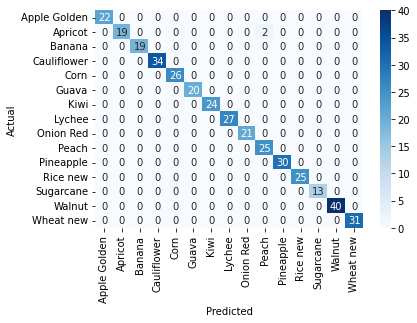

test accuracy : 99.47089947089947


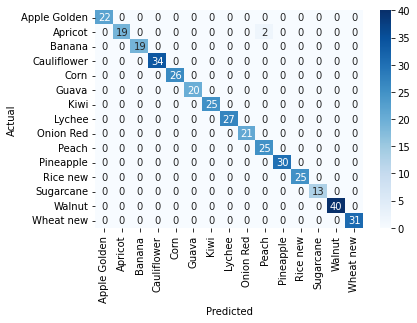

test accuracy : 99.47229551451187


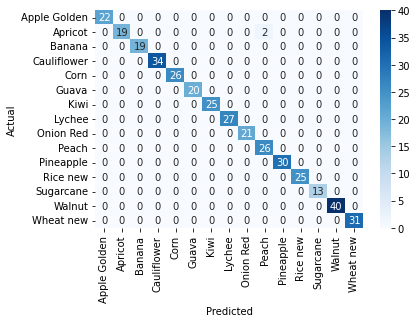

test accuracy : 99.47368421052632


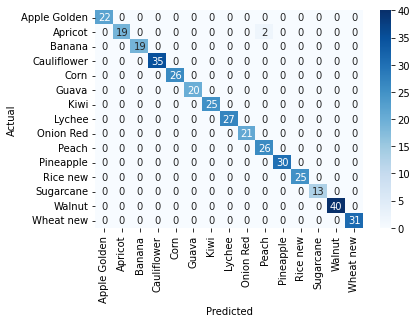

test accuracy : 99.47506561679789


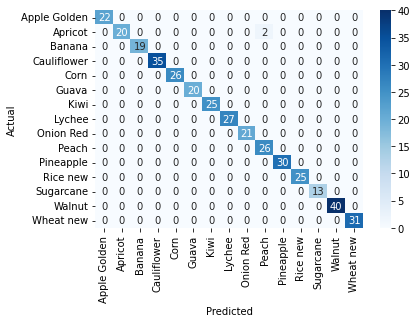

test accuracy : 99.47643979057592


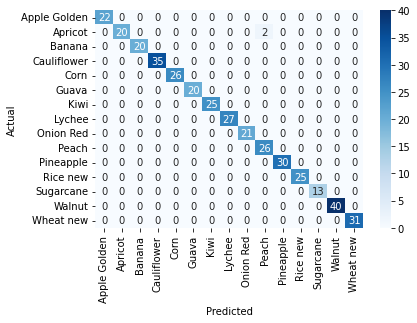

test accuracy : 99.47780678851174


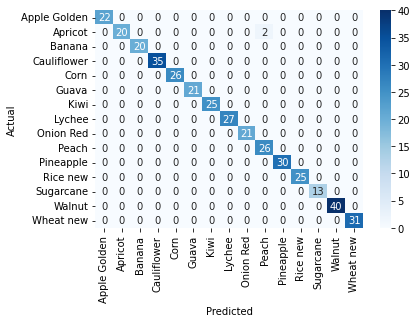

test accuracy : 99.47916666666666


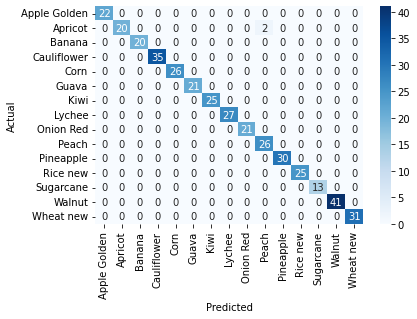

test accuracy : 99.48051948051948


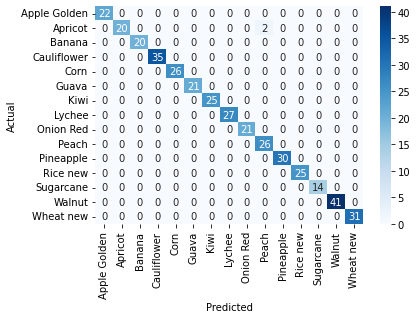

test accuracy : 99.48186528497409


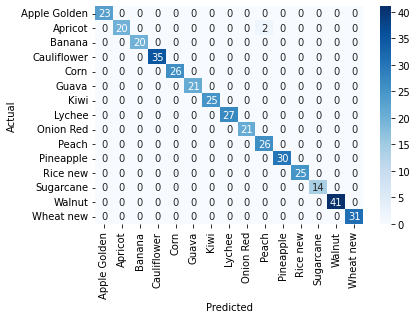

test accuracy : 99.48320413436691


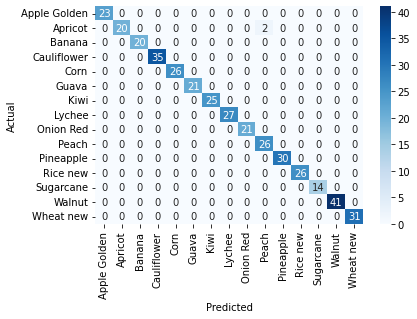

test accuracy : 99.48453608247422


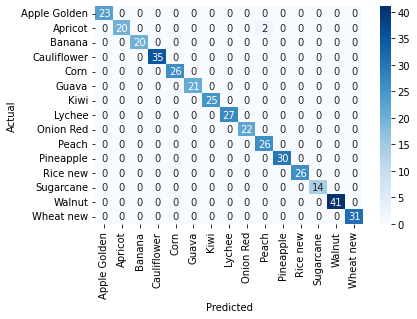

test accuracy : 99.48586118251927


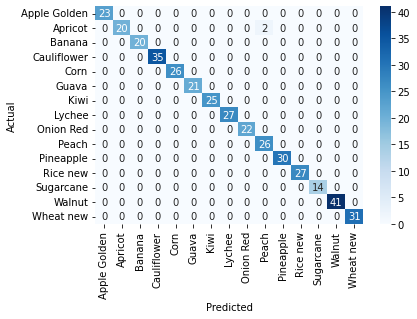

test accuracy : 99.48717948717949


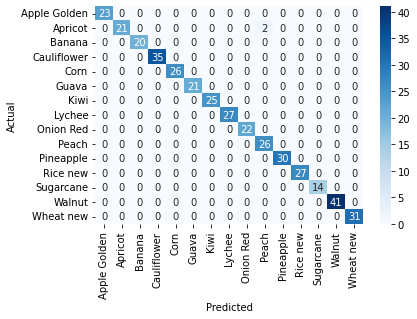

test accuracy : 99.48849104859335


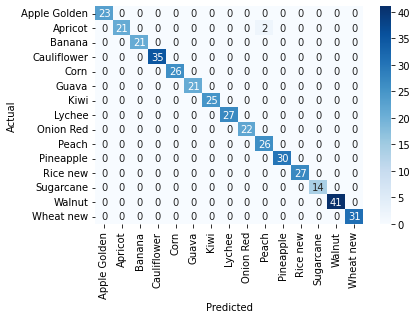

test accuracy : 99.48979591836735


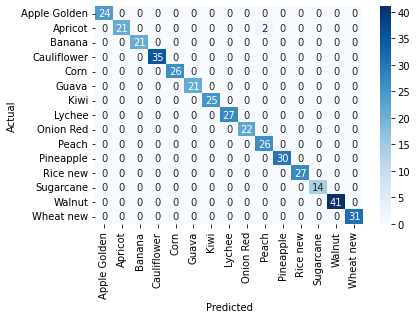

test accuracy : 99.49109414758269


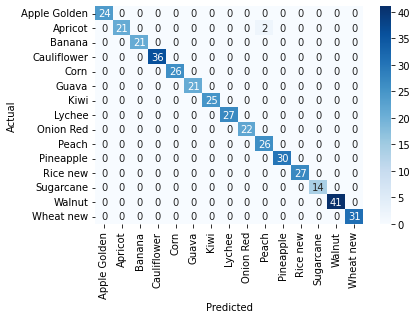

test accuracy : 99.49238578680203


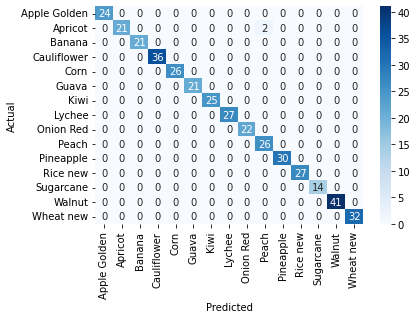

test accuracy : 99.49367088607595


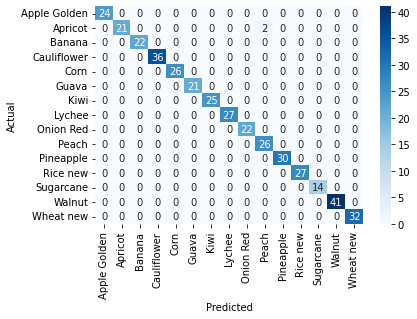

test accuracy : 99.4949494949495


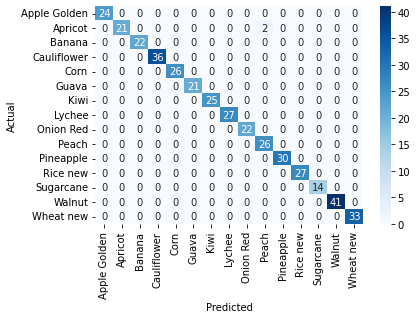

test accuracy : 99.49622166246851


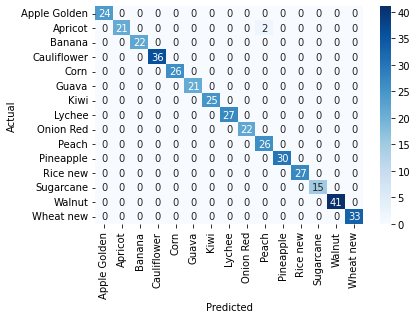

test accuracy : 99.49748743718592


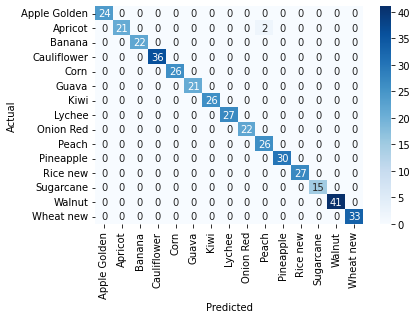

test accuracy : 99.49874686716792


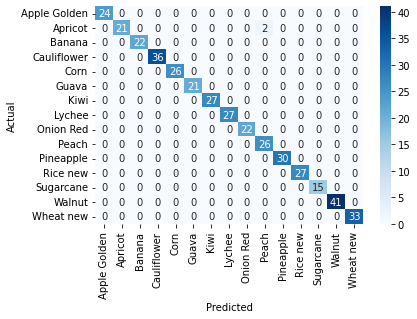

test accuracy : 99.5


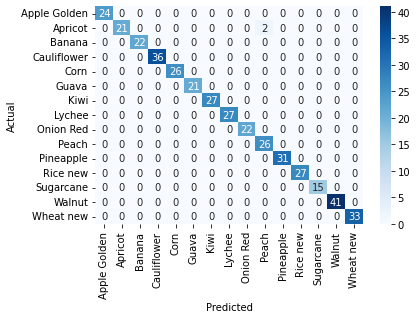

test accuracy : 99.50124688279301


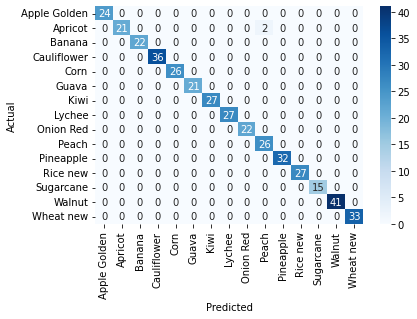

test accuracy : 99.50248756218906


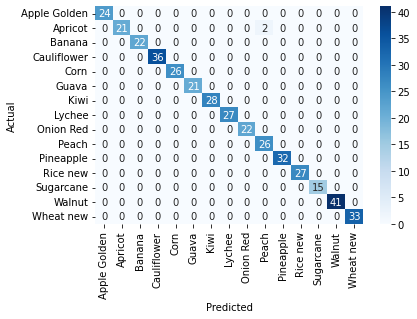

test accuracy : 99.50372208436724


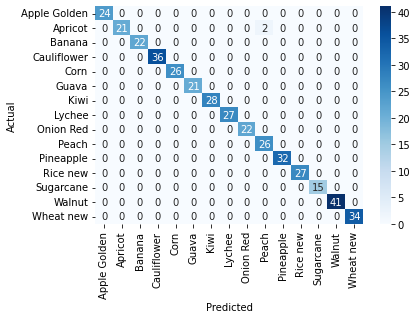

test accuracy : 99.5049504950495


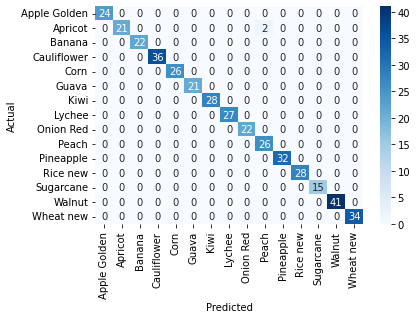

test accuracy : 99.50617283950616


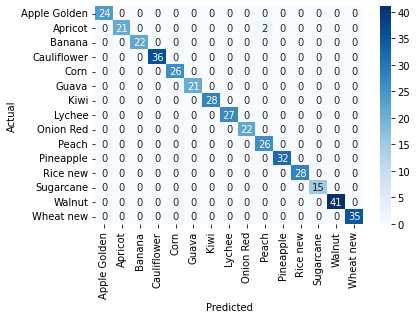

test accuracy : 99.50738916256158


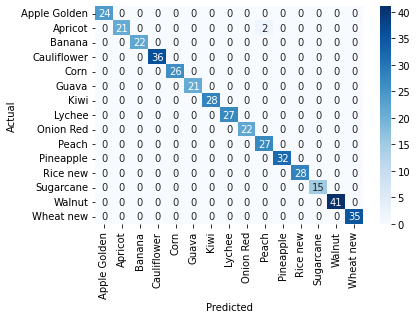

test accuracy : 99.5085995085995


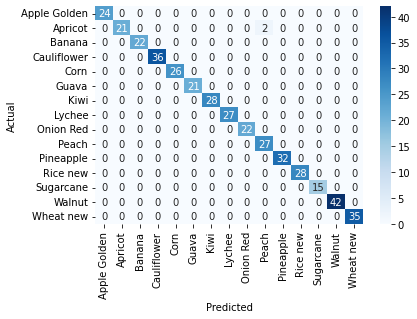

test accuracy : 99.50980392156863


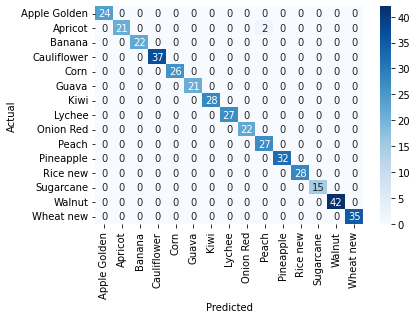

test accuracy : 99.51100244498777


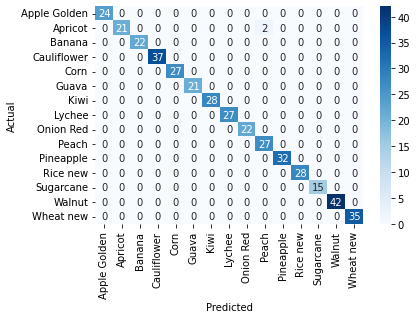

test accuracy : 99.51219512195122


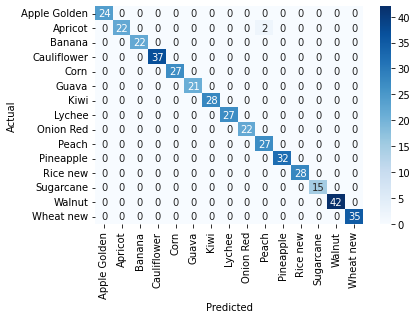

test accuracy : 99.51338199513383


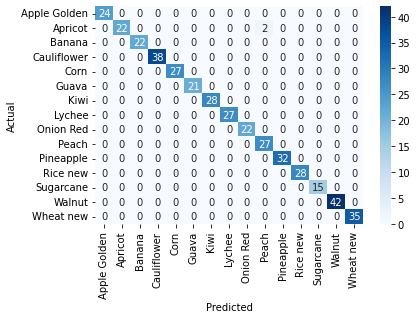

test accuracy : 99.51456310679612


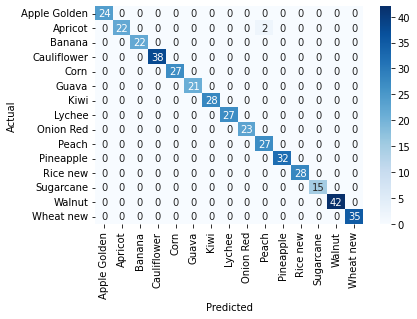

test accuracy : 99.51573849878935


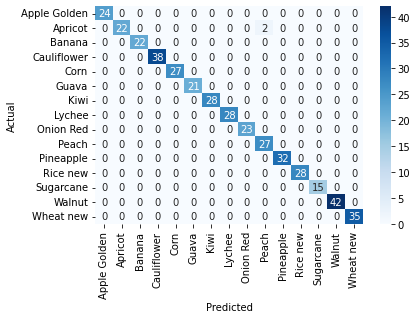

test accuracy : 99.51690821256038


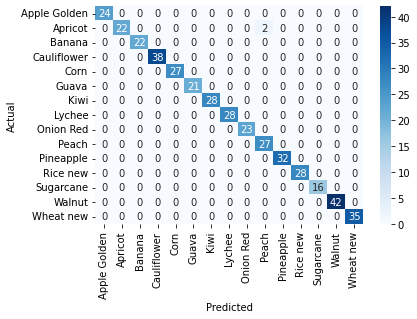

test accuracy : 99.51807228915662


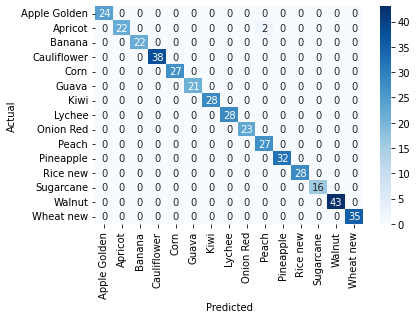

test accuracy : 99.51923076923077


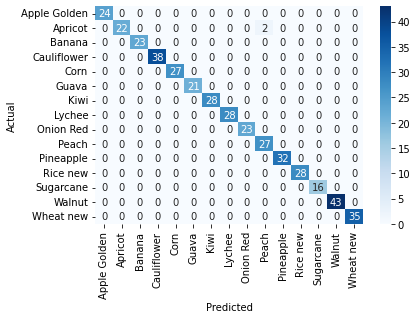

test accuracy : 99.52038369304557


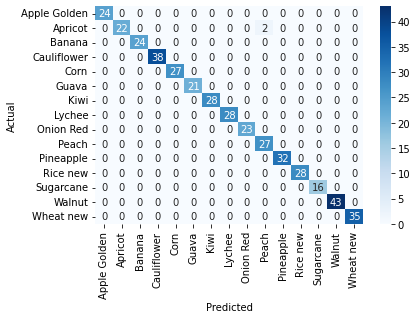

test accuracy : 99.52153110047847


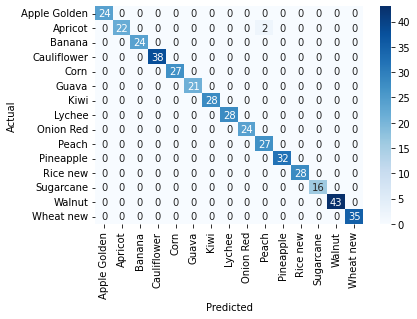

test accuracy : 99.52267303102626


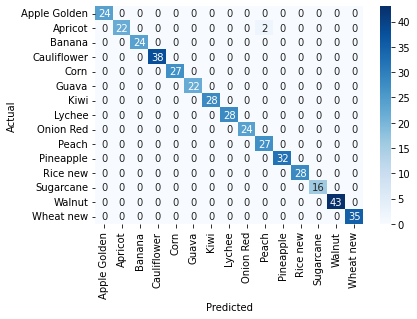

test accuracy : 99.52380952380952


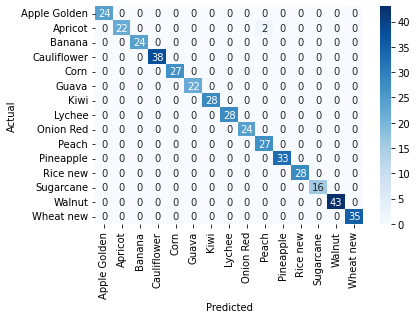

test accuracy : 99.5249406175772


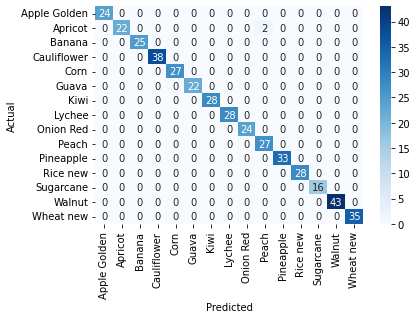

test accuracy : 99.52606635071089


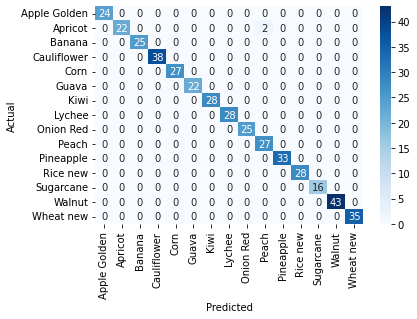

test accuracy : 99.52718676122932


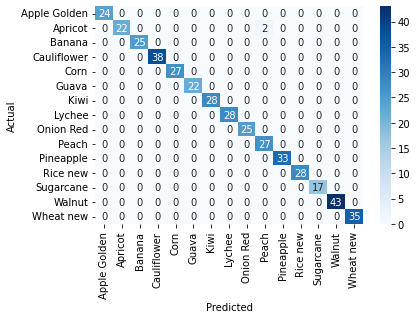

test accuracy : 99.52830188679245


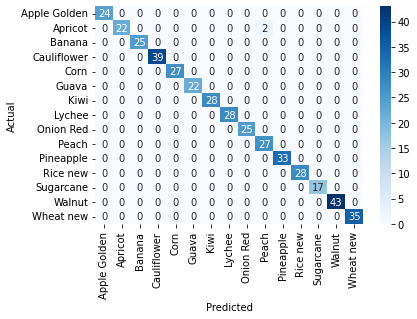

test accuracy : 99.52941176470588


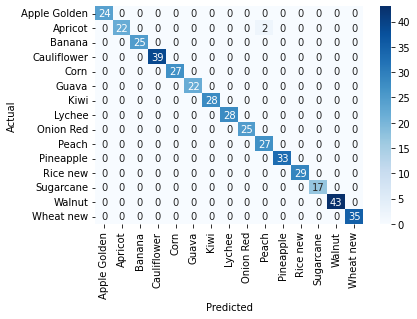

test accuracy : 99.53051643192488


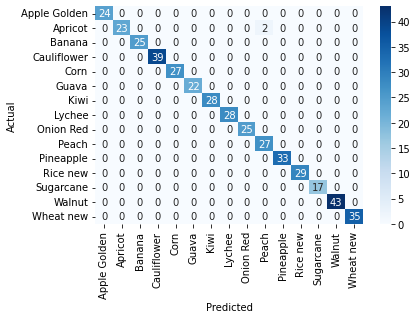

test accuracy : 99.53161592505855


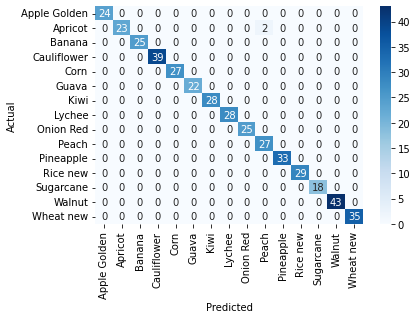

test accuracy : 99.53271028037383


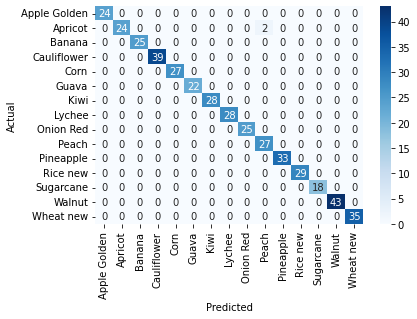

test accuracy : 99.53379953379954


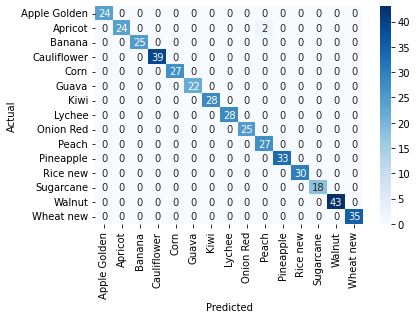

test accuracy : 99.53488372093024


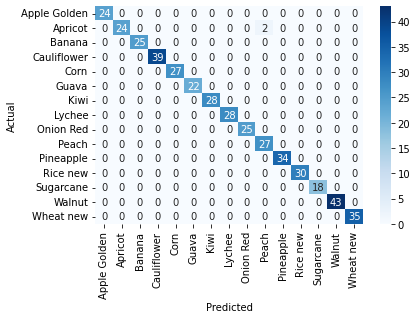

test accuracy : 99.53596287703016


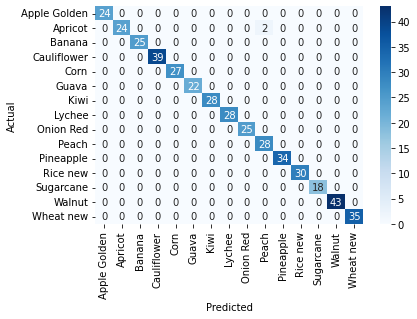

test accuracy : 99.53703703703704


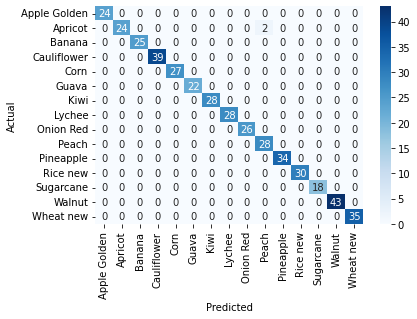

test accuracy : 99.53810623556582


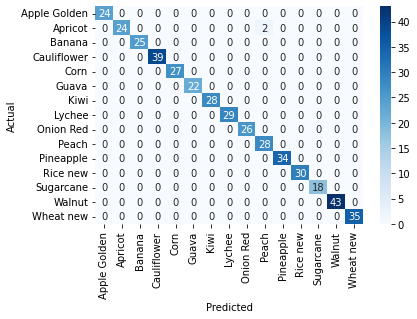

test accuracy : 99.53917050691244


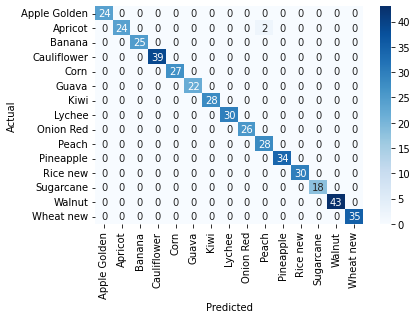

test accuracy : 99.54022988505747


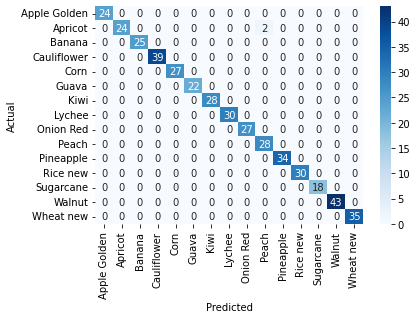

test accuracy : 99.54128440366972


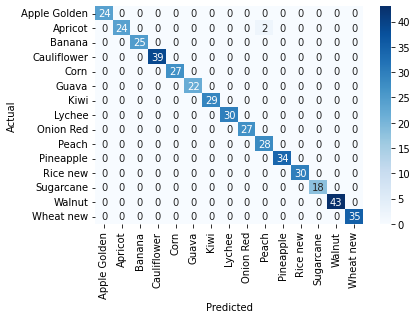

test accuracy : 99.54233409610984


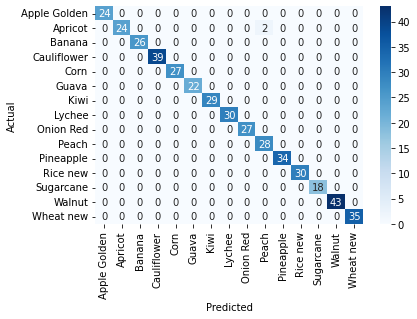

test accuracy : 99.54337899543378


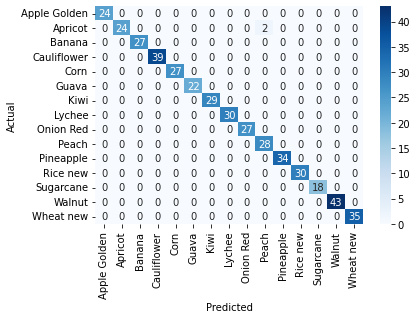

test accuracy : 99.54441913439635


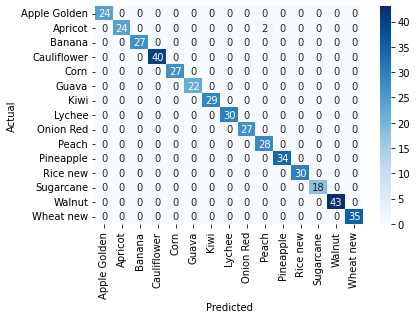

test accuracy : 99.54545454545455


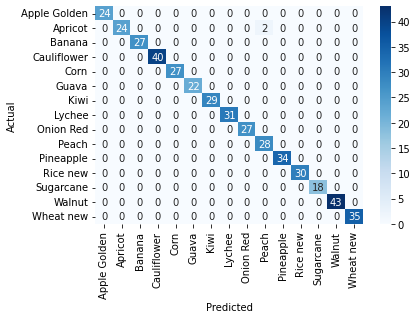

test accuracy : 99.54648526077098


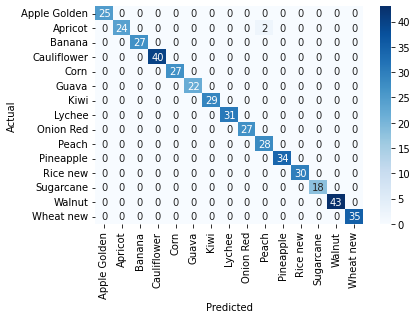

test accuracy : 99.5475113122172


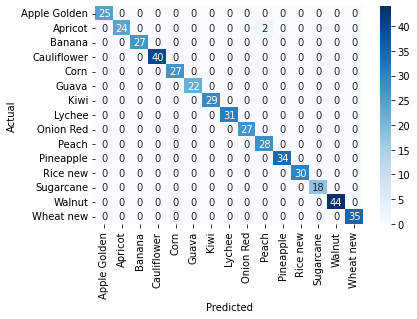

test accuracy : 99.54853273137697


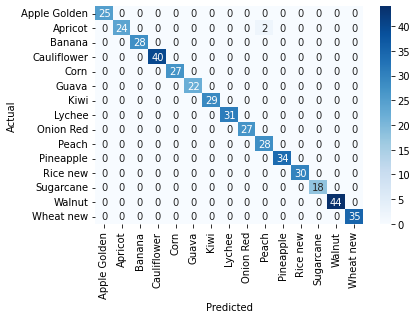

test accuracy : 99.54954954954955


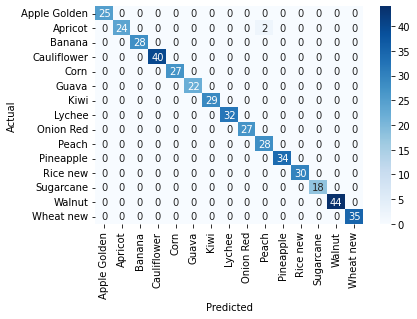

test accuracy : 99.5505617977528


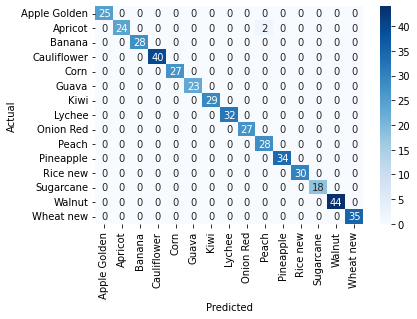

test accuracy : 99.55156950672645


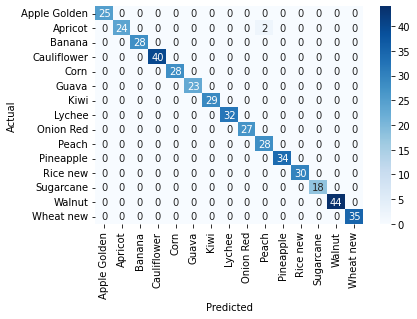

test accuracy : 99.55257270693512


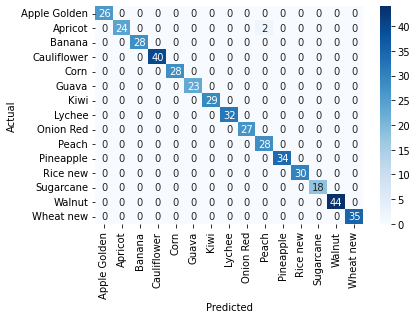

test accuracy : 99.55357142857143


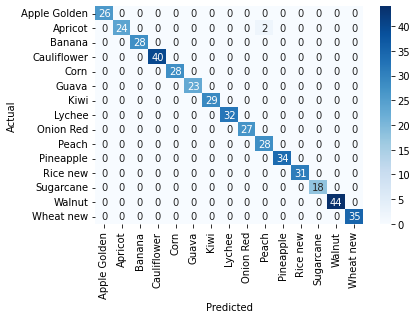

test accuracy : 99.55456570155901


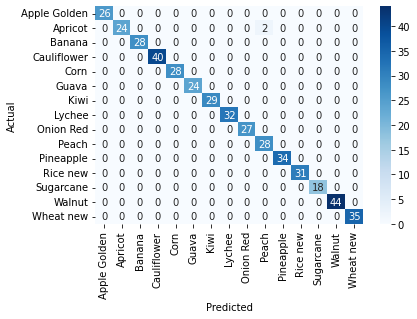

test accuracy : 99.55555555555556


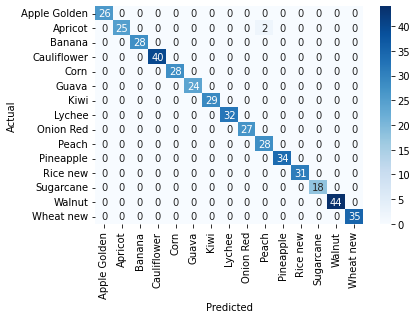

test accuracy : 99.55654101995566


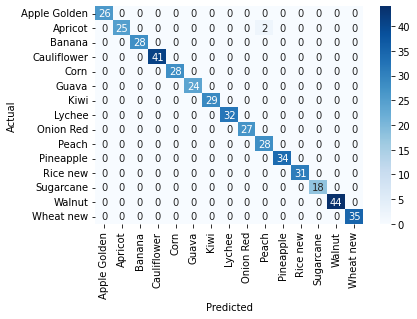

test accuracy : 99.5575221238938


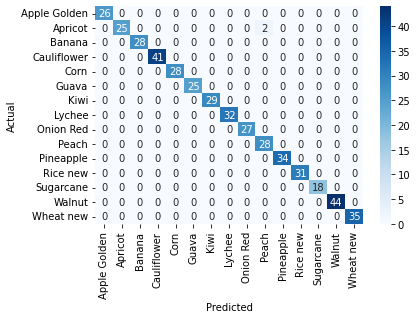

test accuracy : 99.55849889624724


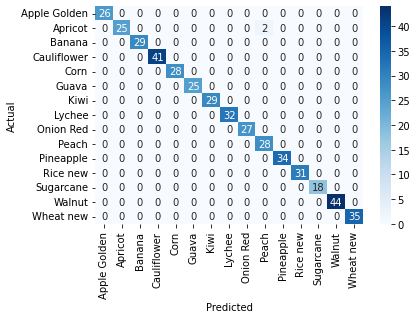

test accuracy : 99.55947136563876


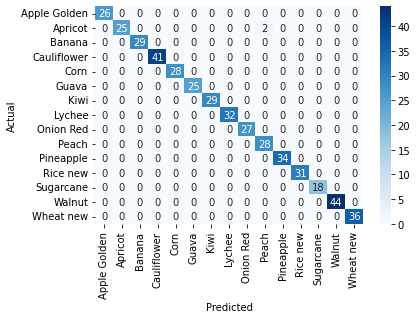

test accuracy : 99.56043956043956


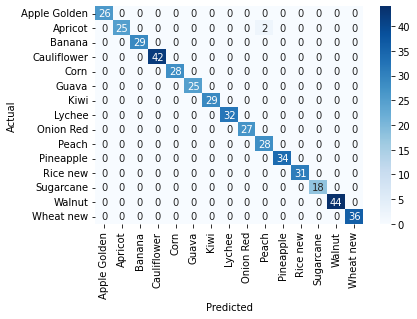

test accuracy : 99.56140350877193


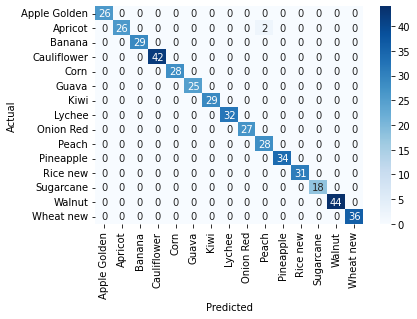

test accuracy : 99.56236323851203


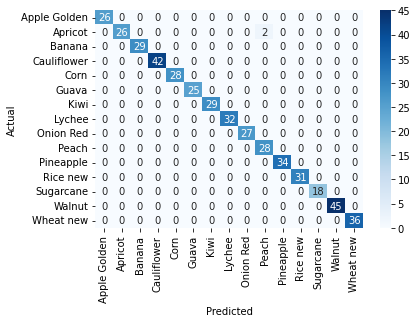

test accuracy : 99.56331877729258


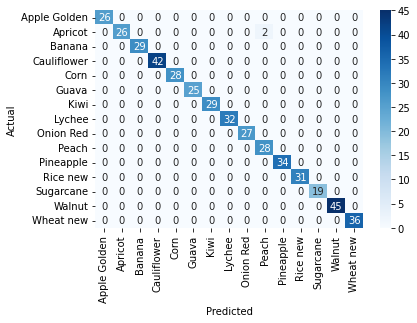

test accuracy : 99.56427015250546


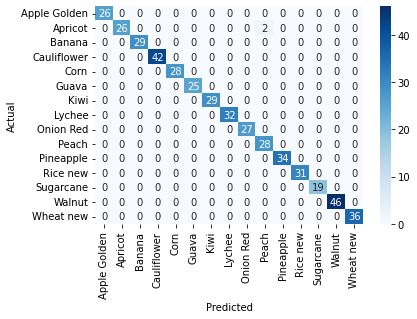

test accuracy : 99.56521739130434


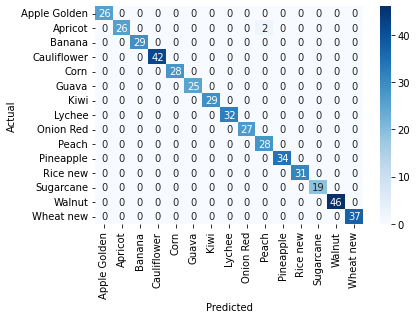

test accuracy : 99.56616052060737


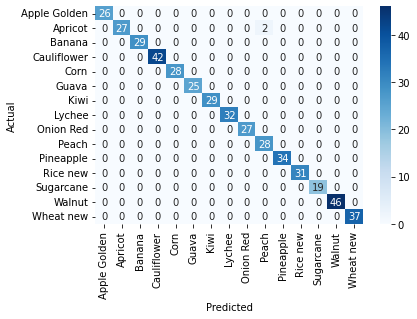

test accuracy : 99.56709956709958


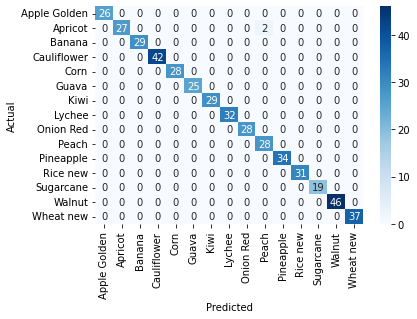

test accuracy : 99.56803455723542


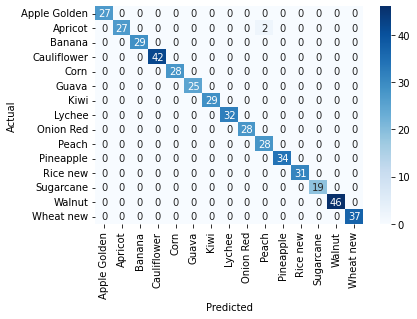

test accuracy : 99.56896551724138


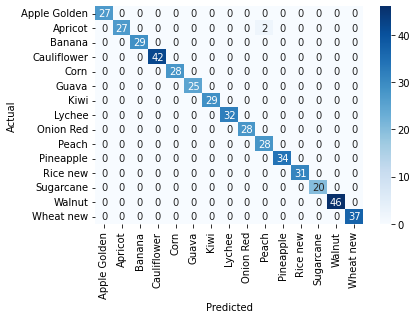

test accuracy : 99.56989247311829


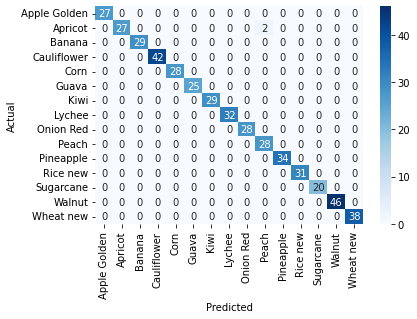

test accuracy : 99.57081545064378


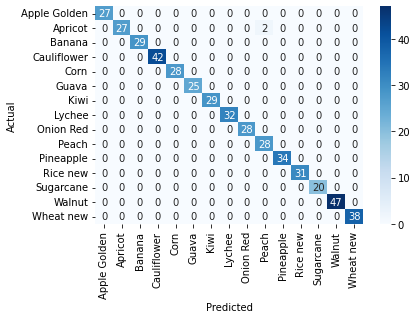

test accuracy : 99.57173447537473


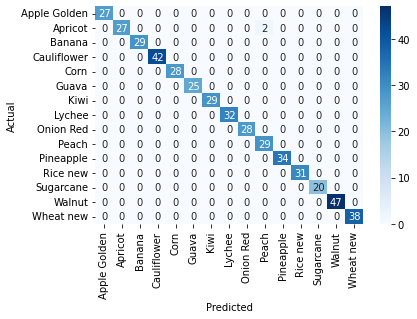

test accuracy : 99.57264957264957


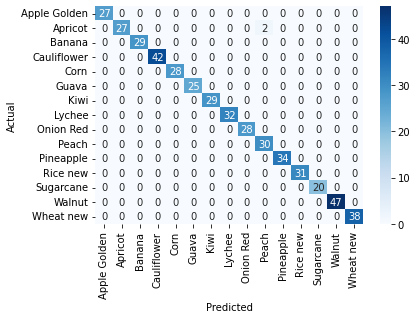

test accuracy : 99.57356076759062


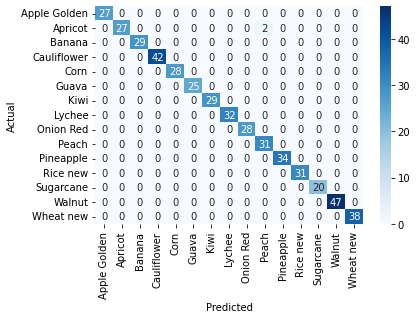

test accuracy : 99.57446808510639


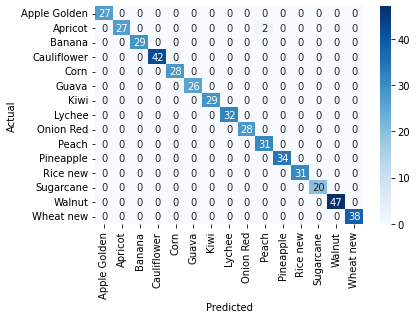

test accuracy : 99.57537154989384


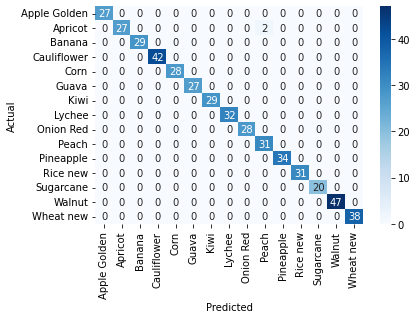

test accuracy : 99.57627118644068


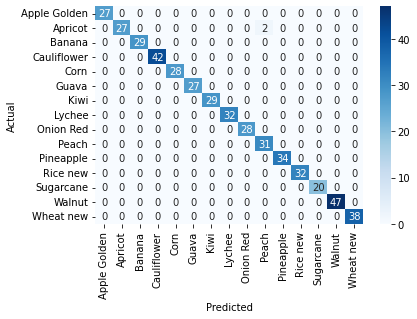

test accuracy : 99.57716701902748


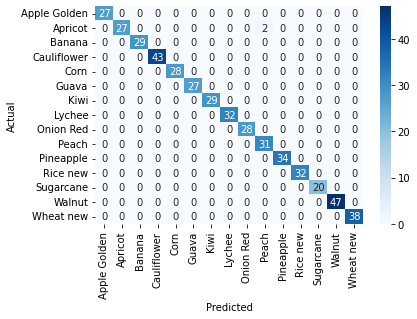

test accuracy : 99.57805907172997


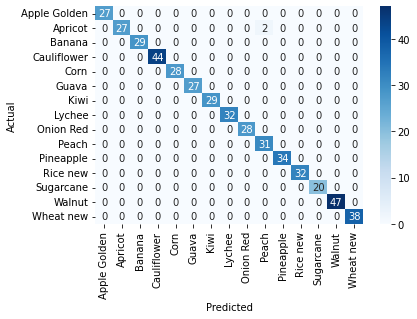

test accuracy : 99.57894736842105


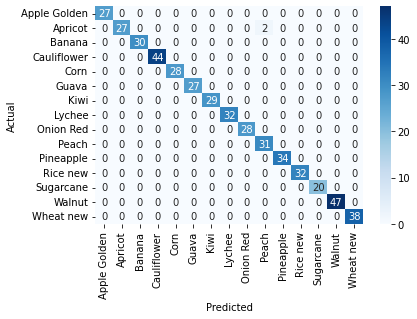

test accuracy : 99.57983193277312


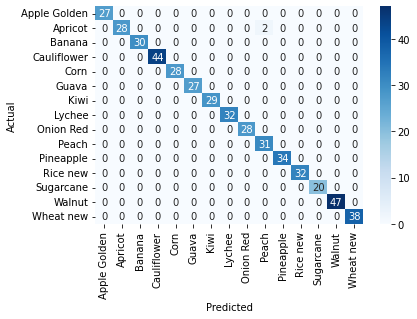

test accuracy : 99.58071278825996


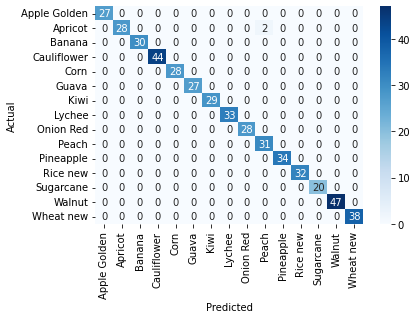

test accuracy : 99.581589958159


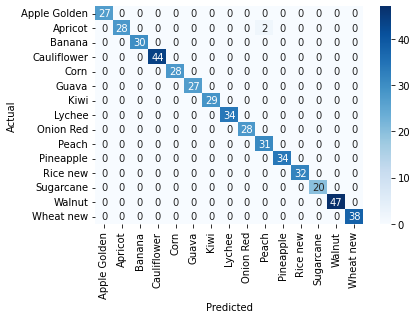

test accuracy : 99.58246346555325


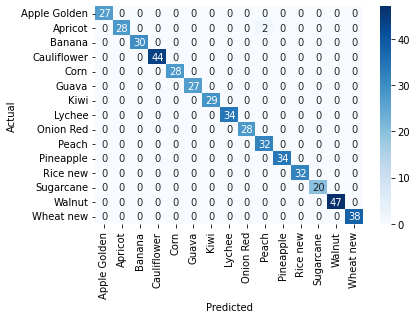

test accuracy : 99.58333333333333


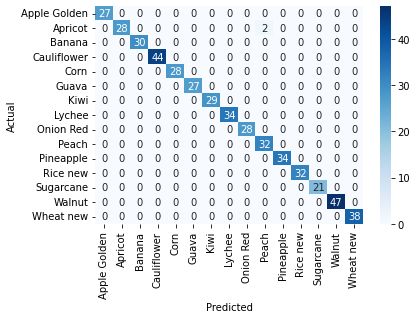

test accuracy : 99.58419958419958


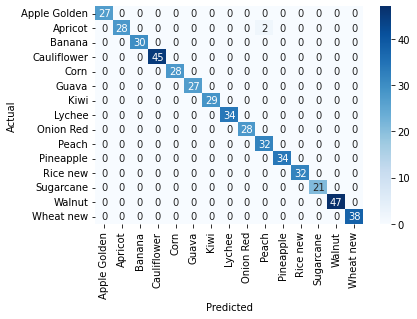

test accuracy : 99.5850622406639


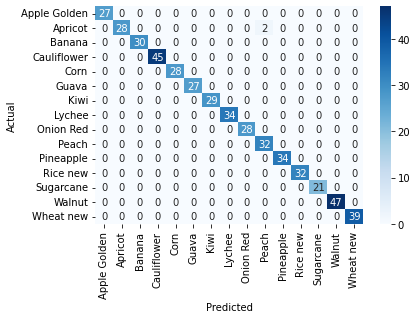

test accuracy : 99.58592132505176


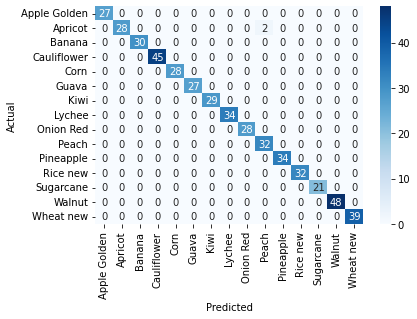

test accuracy : 99.58677685950413


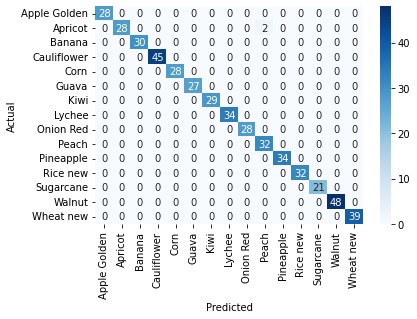

test accuracy : 99.58762886597938


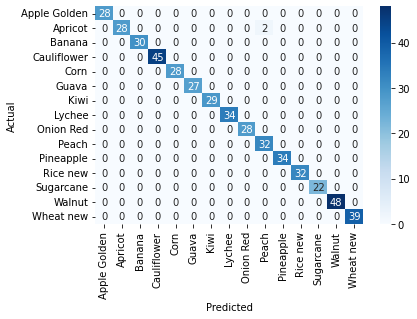

test accuracy : 99.58847736625515


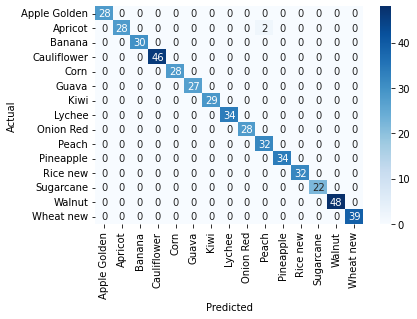

test accuracy : 99.58932238193019


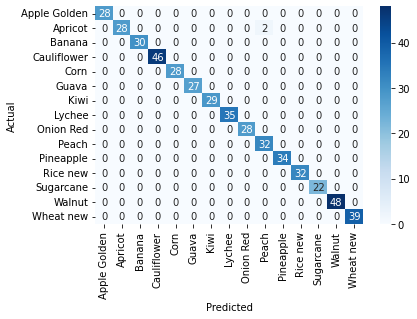

test accuracy : 99.59016393442623


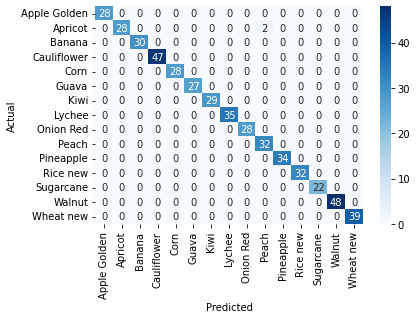

test accuracy : 99.59100204498978


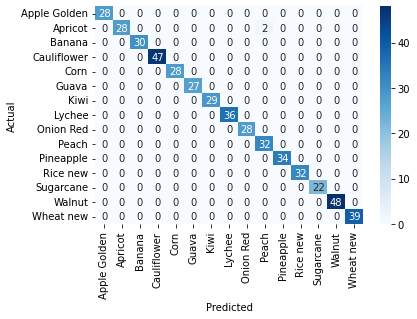

test accuracy : 99.59183673469387


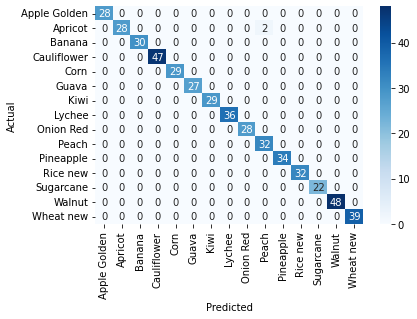

test accuracy : 99.59266802443992


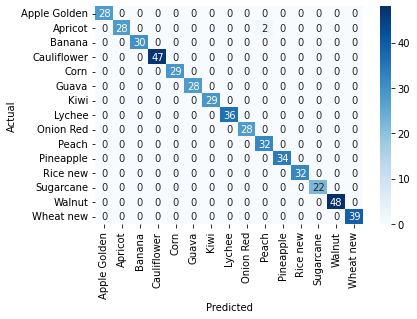

test accuracy : 99.59349593495935


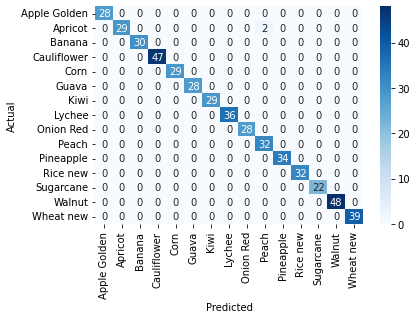

test accuracy : 99.59432048681542


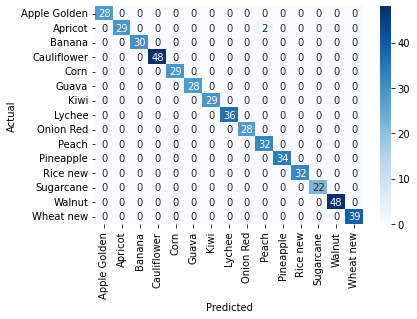

test accuracy : 99.59514170040485


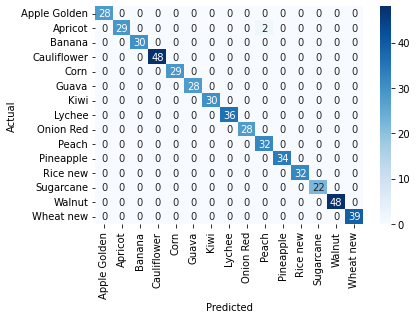

test accuracy : 99.5959595959596


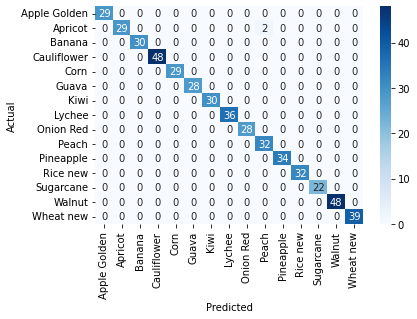

test accuracy : 99.59677419354838


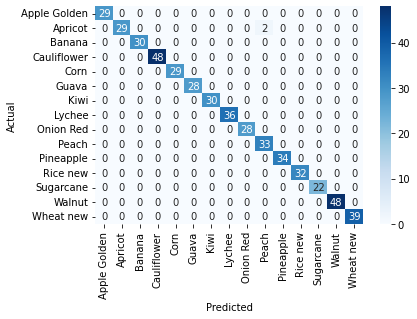

test accuracy : 99.59758551307847


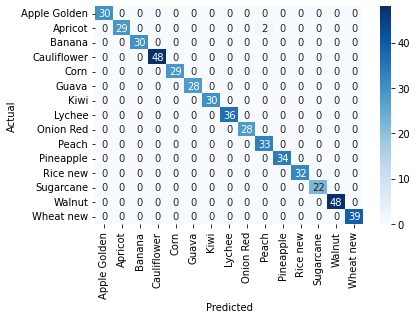

test accuracy : 99.59839357429718


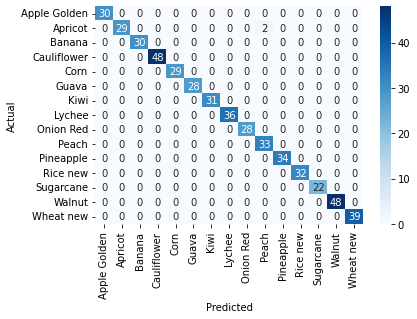

test accuracy : 99.59919839679358


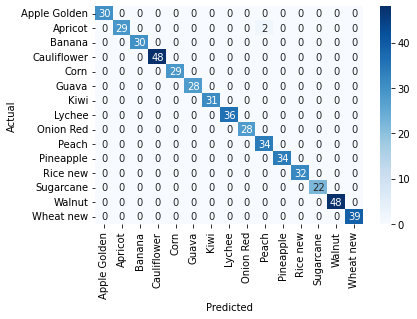

test accuracy : 99.6


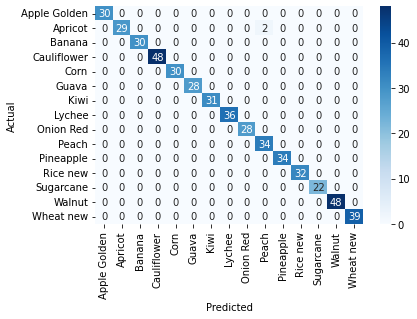

test accuracy : 99.60079840319361


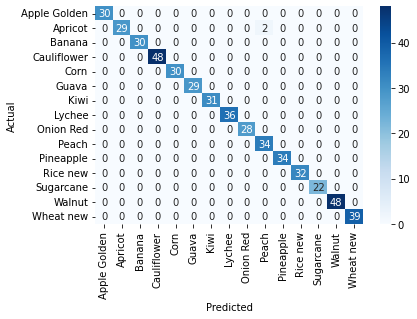

test accuracy : 99.60159362549801


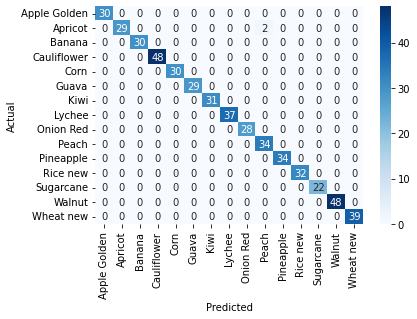

test accuracy : 99.60238568588468


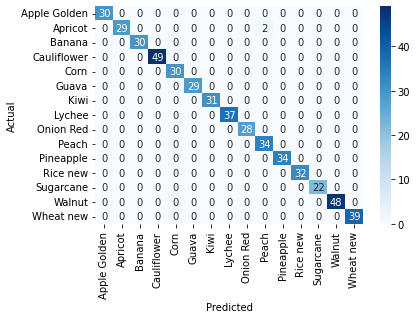

test accuracy : 99.60317460317461


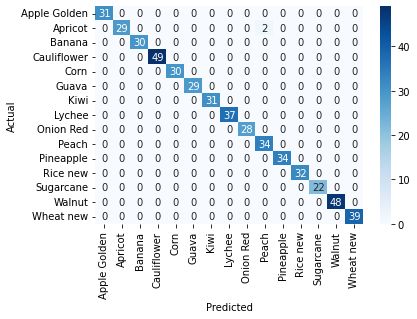

test accuracy : 99.60396039603961


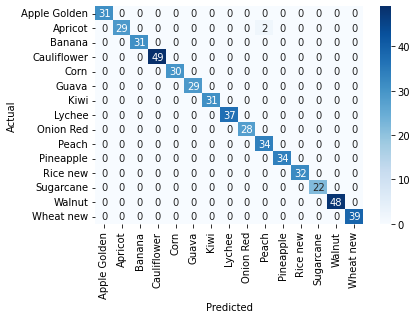

test accuracy : 99.60474308300395


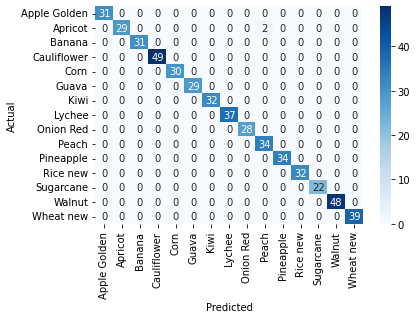

test accuracy : 99.60552268244575


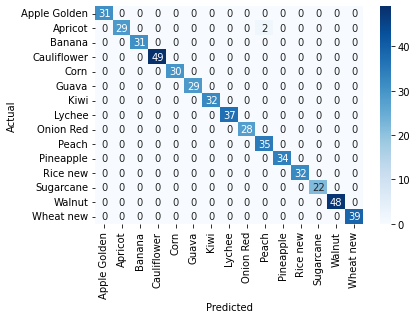

test accuracy : 99.60629921259843


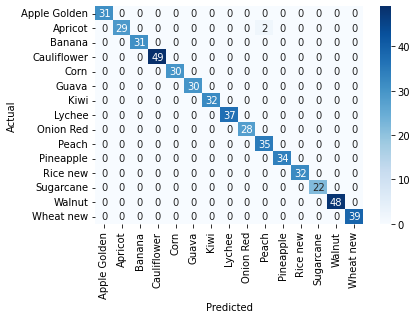

test accuracy : 99.60707269155206


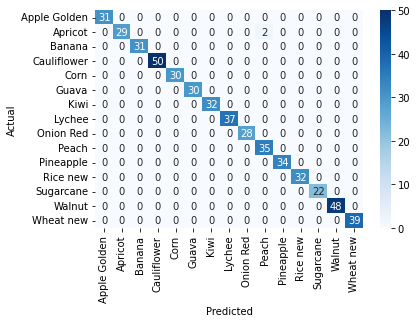

test accuracy : 99.6078431372549


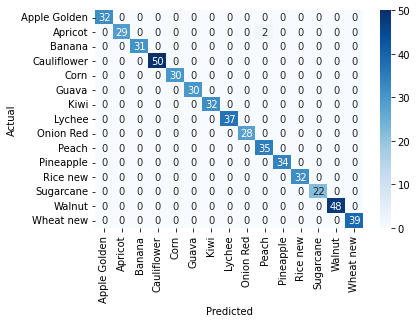

test accuracy : 99.60861056751467


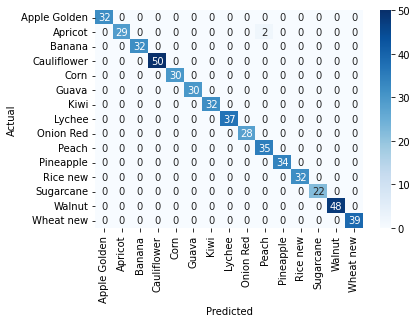

test accuracy : 99.609375


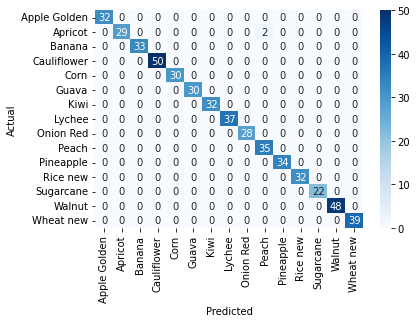

test accuracy : 99.61013645224172


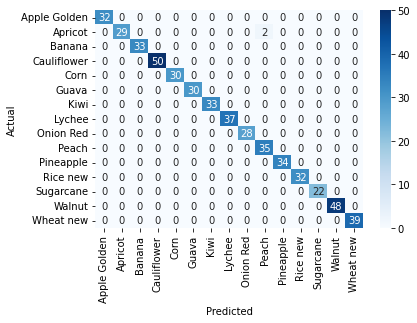

test accuracy : 99.61089494163424


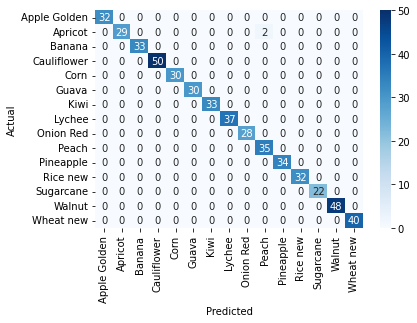

test accuracy : 99.6116504854369


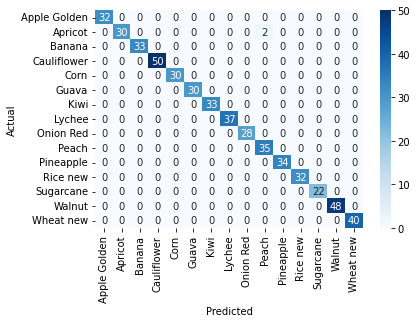

test accuracy : 99.6124031007752


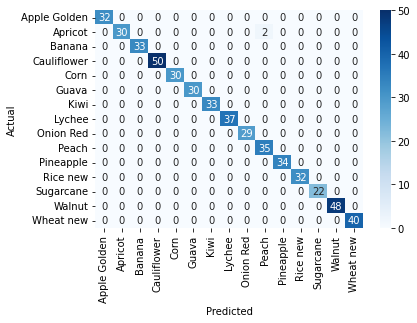

test accuracy : 99.61315280464217


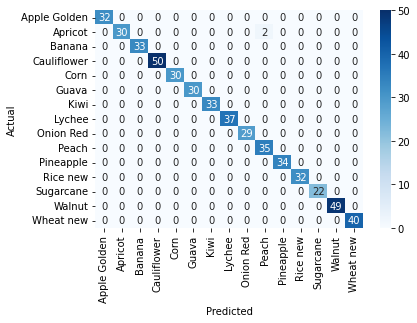

test accuracy : 99.61389961389962


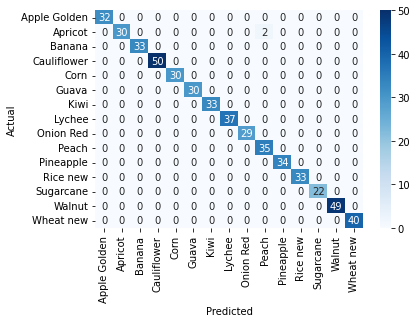

test accuracy : 99.61464354527938


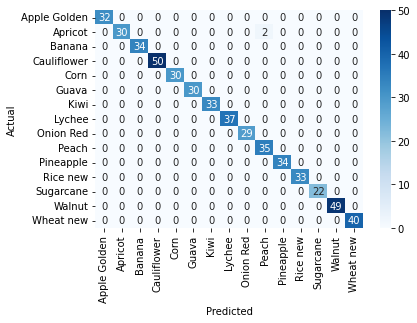

test accuracy : 99.61538461538461


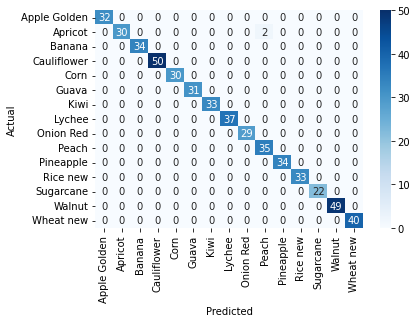

test accuracy : 99.61612284069098


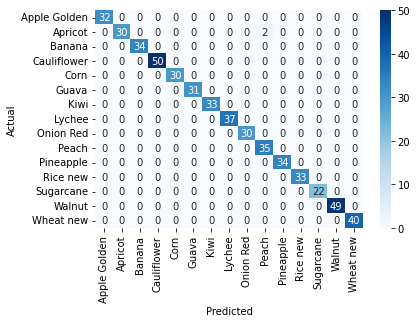

test accuracy : 99.61685823754789


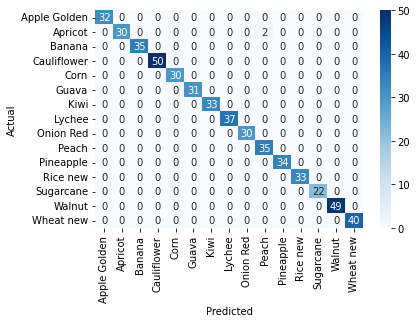

test accuracy : 99.61759082217974


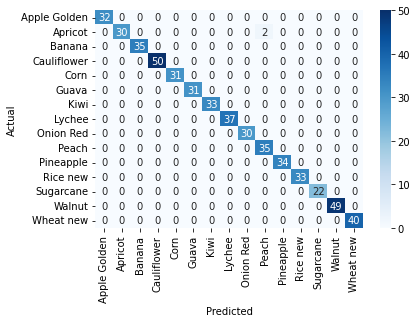

test accuracy : 99.61832061068702


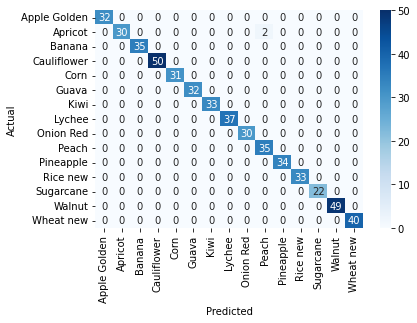

test accuracy : 99.61904761904762


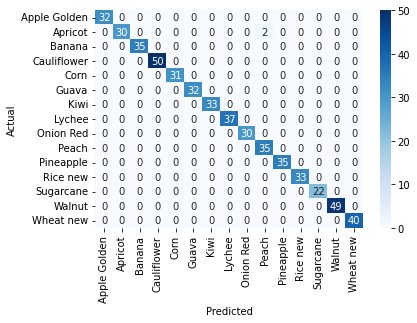

test accuracy : 99.61977186311786


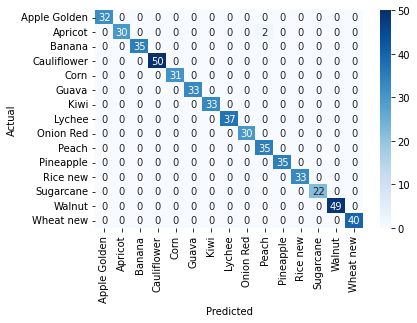

test accuracy : 99.62049335863378


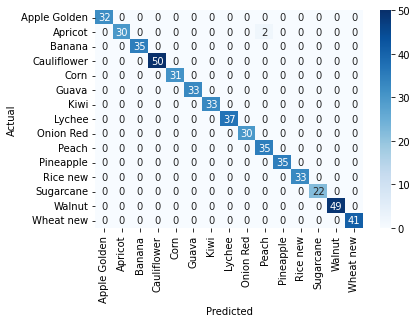

test accuracy : 99.62121212121212


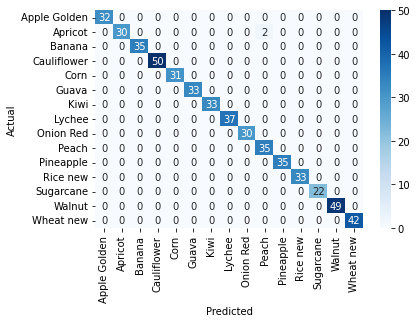

test accuracy : 99.62192816635161


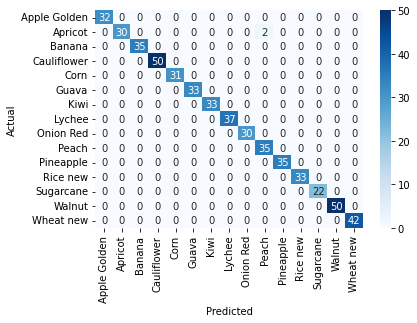

test accuracy : 99.62264150943396


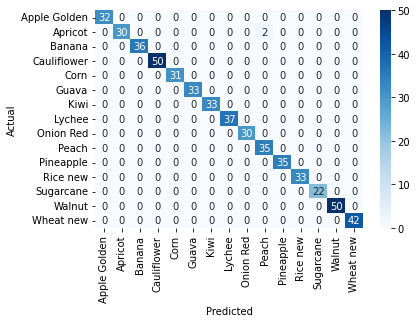

test accuracy : 99.62335216572504


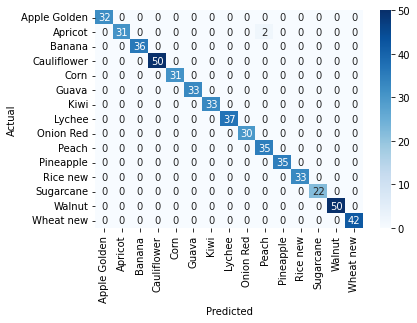

test accuracy : 99.62406015037594


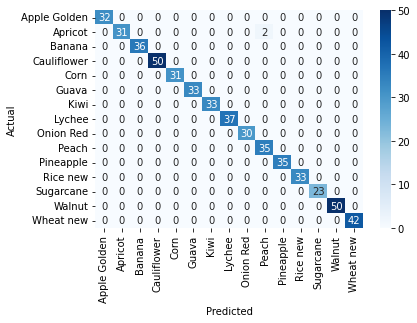

test accuracy : 99.62476547842401


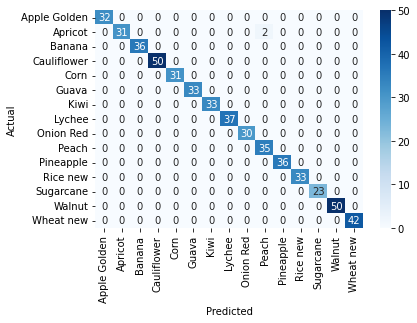

test accuracy : 99.625468164794


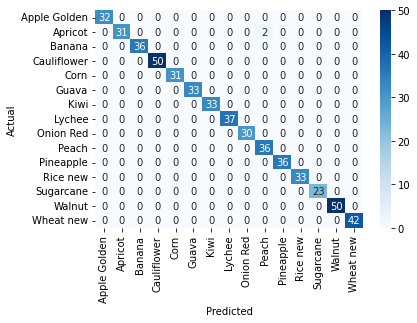

test accuracy : 99.62616822429906


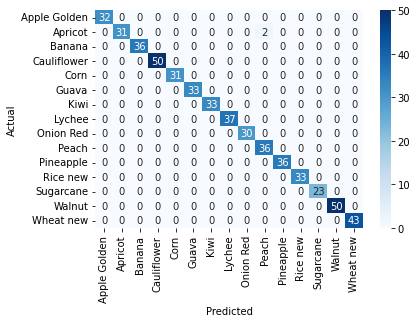

test accuracy : 99.6268656716418


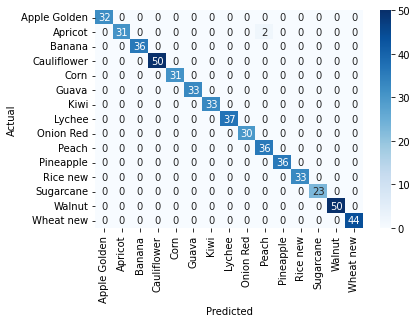

test accuracy : 99.62756052141528


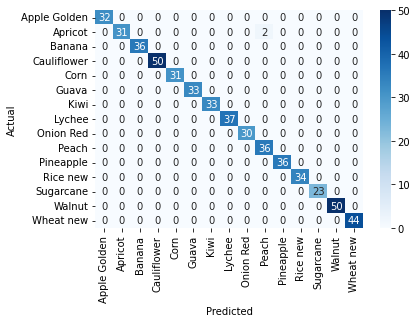

test accuracy : 99.62825278810409


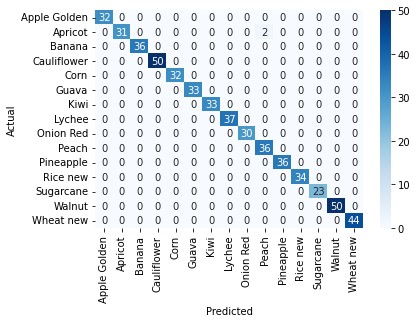

test accuracy : 99.62894248608535


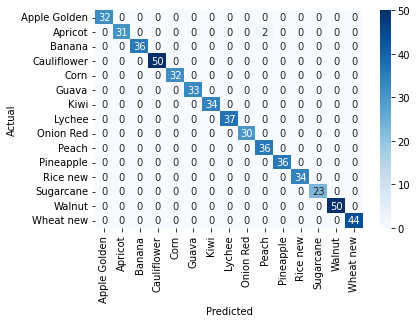

test accuracy : 99.62962962962963


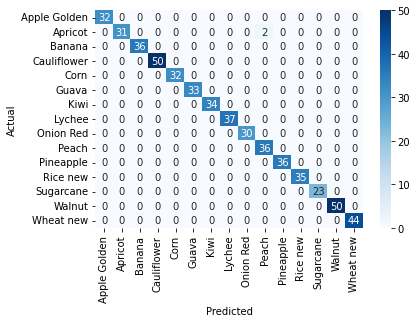

test accuracy : 99.63031423290202


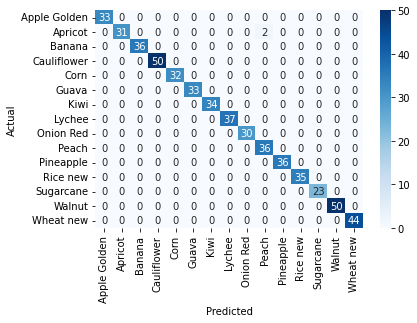

test accuracy : 99.63099630996311


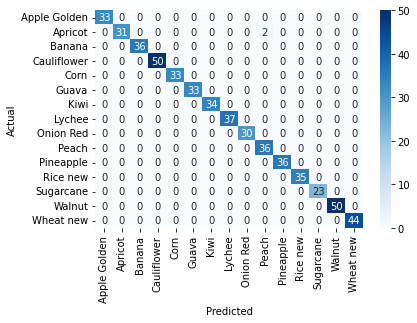

test accuracy : 99.6316758747698


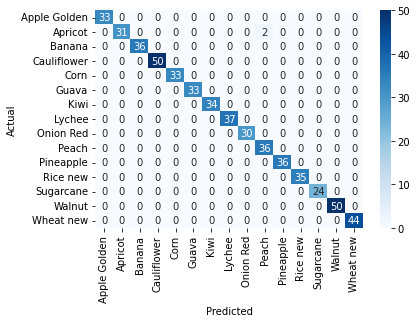

test accuracy : 99.63235294117648


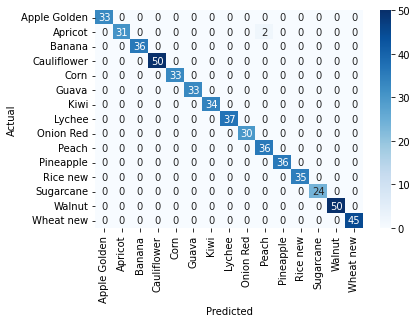

test accuracy : 99.63302752293578


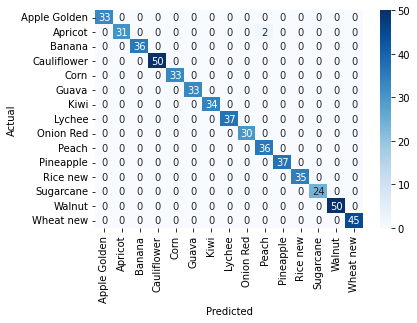

test accuracy : 99.63369963369964


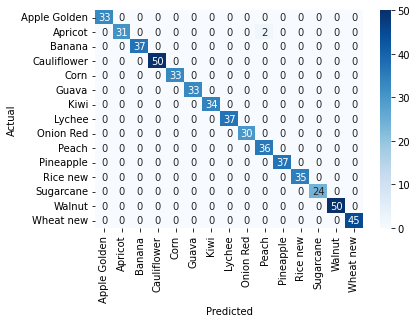

test accuracy : 99.6343692870201


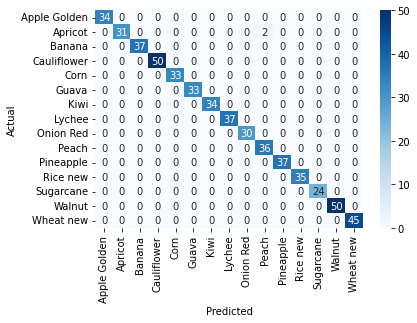

test accuracy : 99.63503649635037


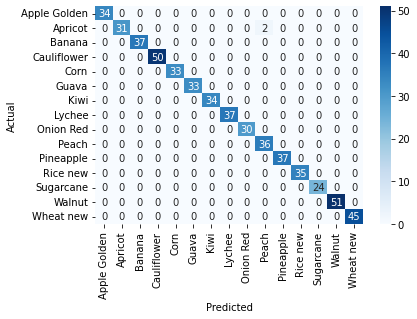

test accuracy : 99.63570127504553


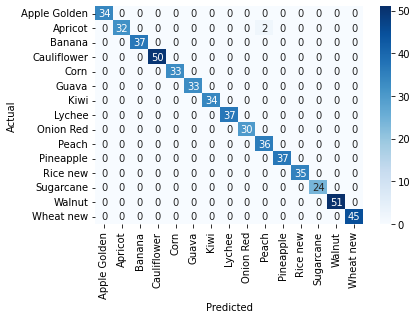

test accuracy : 99.63636363636364


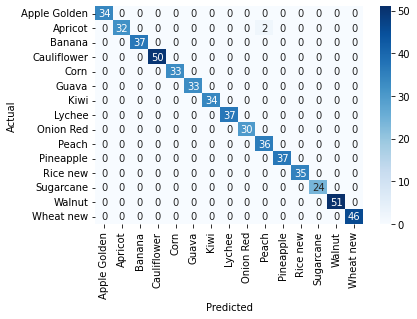

test accuracy : 99.63702359346642


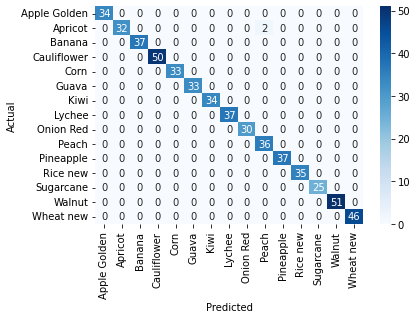

test accuracy : 99.63768115942028


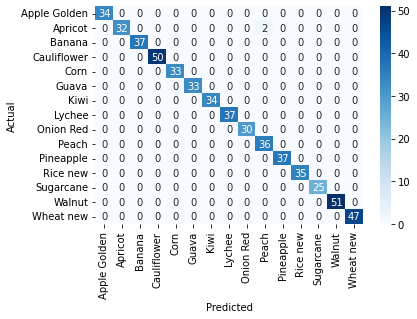

test accuracy : 99.63833634719711


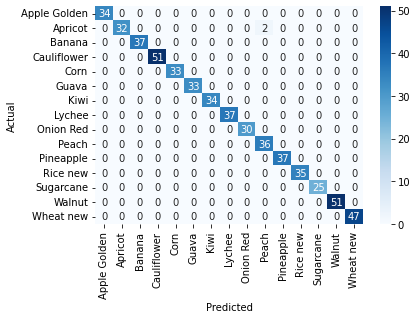

test accuracy : 99.63898916967509


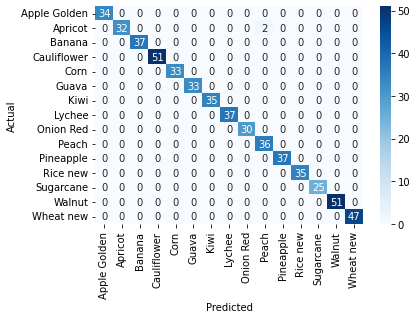

test accuracy : 99.63963963963964


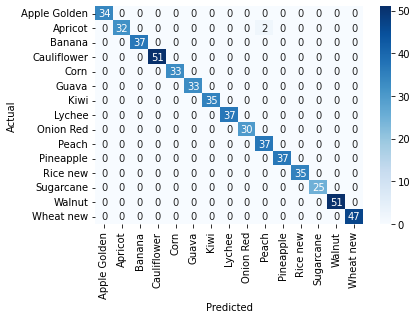

test accuracy : 99.64028776978418


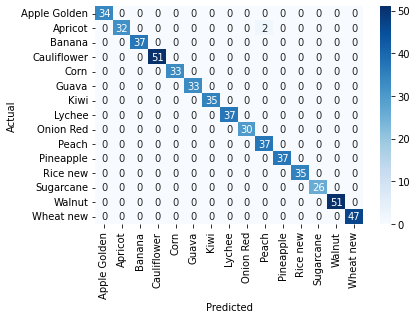

test accuracy : 99.64093357271095


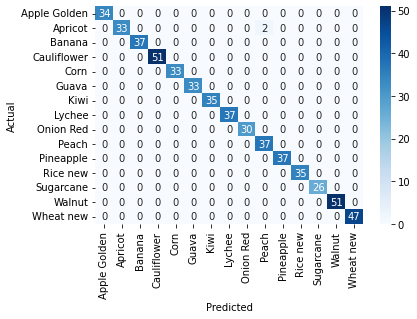

test accuracy : 99.6415770609319


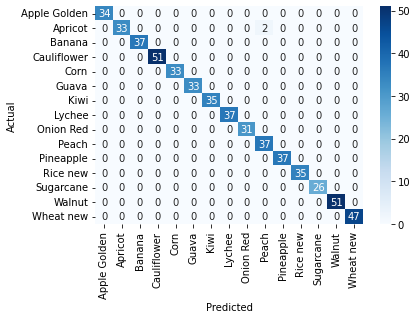

test accuracy : 99.6422182468694


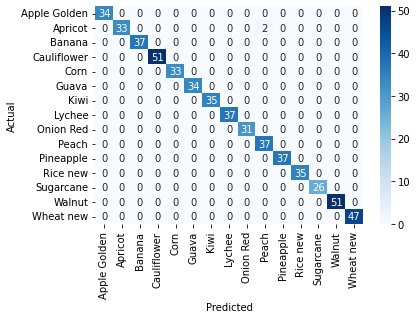

test accuracy : 99.64285714285714


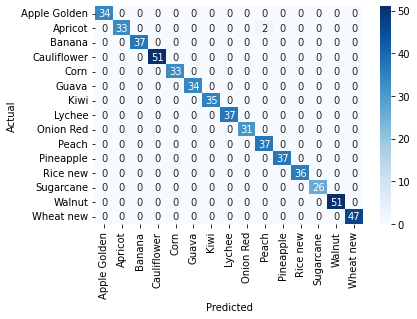

test accuracy : 99.64349376114082


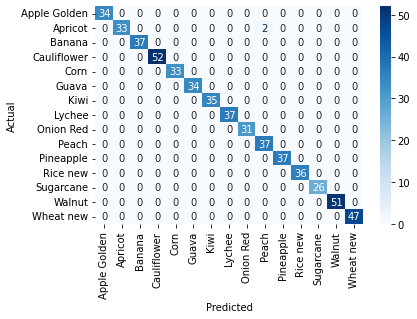

test accuracy : 99.644128113879


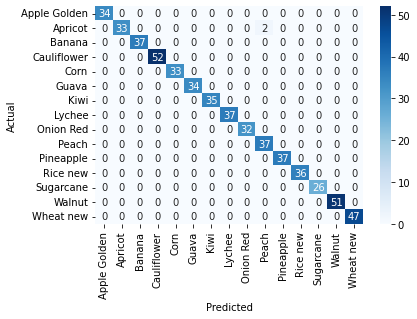

test accuracy : 99.64476021314387


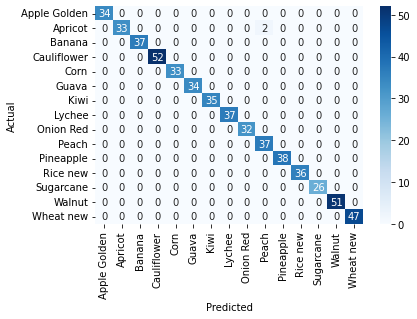

test accuracy : 99.64539007092199


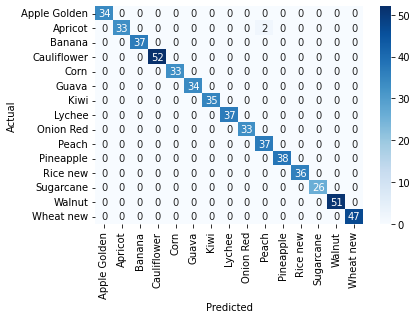

test accuracy : 99.64601769911503


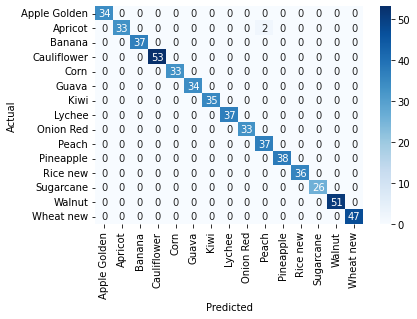

test accuracy : 99.64664310954063


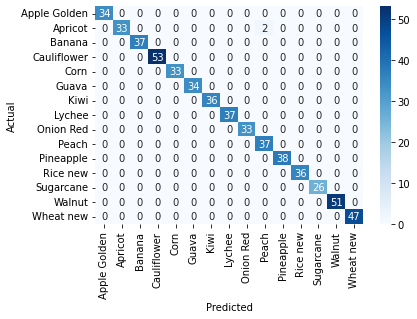

test accuracy : 99.64726631393297


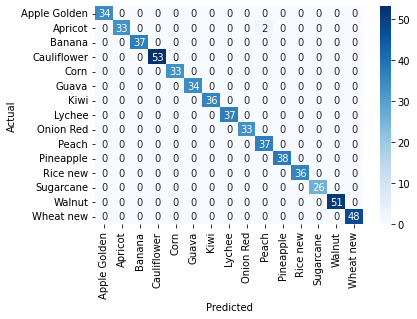

test accuracy : 99.64788732394366


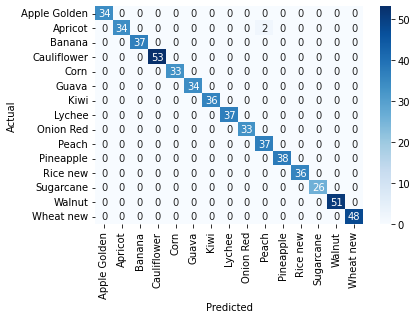

test accuracy : 99.64850615114236


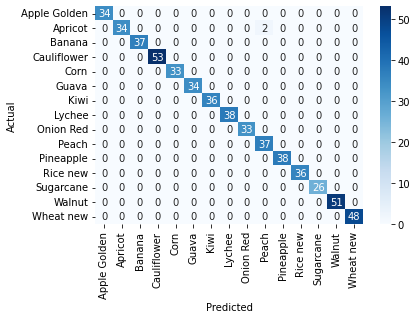

test accuracy : 99.64912280701755


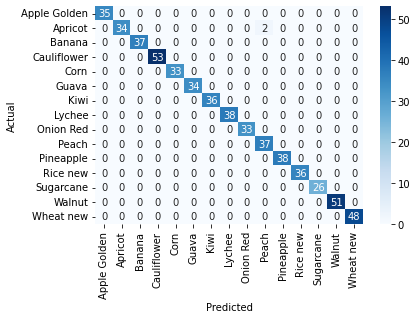

test accuracy : 99.64973730297724


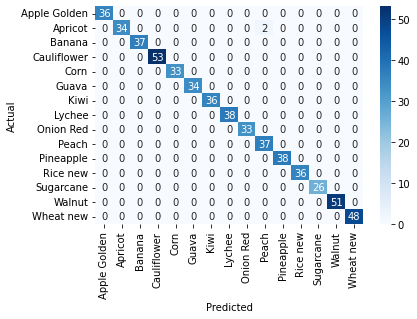

test accuracy : 99.65034965034964


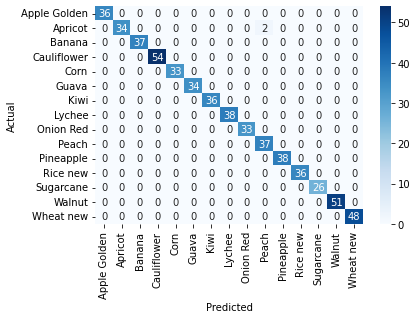

test accuracy : 99.65095986038395


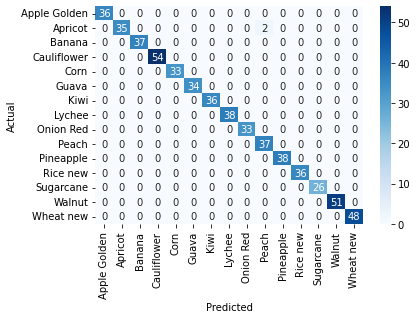

test accuracy : 99.65156794425087


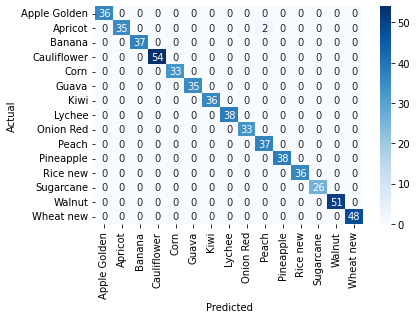

test accuracy : 99.65217391304347


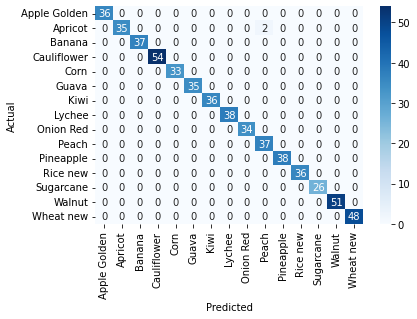

test accuracy : 99.65277777777779


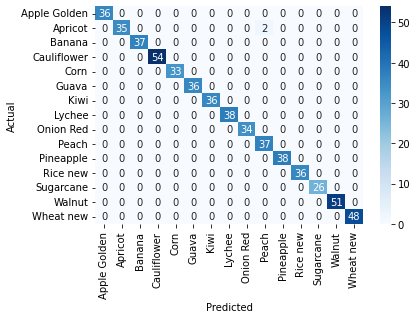

test accuracy : 99.65337954939342


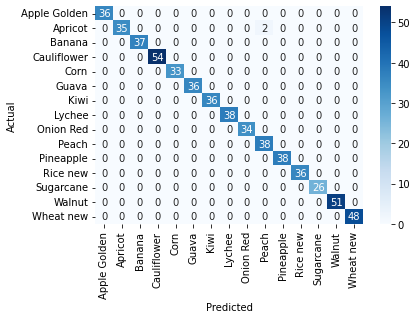

test accuracy : 99.65397923875432


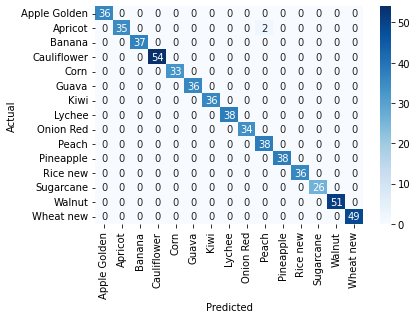

test accuracy : 99.65457685664938


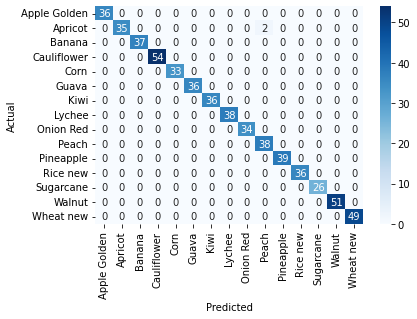

test accuracy : 99.6551724137931


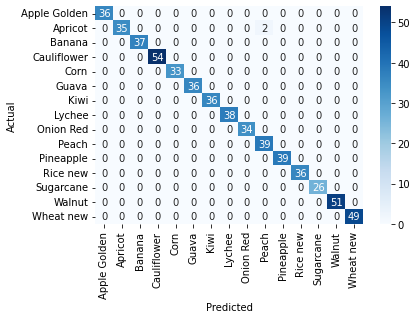

test accuracy : 99.65576592082617


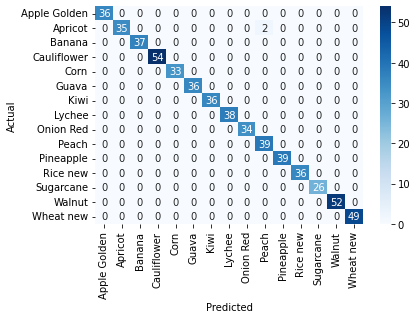

test accuracy : 99.65635738831615


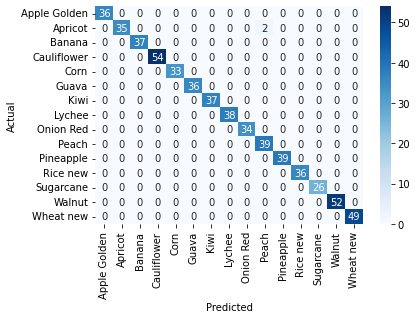

test accuracy : 99.65694682675816


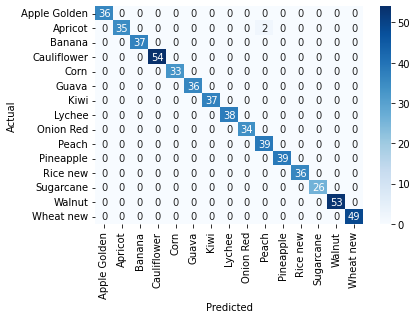

test accuracy : 99.65753424657534


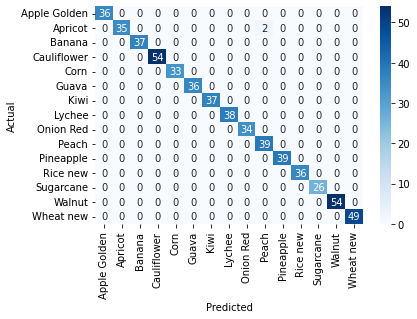

test accuracy : 99.65811965811966


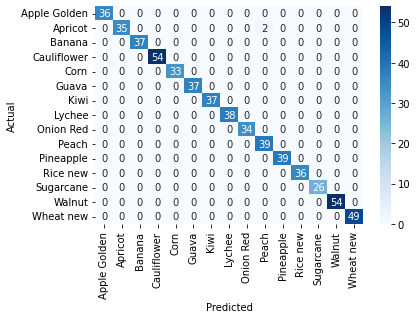

test accuracy : 99.65870307167235


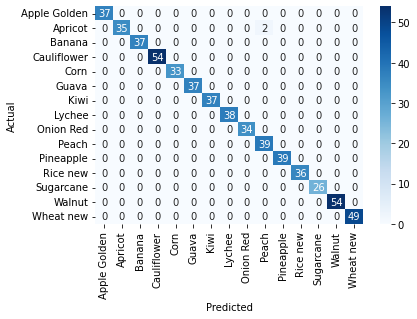

test accuracy : 99.65928449744463


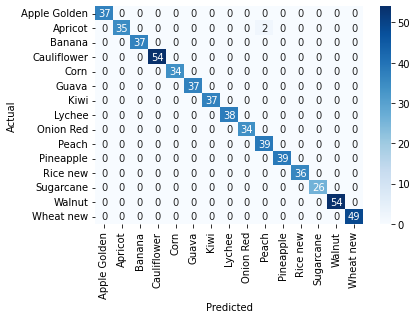

test accuracy : 99.65986394557824


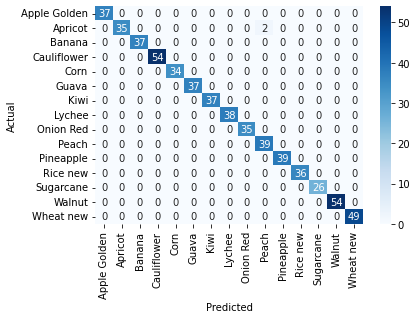

test accuracy : 99.66044142614601


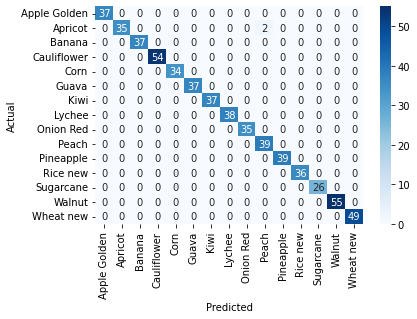

test accuracy : 99.66101694915255


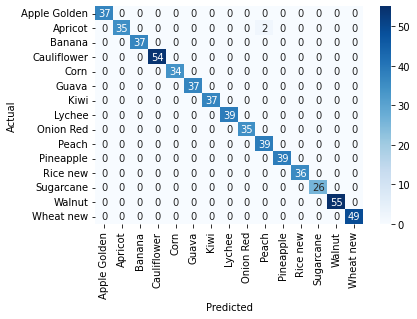

test accuracy : 99.66159052453469


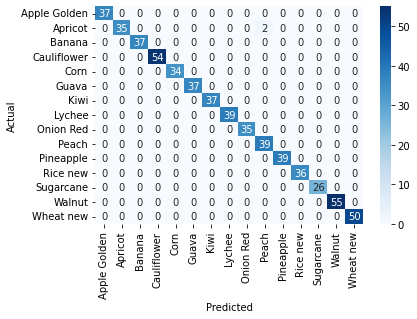

test accuracy : 99.66216216216216


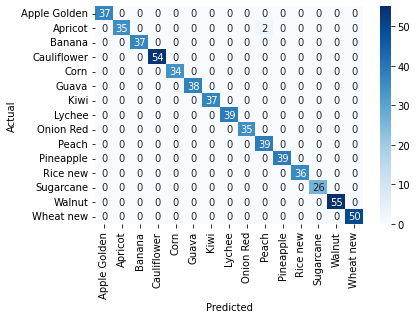

test accuracy : 99.6627318718381


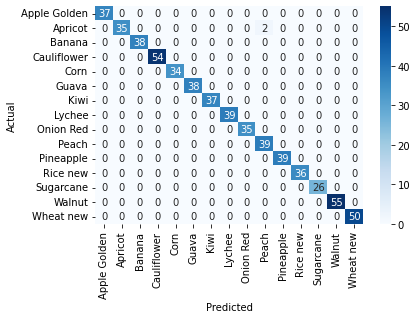

test accuracy : 99.66329966329967


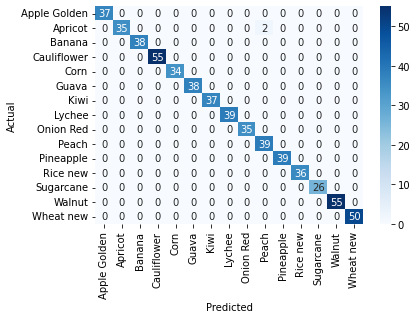

test accuracy : 99.66386554621849


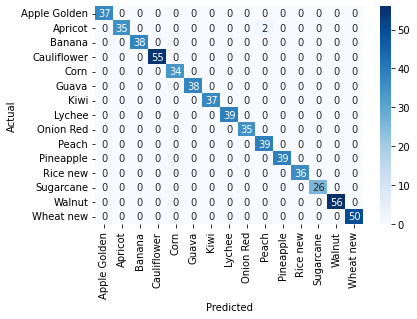

test accuracy : 99.66442953020133


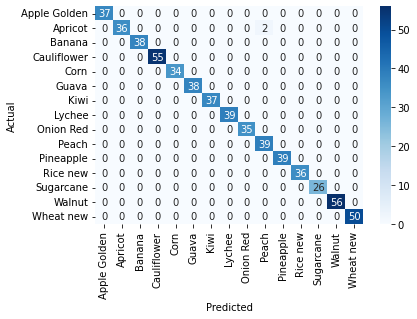

test accuracy : 99.66499162479062


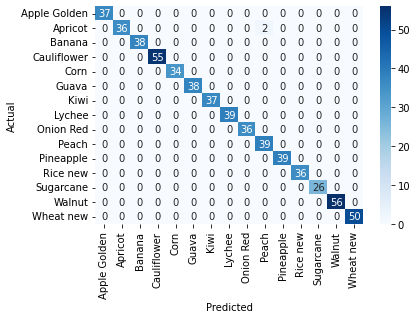

test accuracy : 99.66555183946488


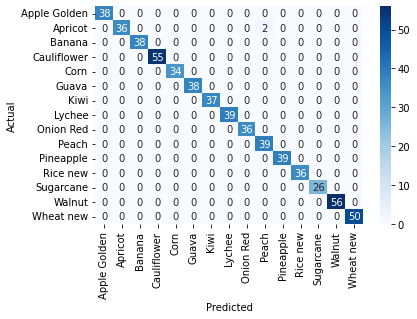

test accuracy : 99.6661101836394


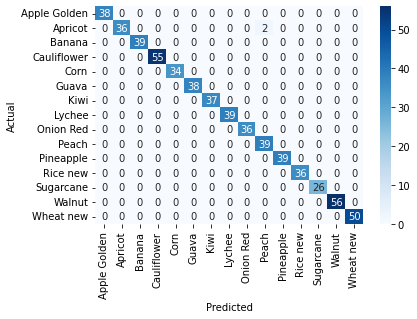

test accuracy : 99.66666666666667


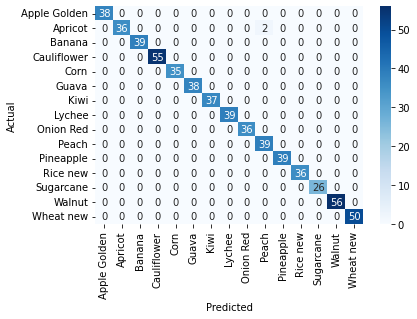

test accuracy : 99.66722129783693


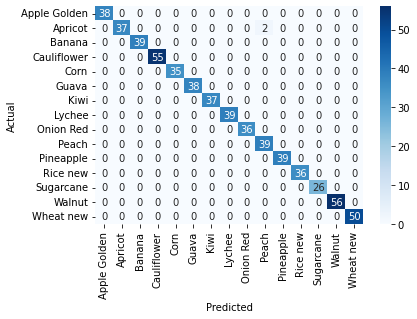

test accuracy : 99.66777408637874


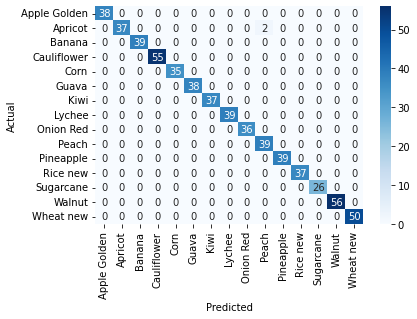

test accuracy : 99.66832504145937


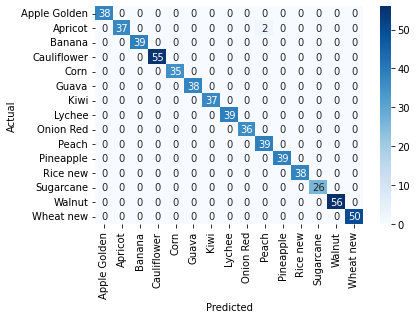

test accuracy : 99.66887417218543


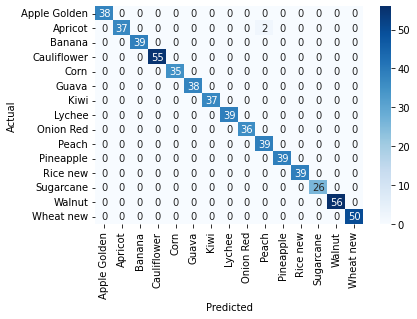

test accuracy : 99.6694214876033


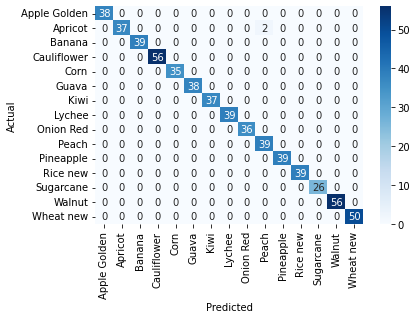

test accuracy : 99.66996699669967


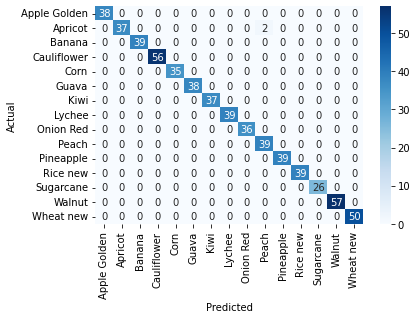

test accuracy : 99.67051070840198


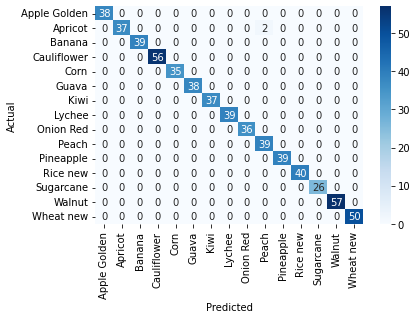

test accuracy : 99.67105263157895


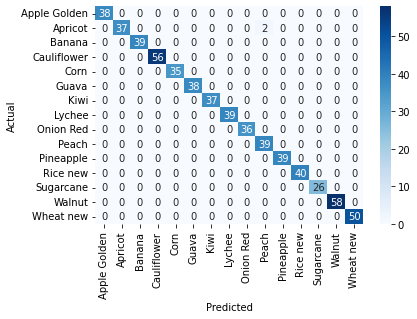

test accuracy : 99.67159277504105


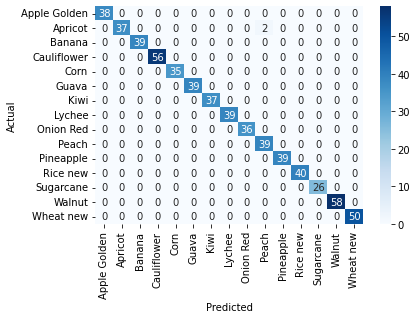

test accuracy : 99.672131147541


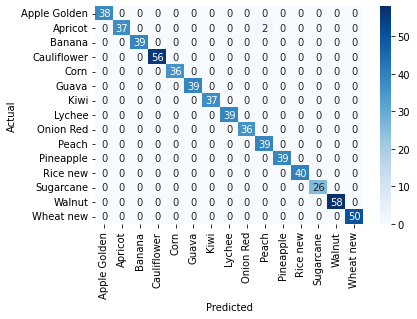

test accuracy : 99.67266775777414


In [ ]:
import pandas as pd
import seaborn as sn
import tensorflow as tf

model = tf.keras.models.load_model("/content/drive/MyDrive/Manual resnet h5/base_model.h5")
filenames = test_generator.filenames
nb_samples = len(test_generator)
y_prob=[]
y_act=[]
test_generator.reset()
for _ in range(nb_samples):
  X_test,Y_test = test_generator.next()
  y_prob.append(model.predict(X_test))
  y_act.append(Y_test)
  
  predicted_class = [list(train_generator.class_indices.keys())[i.argmax()] for i in y_prob]
  actual_class = [list(train_generator.class_indices.keys())[i.argmax()] for i in y_act]
  print

  out_df = pd.DataFrame(np.vstack([predicted_class,actual_class]).T,columns=['predicted_class','actual_class'])
  confusion_matrix = pd.crosstab(out_df['actual_class'],out_df['predicted_class'], rownames=['Actual'], colnames=['Predicted'])

  sn.heatmap(confusion_matrix,cmap='Blues', annot=True,fmt='d')
  plt.show()
  print('test accuracy : {}'.format((np.diagonal(confusion_matrix).sum()/confusion_matrix.sum().sum()*100)))